In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as neural_network
import torch.nn.functional as functions
import torchvision.transforms as transforms
import torch.nn as model
import torch.nn.functional as functions
import torch.optim as optim

from torchvision import datasets

# Generating Digits using Gans

A generative adversarial network (GAN) is a class of machine learning frameworks designed by Ian Goodfellow and his colleagues in 2014. Two neural networks contest with each other in a game (in the form of a zero-sum game, where one agent's gain is another agent's loss). 

- More about GAN: https://en.wikipedia.org/wiki/Generative_adversarial_network
- More about PyTorch: https://pytorch.org/


## About this notebook
This notebook kernel was created to help you understand more about machine learning. I intend to create tutorials with several machine learning algorithms from basic to advanced. I hope I can help you with this data science trail. For any information, you can contact me through the link below.

**Contact me: https://www.linkedin.com/in/vitorgamalemos/**

Other noteboks about neural networks:

- Simple Perceptron: https://www.kaggle.com/vitorgamalemos/neural-network-01-simple-perceptron
- Multilayer Perceptron: https://www.kaggle.com/vitorgamalemos/neural-network-02-multilayer-perceptron
- Convolutional neural network: https://www.kaggle.com/vitorgamalemos/object-recognition-using-convolutional-network

## Download Data Digits and Transform

In [2]:
def download_data_digits():
    return datasets.MNIST(root='data', train=True, download=True, transform=transforms.ToTensor())

train_data = download_data_digits()

Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw




Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw


Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw
Processing...
Done!


/opt/conda/lib/python3.7/site-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729138878/work/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


## Train Data Loader

In [3]:
train = torch.utils.data.DataLoader(train_data, batch_size=64, num_workers=2)

## Visualizating Samples Test

In [4]:
def show_samples_test(length=10):
    images, labels = iter(train).next()
    images = images.numpy()
    
    indexes = 0
    for k in range(0, 5):
        fig, axs = plt.subplots(1, length, figsize=(10, 10))

        for i in range(0, length):
            axs[i].imshow(np.squeeze(images[i + indexes]), label=labels[i + i + indexes])
            axs[i].set_title('Y: {}'.format(labels[i + indexes]))
            leg = axs[i].legend()
            
        indexes += 10


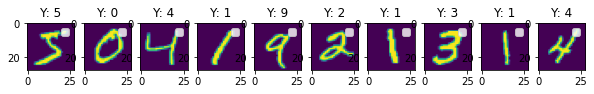

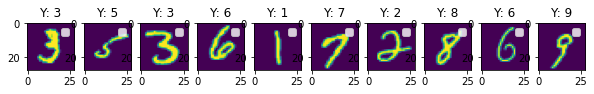

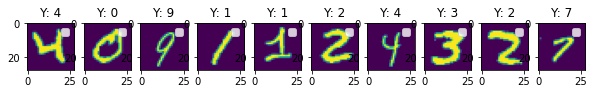

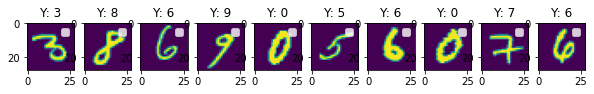

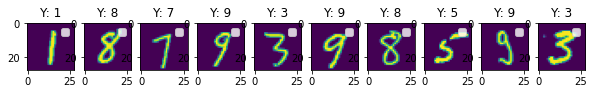

In [5]:
show_samples_test(10)

## Discriminator Network

Discriminator Training Data
The discriminator's training data comes from two sources:

- Real data instances, such as real pictures of people. The discriminator uses these instances as positive examples during training.
- Fake data instances created by the generator. The discriminator uses these instances as negative examples during training.


**Reference: https://developers.google.com/machine-learning/gan/discriminator**

<img src="https://sthalles.github.io/assets/dcgan/GANs.png">

In [6]:
class Discriminator(neural_network.Module):

    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.input_layer    = neural_network.Linear(784, 128)
        self.hidden_layer_1 = neural_network.Linear(128, 64)
        self.hidden_layer_2 = neural_network.Linear(64, 32)
        self.output_layer   = neural_network.Linear(32, 1)

        self.dropout = neural_network.Dropout(0.3)
        
        
    def forward(self, img_input):
        img_input = img_input.view(-1, 28 * 28)
        img_input = functions.leaky_relu(self.input_layer(img_input), 0.2) 
        img_input = self.dropout(img_input)
        img_input = functions.leaky_relu(self.hidden_layer_1(img_input), 0.2)
        img_input = self.dropout(img_input)
        img_input = functions.leaky_relu(self.hidden_layer_2(img_input), 0.2)
        img_input = self.dropout(img_input)
        
        return self.output_layer(img_input)


## Generator Network

The generator part of a GAN learns to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real.

Generator training requires tighter integration between the generator and the discriminator than discriminator training requires. The portion of the GAN that trains the generator includes:

- random input
- generator network, which transforms the random input into a data instance
- discriminator network, which classifies the generated data
- discriminator output
- generator loss, which penalizes the generator for failing to fool the discriminator


**Reference: https://developers.google.com/machine-learning/gan/discriminator**
   
<img src=" https://www.researchgate.net/publication/310610555/figure/fig4/AS:668380134662151@1536365650654/Architecture-of-the-generator-a-and-discriminator-b-of-our-cGAN-model-The-generator.ppm">

In [7]:
class Generator(neural_network.Module):

    def __init__(self):
        super(Generator, self).__init__()

        self.input_layer    =  neural_network.Linear(100, 32)
        self.hidden_layer_1 =  neural_network.Linear(32, 64)
        self.hidden_layer_2 =  neural_network.Linear(64, 128)
        self.output_layer   =  neural_network.Linear(128, 784)
        
        self.dropout = neural_network.Dropout(0.3)

    def forward(self, img_input):
        img_input = functions.leaky_relu(self.input_layer(img_input), 0.2)
        img_input = self.dropout(img_input)
        img_input = functions.leaky_relu(self.hidden_layer_1(img_input), 0.2)
        img_input = self.dropout(img_input)
        img_input = functions.leaky_relu(self.hidden_layer_2(img_input), 0.2)
        img_input = self.dropout(img_input)
        
        return functions.tanh(self.output_layer(img_input))


In [8]:
D = Discriminator()

In [9]:
G = Generator()

In [10]:
def real_loss(D_out):
    batch_size = D_out.size(0)
    criterion = neural_network.BCEWithLogitsLoss()
    return criterion(D_out.squeeze(), torch.ones(batch_size) * 0.9)
    

def fake_loss(D_out):
    criterion = neural_network.BCEWithLogitsLoss()
    return criterion(D_out.squeeze(), torch.zeros(D_out.size(0)))

In [11]:
d_optimizer = optim.Adam(D.parameters(), 0.002)
g_optimizer = optim.Adam(G.parameters(), 0.002)

# GAN Training
Because a GAN contains two separately trained networks, its training algorithm must address two complications:

- GANs must juggle two different kinds of training (generator and discriminator).
- GAN convergence is hard to identify.

Alternating Training
The generator and the discriminator have different training processes. So how do we train the GAN as a whole?

GAN training proceeds in alternating periods:

- The discriminator trains for one or more epochs.
- The generator trains for one or more epochs.
- Repeat steps 1 and 2 to continue to train the generator and discriminator networks.

**Reference: https://developers.google.com/machine-learning/gan/training**

## Train Discriminator

<img src="https://www.researchgate.net/publication/333831200/figure/fig5/AS:782113389412353@1563481771648/GAN-framework-in-which-the-generator-and-discriminator-are-learned-during-the-training.png">

In [12]:
def train_discriminator(G, D, optimizer, real_data, batch_size, size):
    real_data = scale(real_data.view(batch_size, -1))

    optimizer.zero_grad()
    D.train()

    fake_data = G.forward(random_vector(batch_size, size))
    total_loss = real_loss(D.forward(real_data)) + fake_loss(D.forward(fake_data))
    total_loss.backward()
    optimizer.step()
    
    return total_loss

## Train Generator

In [13]:

def train_generator(G, D, optimizer, batch_size, size):
    optimizer.zero_grad()
    G.train()
    fake_data = G.forward(random_vector(batch_size, size))
    loss = real_loss(D.forward(fake_data))
    loss.backward()
    optimizer.step()
    return loss

In [14]:
def random_vector(batch_size, lenx):
    return torch.randn(batch_size, lenx).float()

In [15]:
def show_training_sample(data):
    fig, axes = plt.subplots(figsize=(7,7), nrows=4, ncols=4)
    for ax, img in zip(axes.flatten(), data[-1]):
        img = img.detach()
        ax.imshow(img.reshape((28,28)))
    plt.show()
    
    
def show_training_loss(d_loss_, g_loss):
    plt.plot(d_loss_arr, label="N.Discriminator", alpha=0.5)
    plt.plot(g_loss_arr, label="N.Generator", alpha=0.5)
    plt.title("Trainings loss")
    plt.legend()
    plt.show()
    

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[1] -- discriminator_loss: 1.388082504272461  -- generator_loss: 0.7091497182846069
[1] -- discriminator_loss: 1.328315258026123  -- generator_loss: 0.7109706997871399
[1] -- discriminator_loss: 1.2198781967163086  -- generator_loss: 0.8147238492965698
[1] -- discriminator_loss: 1.3020597696304321  -- generator_loss: 0.8633407950401306
[1] -- discriminator_loss: 0.5791364312171936  -- generator_loss: 2.859942674636841
[1] -- discriminator_loss: 0.8227900266647339  -- generator_loss: 1.8490803241729736
[1] -- discriminator_loss: 1.1862934827804565  -- generator_loss: 0.830681324005127
[1] -- discriminator_loss: 0.3864404559135437  -- generator_loss: 4.1176018714904785
[1] -- discriminator_loss: 0.6585638523101807  -- generator_loss: 1.8450136184692383
[1] -- discriminator_loss: 0.5527805089950562  -- generator_loss: 2.8742687702178955
[1] -- discriminator_loss: 0.809083104133606  -- generator_loss: 2.9773576259613037
[1] -- discriminator_loss: 0.7914650440216064  -- generator_loss: 2.33

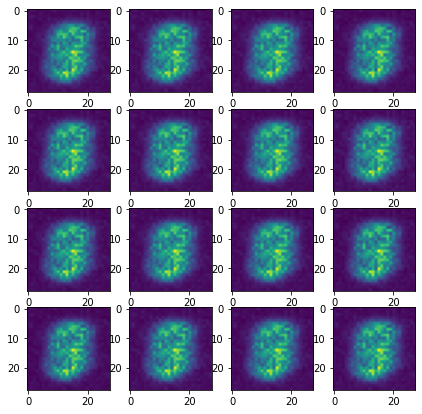

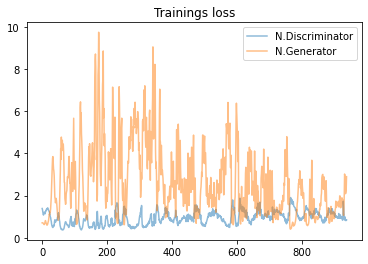

[2] -- discriminator_loss: 0.8232147693634033  -- generator_loss: 2.890768051147461
[2] -- discriminator_loss: 0.9188154935836792  -- generator_loss: 3.5415587425231934
[2] -- discriminator_loss: 1.3877131938934326  -- generator_loss: 1.233004093170166
[2] -- discriminator_loss: 0.9183496832847595  -- generator_loss: 1.3878278732299805
[2] -- discriminator_loss: 0.9534441828727722  -- generator_loss: 2.7806575298309326
[2] -- discriminator_loss: 1.2137696743011475  -- generator_loss: 1.2465202808380127
[2] -- discriminator_loss: 0.8624446392059326  -- generator_loss: 2.4061436653137207
[2] -- discriminator_loss: 0.6948477625846863  -- generator_loss: 2.6402509212493896
[2] -- discriminator_loss: 0.7357401847839355  -- generator_loss: 2.1409215927124023
[2] -- discriminator_loss: 1.1225050687789917  -- generator_loss: 1.0960451364517212
[2] -- discriminator_loss: 1.11411452293396  -- generator_loss: 1.4107283353805542
[2] -- discriminator_loss: 0.7959648370742798  -- generator_loss: 3.0

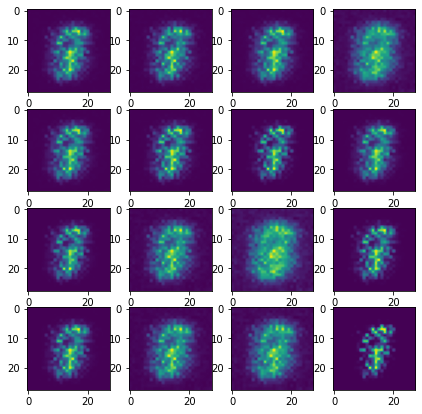

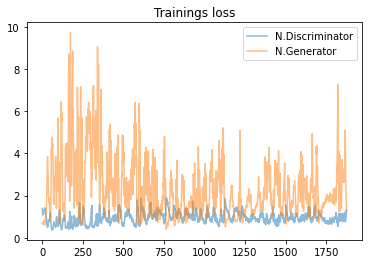

[3] -- discriminator_loss: 1.152519702911377  -- generator_loss: 1.6479097604751587
[3] -- discriminator_loss: 0.9267349243164062  -- generator_loss: 2.1919403076171875
[3] -- discriminator_loss: 1.155232310295105  -- generator_loss: 0.9207406640052795
[3] -- discriminator_loss: 0.850090503692627  -- generator_loss: 1.754638671875
[3] -- discriminator_loss: 0.8958436250686646  -- generator_loss: 2.090082883834839
[3] -- discriminator_loss: 1.095558524131775  -- generator_loss: 1.0355429649353027
[3] -- discriminator_loss: 1.005894422531128  -- generator_loss: 1.1537421941757202
[3] -- discriminator_loss: 0.7260051965713501  -- generator_loss: 2.8008575439453125
[3] -- discriminator_loss: 1.0860480070114136  -- generator_loss: 0.8619875907897949
[3] -- discriminator_loss: 0.9769117832183838  -- generator_loss: 1.4746383428573608
[3] -- discriminator_loss: 0.7800928354263306  -- generator_loss: 1.6096340417861938
[3] -- discriminator_loss: 0.7898853421211243  -- generator_loss: 2.6015462

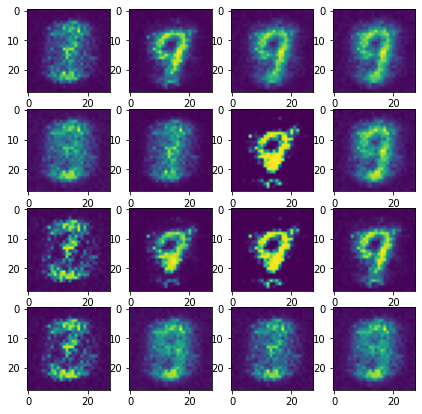

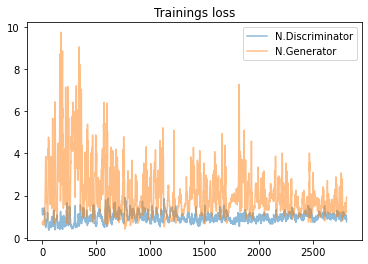

[4] -- discriminator_loss: 1.0374269485473633  -- generator_loss: 1.9221879243850708
[4] -- discriminator_loss: 0.9723945260047913  -- generator_loss: 1.9456877708435059
[4] -- discriminator_loss: 1.0044763088226318  -- generator_loss: 1.7990566492080688
[4] -- discriminator_loss: 1.0012789964675903  -- generator_loss: 1.5766620635986328
[4] -- discriminator_loss: 1.0861141681671143  -- generator_loss: 1.1913034915924072
[4] -- discriminator_loss: 1.0425901412963867  -- generator_loss: 1.7366492748260498
[4] -- discriminator_loss: 1.0548818111419678  -- generator_loss: 2.082267999649048
[4] -- discriminator_loss: 1.0688912868499756  -- generator_loss: 1.5492455959320068
[4] -- discriminator_loss: 1.0428216457366943  -- generator_loss: 1.32994544506073
[4] -- discriminator_loss: 0.9899371862411499  -- generator_loss: 1.8862342834472656
[4] -- discriminator_loss: 0.9176576137542725  -- generator_loss: 2.0683822631835938
[4] -- discriminator_loss: 1.0354297161102295  -- generator_loss: 2.

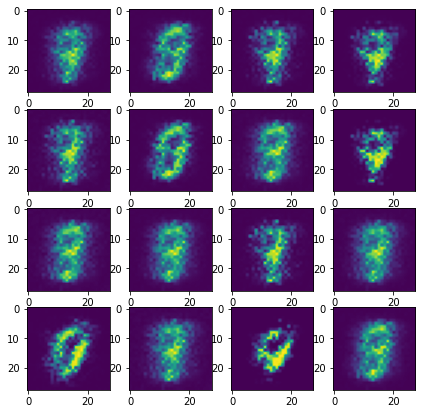

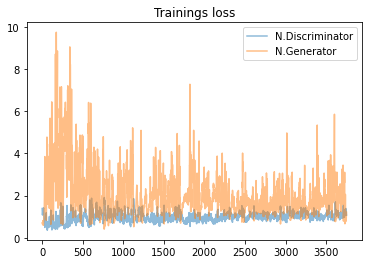

[5] -- discriminator_loss: 1.1861017942428589  -- generator_loss: 1.4586725234985352
[5] -- discriminator_loss: 1.1050968170166016  -- generator_loss: 1.5123341083526611
[5] -- discriminator_loss: 1.1291444301605225  -- generator_loss: 1.1929292678833008
[5] -- discriminator_loss: 1.2163136005401611  -- generator_loss: 0.952164351940155
[5] -- discriminator_loss: 1.1958204507827759  -- generator_loss: 1.0733518600463867
[5] -- discriminator_loss: 1.1127655506134033  -- generator_loss: 1.93589448928833
[5] -- discriminator_loss: 1.0763278007507324  -- generator_loss: 1.6012505292892456
[5] -- discriminator_loss: 1.2409441471099854  -- generator_loss: 1.235411524772644
[5] -- discriminator_loss: 1.266517162322998  -- generator_loss: 1.1086463928222656
[5] -- discriminator_loss: 1.0173523426055908  -- generator_loss: 1.7718546390533447
[5] -- discriminator_loss: 1.211609959602356  -- generator_loss: 1.1140985488891602
[5] -- discriminator_loss: 0.9963765144348145  -- generator_loss: 1.263

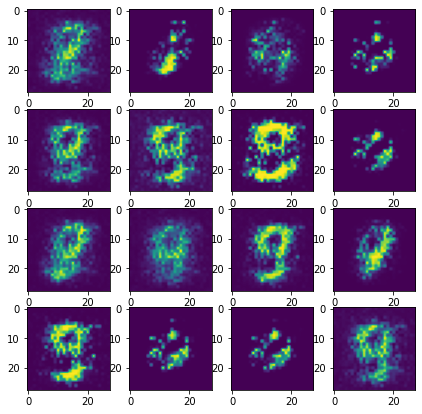

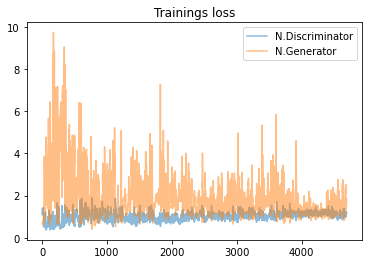

[6] -- discriminator_loss: 1.1841323375701904  -- generator_loss: 1.6256448030471802
[6] -- discriminator_loss: 1.2133800983428955  -- generator_loss: 1.7483597993850708
[6] -- discriminator_loss: 1.1491022109985352  -- generator_loss: 2.1829166412353516
[6] -- discriminator_loss: 1.2004350423812866  -- generator_loss: 4.1861467361450195
[6] -- discriminator_loss: 1.035015344619751  -- generator_loss: 2.9316258430480957
[6] -- discriminator_loss: 1.2531840801239014  -- generator_loss: 1.950319766998291
[6] -- discriminator_loss: 1.3577444553375244  -- generator_loss: 1.7197434902191162
[6] -- discriminator_loss: 1.182877779006958  -- generator_loss: 1.8336105346679688
[6] -- discriminator_loss: 1.2296310663223267  -- generator_loss: 1.3252487182617188
[6] -- discriminator_loss: 1.1310933828353882  -- generator_loss: 1.3852323293685913
[6] -- discriminator_loss: 1.1355899572372437  -- generator_loss: 1.3098853826522827
[6] -- discriminator_loss: 1.055942416191101  -- generator_loss: 1.1

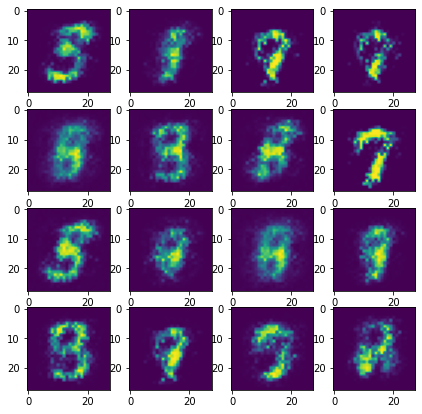

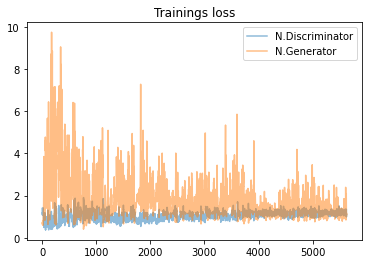

[7] -- discriminator_loss: 1.021038293838501  -- generator_loss: 1.4667304754257202
[7] -- discriminator_loss: 1.1849133968353271  -- generator_loss: 1.3314483165740967
[7] -- discriminator_loss: 1.1252121925354004  -- generator_loss: 1.228379487991333
[7] -- discriminator_loss: 1.1321969032287598  -- generator_loss: 1.2607171535491943
[7] -- discriminator_loss: 1.1613104343414307  -- generator_loss: 1.219166874885559
[7] -- discriminator_loss: 1.1277132034301758  -- generator_loss: 0.9469736814498901
[7] -- discriminator_loss: 1.1910330057144165  -- generator_loss: 1.227513313293457
[7] -- discriminator_loss: 1.130973219871521  -- generator_loss: 1.375630497932434
[7] -- discriminator_loss: 1.284757375717163  -- generator_loss: 1.2303191423416138
[7] -- discriminator_loss: 1.3507188558578491  -- generator_loss: 0.7908123135566711
[7] -- discriminator_loss: 1.3005590438842773  -- generator_loss: 0.9661648273468018
[7] -- discriminator_loss: 1.3226591348648071  -- generator_loss: 1.3626

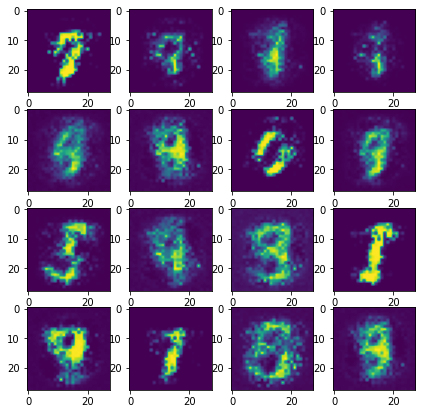

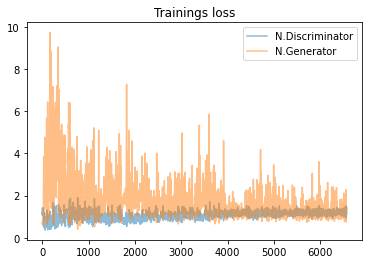

[8] -- discriminator_loss: 1.2388126850128174  -- generator_loss: 1.0279415845870972
[8] -- discriminator_loss: 1.2746989727020264  -- generator_loss: 1.005554437637329
[8] -- discriminator_loss: 1.1228787899017334  -- generator_loss: 1.0805245637893677
[8] -- discriminator_loss: 1.2365007400512695  -- generator_loss: 1.0662921667099
[8] -- discriminator_loss: 1.333725929260254  -- generator_loss: 1.0163636207580566
[8] -- discriminator_loss: 1.1953067779541016  -- generator_loss: 1.348921298980713
[8] -- discriminator_loss: 1.0036498308181763  -- generator_loss: 1.3061985969543457
[8] -- discriminator_loss: 0.9628102779388428  -- generator_loss: 1.4495128393173218
[8] -- discriminator_loss: 1.2158942222595215  -- generator_loss: 1.3566052913665771
[8] -- discriminator_loss: 1.2625653743743896  -- generator_loss: 1.4498753547668457
[8] -- discriminator_loss: 1.2707891464233398  -- generator_loss: 0.8920410871505737
[8] -- discriminator_loss: 1.20550537109375  -- generator_loss: 1.00490

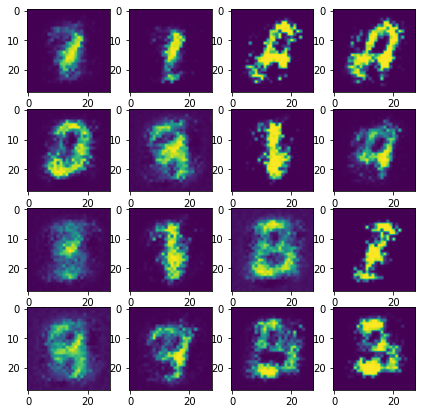

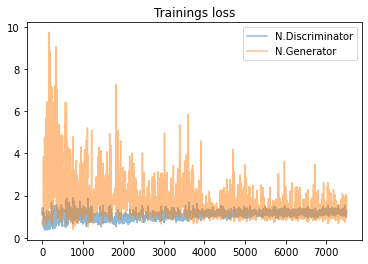

[9] -- discriminator_loss: 1.398037075996399  -- generator_loss: 0.9399008750915527
[9] -- discriminator_loss: 1.2673561573028564  -- generator_loss: 0.8931405544281006
[9] -- discriminator_loss: 1.275750756263733  -- generator_loss: 0.9879936575889587
[9] -- discriminator_loss: 1.387044906616211  -- generator_loss: 1.0765284299850464
[9] -- discriminator_loss: 1.1863218545913696  -- generator_loss: 1.2898318767547607
[9] -- discriminator_loss: 1.1128320693969727  -- generator_loss: 1.3865978717803955
[9] -- discriminator_loss: 1.1808619499206543  -- generator_loss: 1.1021919250488281
[9] -- discriminator_loss: 1.1680986881256104  -- generator_loss: 1.0649422407150269
[9] -- discriminator_loss: 1.2795495986938477  -- generator_loss: 1.2023589611053467
[9] -- discriminator_loss: 1.2522350549697876  -- generator_loss: 1.1321601867675781
[9] -- discriminator_loss: 1.2318525314331055  -- generator_loss: 1.1255221366882324
[9] -- discriminator_loss: 1.1422737836837769  -- generator_loss: 1.

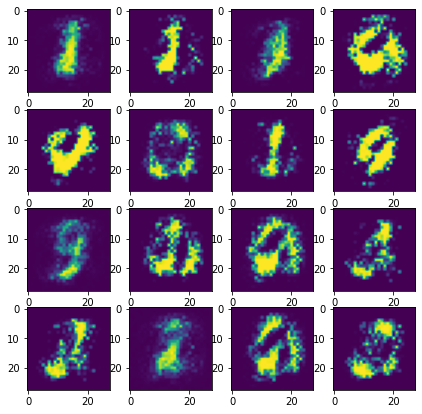

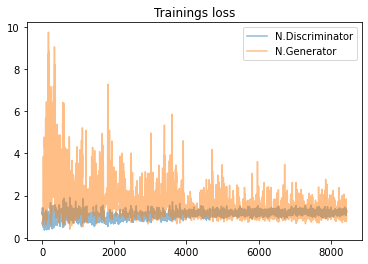

[10] -- discriminator_loss: 1.2796976566314697  -- generator_loss: 1.167372465133667
[10] -- discriminator_loss: 1.4328794479370117  -- generator_loss: 1.006848931312561
[10] -- discriminator_loss: 1.1886234283447266  -- generator_loss: 0.825954794883728
[10] -- discriminator_loss: 1.1418801546096802  -- generator_loss: 1.4403700828552246
[10] -- discriminator_loss: 1.1882340908050537  -- generator_loss: 1.1219712495803833
[10] -- discriminator_loss: 1.1527918577194214  -- generator_loss: 1.249049186706543
[10] -- discriminator_loss: 1.270121455192566  -- generator_loss: 1.1142480373382568
[10] -- discriminator_loss: 1.1732501983642578  -- generator_loss: 1.1854991912841797
[10] -- discriminator_loss: 1.3561040163040161  -- generator_loss: 1.4228546619415283
[10] -- discriminator_loss: 1.1152777671813965  -- generator_loss: 1.1179527044296265
[10] -- discriminator_loss: 1.2917144298553467  -- generator_loss: 1.113776683807373
[10] -- discriminator_loss: 1.101025938987732  -- generator_

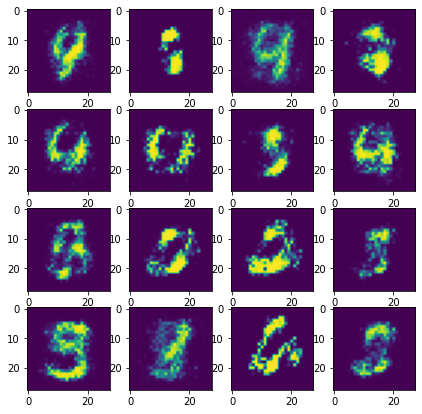

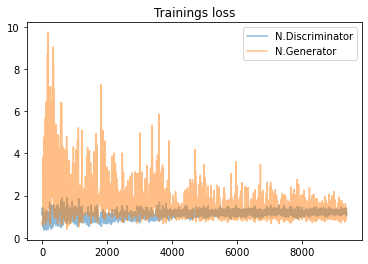

[11] -- discriminator_loss: 1.2345097064971924  -- generator_loss: 1.446259617805481
[11] -- discriminator_loss: 1.105468988418579  -- generator_loss: 1.5249396562576294
[11] -- discriminator_loss: 0.9983352422714233  -- generator_loss: 1.8173153400421143
[11] -- discriminator_loss: 1.301866054534912  -- generator_loss: 1.3797060251235962
[11] -- discriminator_loss: 1.295941948890686  -- generator_loss: 1.4119340181350708
[11] -- discriminator_loss: 1.2062418460845947  -- generator_loss: 0.986154317855835
[11] -- discriminator_loss: 1.3220922946929932  -- generator_loss: 0.7754217982292175
[11] -- discriminator_loss: 1.297874927520752  -- generator_loss: 0.8937551975250244
[11] -- discriminator_loss: 1.2356312274932861  -- generator_loss: 1.0035120248794556
[11] -- discriminator_loss: 1.2591679096221924  -- generator_loss: 1.6548359394073486
[11] -- discriminator_loss: 1.3090341091156006  -- generator_loss: 1.0364317893981934
[11] -- discriminator_loss: 1.235707402229309  -- generator_

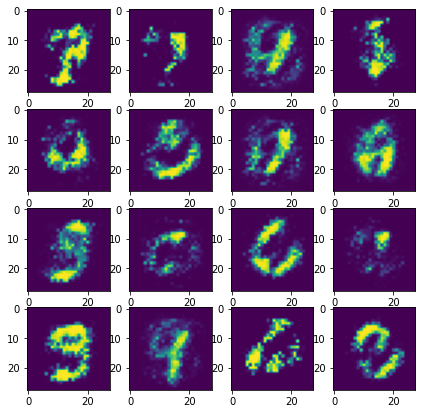

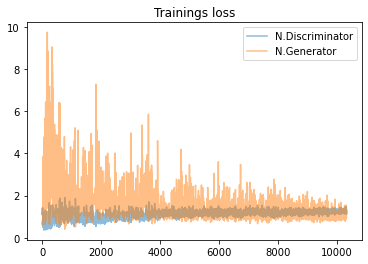

[12] -- discriminator_loss: 1.2969768047332764  -- generator_loss: 0.8068268299102783
[12] -- discriminator_loss: 1.2760756015777588  -- generator_loss: 0.8605829477310181
[12] -- discriminator_loss: 1.2253220081329346  -- generator_loss: 1.0643771886825562
[12] -- discriminator_loss: 1.2520742416381836  -- generator_loss: 1.2217744588851929
[12] -- discriminator_loss: 1.2482860088348389  -- generator_loss: 0.956241250038147
[12] -- discriminator_loss: 1.270965337753296  -- generator_loss: 1.2048301696777344
[12] -- discriminator_loss: 1.3454785346984863  -- generator_loss: 1.189202070236206
[12] -- discriminator_loss: 1.3097726106643677  -- generator_loss: 0.9117544293403625
[12] -- discriminator_loss: 1.235273838043213  -- generator_loss: 0.9027259349822998
[12] -- discriminator_loss: 1.3560072183609009  -- generator_loss: 0.7645846605300903
[12] -- discriminator_loss: 1.3322091102600098  -- generator_loss: 0.8636757731437683
[12] -- discriminator_loss: 1.1466033458709717  -- generat

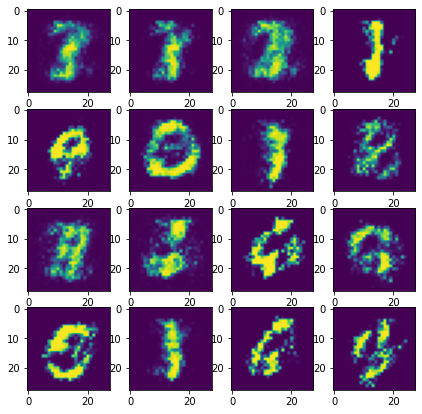

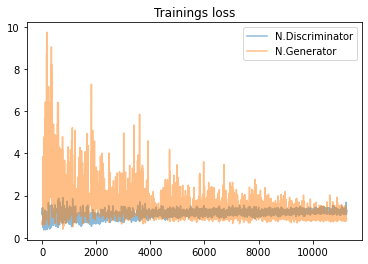

[13] -- discriminator_loss: 1.2553558349609375  -- generator_loss: 0.8802193999290466
[13] -- discriminator_loss: 1.2823233604431152  -- generator_loss: 0.8712370991706848
[13] -- discriminator_loss: 1.1905860900878906  -- generator_loss: 1.128575086593628
[13] -- discriminator_loss: 1.3988118171691895  -- generator_loss: 1.0535930395126343
[13] -- discriminator_loss: 1.2599568367004395  -- generator_loss: 0.9516194462776184
[13] -- discriminator_loss: 1.2599252462387085  -- generator_loss: 0.9280369281768799
[13] -- discriminator_loss: 1.1383566856384277  -- generator_loss: 1.3149464130401611
[13] -- discriminator_loss: 1.290834903717041  -- generator_loss: 0.9879852533340454
[13] -- discriminator_loss: 1.1877598762512207  -- generator_loss: 0.8732144236564636
[13] -- discriminator_loss: 1.2606147527694702  -- generator_loss: 0.8823111057281494
[13] -- discriminator_loss: 1.280977487564087  -- generator_loss: 0.9025043249130249
[13] -- discriminator_loss: 1.2478508949279785  -- genera

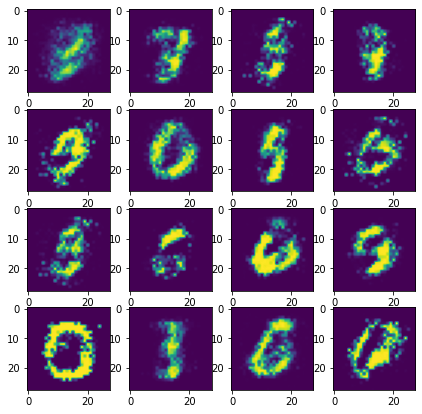

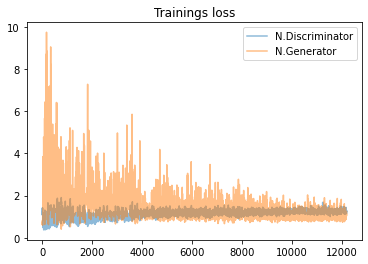

[14] -- discriminator_loss: 1.2063260078430176  -- generator_loss: 1.050205945968628
[14] -- discriminator_loss: 1.2427890300750732  -- generator_loss: 0.9613752961158752
[14] -- discriminator_loss: 1.2279809713363647  -- generator_loss: 1.1545015573501587
[14] -- discriminator_loss: 1.376051902770996  -- generator_loss: 1.011234998703003
[14] -- discriminator_loss: 1.3447504043579102  -- generator_loss: 0.9094310998916626
[14] -- discriminator_loss: 1.2641918659210205  -- generator_loss: 0.8919290900230408
[14] -- discriminator_loss: 1.3795400857925415  -- generator_loss: 0.8958151936531067
[14] -- discriminator_loss: 1.2786719799041748  -- generator_loss: 1.0222713947296143
[14] -- discriminator_loss: 1.293144941329956  -- generator_loss: 0.8707869648933411
[14] -- discriminator_loss: 1.2721974849700928  -- generator_loss: 0.9412438869476318
[14] -- discriminator_loss: 1.313584566116333  -- generator_loss: 0.9266446828842163
[14] -- discriminator_loss: 1.3878421783447266  -- generato

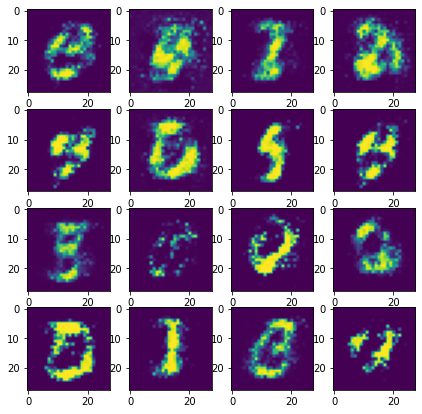

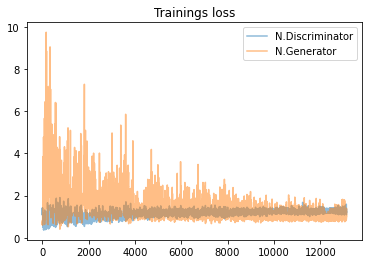

[15] -- discriminator_loss: 1.2148022651672363  -- generator_loss: 1.1184661388397217
[15] -- discriminator_loss: 1.205815315246582  -- generator_loss: 1.062929391860962
[15] -- discriminator_loss: 1.2934907674789429  -- generator_loss: 1.1810039281845093
[15] -- discriminator_loss: 1.3068581819534302  -- generator_loss: 1.4008474349975586
[15] -- discriminator_loss: 1.350791573524475  -- generator_loss: 1.1138492822647095
[15] -- discriminator_loss: 1.2729990482330322  -- generator_loss: 0.9863408803939819
[15] -- discriminator_loss: 1.271501064300537  -- generator_loss: 0.952046275138855
[15] -- discriminator_loss: 1.2872475385665894  -- generator_loss: 0.9517485499382019
[15] -- discriminator_loss: 1.3182692527770996  -- generator_loss: 1.2309575080871582
[15] -- discriminator_loss: 1.395172119140625  -- generator_loss: 0.8501641750335693
[15] -- discriminator_loss: 1.307018518447876  -- generator_loss: 1.216677188873291
[15] -- discriminator_loss: 1.2909629344940186  -- generator_l

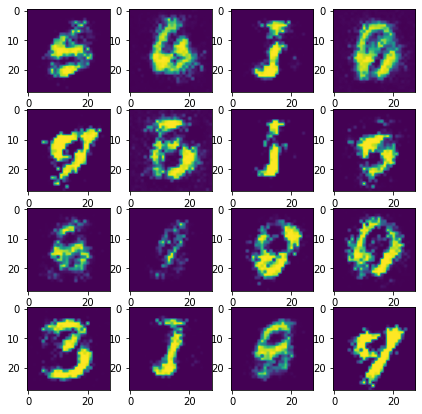

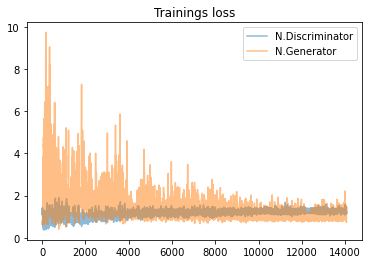

[16] -- discriminator_loss: 1.1728930473327637  -- generator_loss: 1.3275171518325806
[16] -- discriminator_loss: 1.231351613998413  -- generator_loss: 1.0572073459625244
[16] -- discriminator_loss: 1.2702502012252808  -- generator_loss: 1.2788795232772827
[16] -- discriminator_loss: 1.291763186454773  -- generator_loss: 0.9530273675918579
[16] -- discriminator_loss: 1.3026225566864014  -- generator_loss: 1.2599742412567139
[16] -- discriminator_loss: 1.2985690832138062  -- generator_loss: 0.8533284664154053
[16] -- discriminator_loss: 1.4093425273895264  -- generator_loss: 0.8266159892082214
[16] -- discriminator_loss: 1.3027143478393555  -- generator_loss: 0.8364874124526978
[16] -- discriminator_loss: 1.163529396057129  -- generator_loss: 1.2443515062332153
[16] -- discriminator_loss: 1.2276661396026611  -- generator_loss: 1.0641003847122192
[16] -- discriminator_loss: 1.3137691020965576  -- generator_loss: 0.8014068603515625
[16] -- discriminator_loss: 1.2513234615325928  -- genera

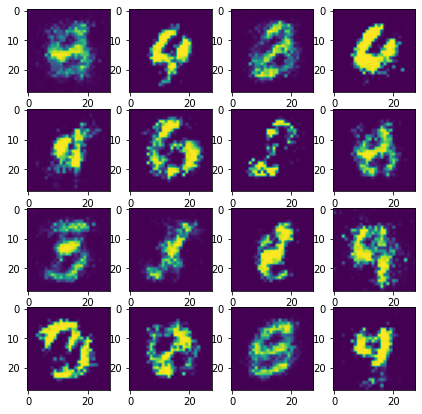

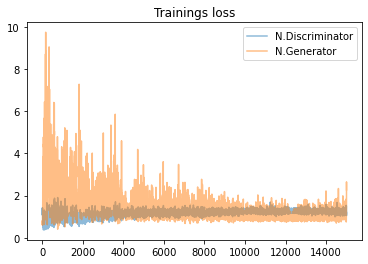

[17] -- discriminator_loss: 1.1145126819610596  -- generator_loss: 1.917988896369934
[17] -- discriminator_loss: 1.0838476419448853  -- generator_loss: 1.4817169904708862
[17] -- discriminator_loss: 1.1799790859222412  -- generator_loss: 1.1224408149719238
[17] -- discriminator_loss: 1.3560600280761719  -- generator_loss: 1.046730399131775
[17] -- discriminator_loss: 1.3160260915756226  -- generator_loss: 1.2016546726226807
[17] -- discriminator_loss: 1.212109088897705  -- generator_loss: 1.1685872077941895
[17] -- discriminator_loss: 1.2623205184936523  -- generator_loss: 1.6399893760681152
[17] -- discriminator_loss: 1.0055752992630005  -- generator_loss: 1.5403943061828613
[17] -- discriminator_loss: 1.1983879804611206  -- generator_loss: 1.088918685913086
[17] -- discriminator_loss: 1.3167176246643066  -- generator_loss: 0.8550587296485901
[17] -- discriminator_loss: 1.329421043395996  -- generator_loss: 1.2833623886108398
[17] -- discriminator_loss: 1.256546974182129  -- generator

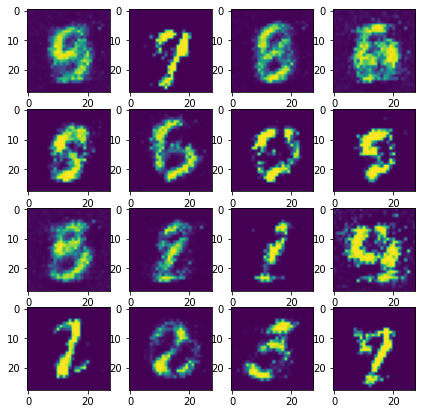

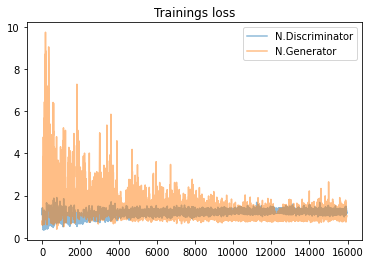

[18] -- discriminator_loss: 1.1582107543945312  -- generator_loss: 0.991490364074707
[18] -- discriminator_loss: 1.272304892539978  -- generator_loss: 0.9757187962532043
[18] -- discriminator_loss: 1.1769964694976807  -- generator_loss: 1.2551932334899902
[18] -- discriminator_loss: 1.21538245677948  -- generator_loss: 1.0682106018066406
[18] -- discriminator_loss: 1.2509174346923828  -- generator_loss: 0.8992985486984253
[18] -- discriminator_loss: 1.2735328674316406  -- generator_loss: 1.0448074340820312
[18] -- discriminator_loss: 1.273681879043579  -- generator_loss: 1.0678261518478394
[18] -- discriminator_loss: 1.2630655765533447  -- generator_loss: 1.019561529159546
[18] -- discriminator_loss: 1.2411762475967407  -- generator_loss: 1.4830553531646729
[18] -- discriminator_loss: 1.28227698802948  -- generator_loss: 0.9220109581947327
[18] -- discriminator_loss: 1.2049496173858643  -- generator_loss: 1.3374305963516235
[18] -- discriminator_loss: 1.2819021940231323  -- generator_l

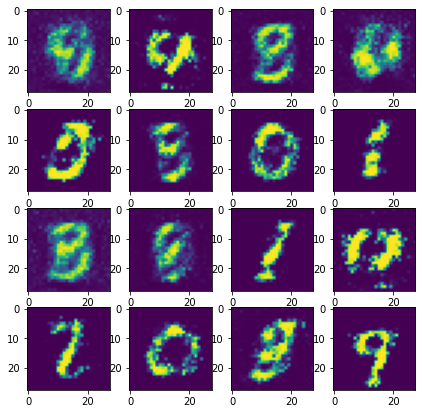

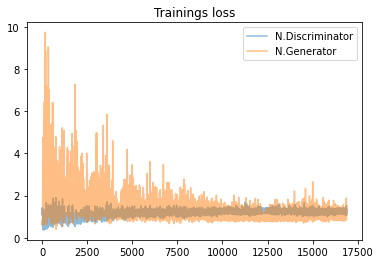

[19] -- discriminator_loss: 1.2015889883041382  -- generator_loss: 1.1215548515319824
[19] -- discriminator_loss: 1.243943691253662  -- generator_loss: 1.0667424201965332
[19] -- discriminator_loss: 1.252290964126587  -- generator_loss: 0.9756696224212646
[19] -- discriminator_loss: 1.3203778266906738  -- generator_loss: 0.991973876953125
[19] -- discriminator_loss: 1.2567112445831299  -- generator_loss: 0.8505491614341736
[19] -- discriminator_loss: 1.2426540851593018  -- generator_loss: 0.9152109026908875
[19] -- discriminator_loss: 1.300210952758789  -- generator_loss: 1.0101895332336426
[19] -- discriminator_loss: 1.2639901638031006  -- generator_loss: 0.8781232237815857
[19] -- discriminator_loss: 1.2782303094863892  -- generator_loss: 1.1009202003479004
[19] -- discriminator_loss: 1.2475900650024414  -- generator_loss: 1.0251774787902832
[19] -- discriminator_loss: 1.2510173320770264  -- generator_loss: 1.1123210191726685
[19] -- discriminator_loss: 1.2077081203460693  -- generat

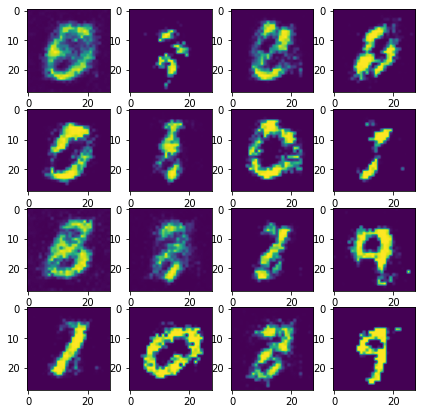

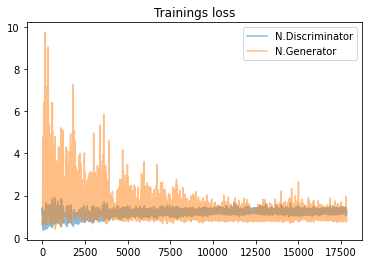

[20] -- discriminator_loss: 1.4407387971878052  -- generator_loss: 1.0358985662460327
[20] -- discriminator_loss: 1.2569799423217773  -- generator_loss: 0.9327760338783264
[20] -- discriminator_loss: 1.2485411167144775  -- generator_loss: 1.0409106016159058
[20] -- discriminator_loss: 1.2986520528793335  -- generator_loss: 0.9177190065383911
[20] -- discriminator_loss: 1.2482234239578247  -- generator_loss: 0.8579530119895935
[20] -- discriminator_loss: 1.2911357879638672  -- generator_loss: 0.9650463461875916
[20] -- discriminator_loss: 1.2855249643325806  -- generator_loss: 0.8040086030960083
[20] -- discriminator_loss: 1.2310435771942139  -- generator_loss: 1.0061239004135132
[20] -- discriminator_loss: 1.2141907215118408  -- generator_loss: 1.1989988088607788
[20] -- discriminator_loss: 1.2307026386260986  -- generator_loss: 1.0100302696228027
[20] -- discriminator_loss: 1.1237754821777344  -- generator_loss: 1.3177335262298584
[20] -- discriminator_loss: 1.2357044219970703  -- gen

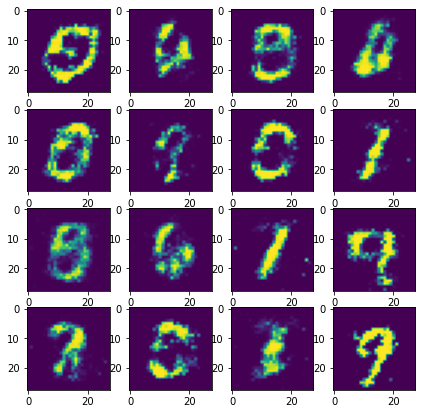

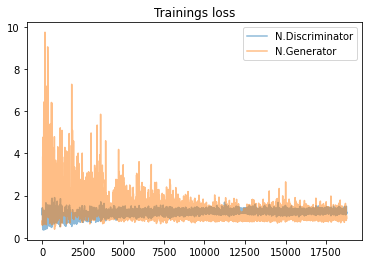

[21] -- discriminator_loss: 1.2759225368499756  -- generator_loss: 1.0416370630264282
[21] -- discriminator_loss: 1.2056605815887451  -- generator_loss: 1.033724308013916
[21] -- discriminator_loss: 1.2137058973312378  -- generator_loss: 1.128021240234375
[21] -- discriminator_loss: 1.2788960933685303  -- generator_loss: 0.9533179402351379
[21] -- discriminator_loss: 1.3697705268859863  -- generator_loss: 1.0037522315979004
[21] -- discriminator_loss: 1.237567663192749  -- generator_loss: 0.8579491972923279
[21] -- discriminator_loss: 1.2315762042999268  -- generator_loss: 1.3287177085876465
[21] -- discriminator_loss: 1.299662709236145  -- generator_loss: 1.0717300176620483
[21] -- discriminator_loss: 1.287550687789917  -- generator_loss: 0.9577052593231201
[21] -- discriminator_loss: 1.2285799980163574  -- generator_loss: 0.9206392168998718
[21] -- discriminator_loss: 1.252984881401062  -- generator_loss: 0.9153909683227539
[21] -- discriminator_loss: 1.2409781217575073  -- generator

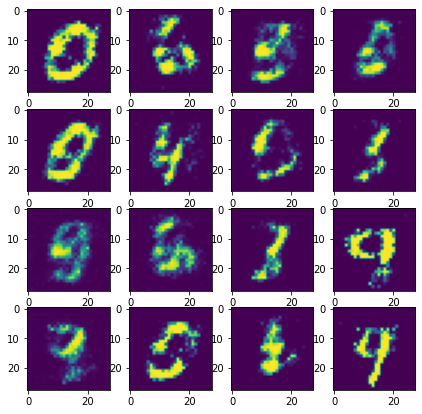

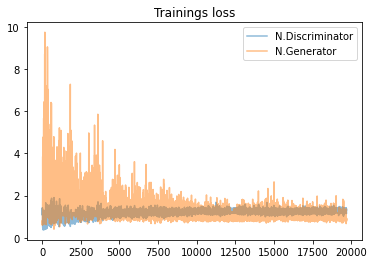

[22] -- discriminator_loss: 1.3802002668380737  -- generator_loss: 0.8576352000236511
[22] -- discriminator_loss: 1.3458887338638306  -- generator_loss: 0.9381490349769592
[22] -- discriminator_loss: 1.1947391033172607  -- generator_loss: 1.0387405157089233
[22] -- discriminator_loss: 1.2617738246917725  -- generator_loss: 1.0466809272766113
[22] -- discriminator_loss: 1.3365626335144043  -- generator_loss: 0.948418378829956
[22] -- discriminator_loss: 1.3657927513122559  -- generator_loss: 0.8975927829742432
[22] -- discriminator_loss: 1.2361093759536743  -- generator_loss: 0.8625958561897278
[22] -- discriminator_loss: 1.3172169923782349  -- generator_loss: 1.0314555168151855
[22] -- discriminator_loss: 1.288853406906128  -- generator_loss: 1.0097441673278809
[22] -- discriminator_loss: 1.2322354316711426  -- generator_loss: 0.8860772252082825
[22] -- discriminator_loss: 1.3628463745117188  -- generator_loss: 1.13015878200531
[22] -- discriminator_loss: 1.2900748252868652  -- generat

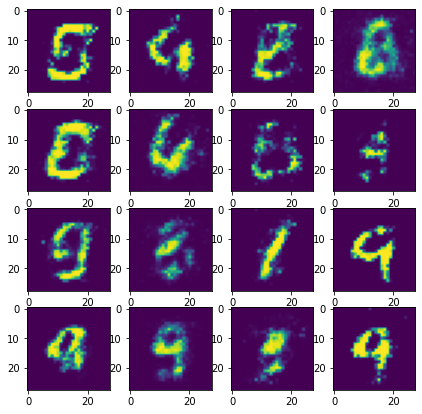

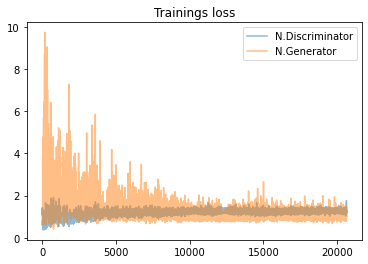

[23] -- discriminator_loss: 1.3699262142181396  -- generator_loss: 0.9058062434196472
[23] -- discriminator_loss: 1.271918773651123  -- generator_loss: 0.9301016330718994
[23] -- discriminator_loss: 1.2276504039764404  -- generator_loss: 0.949000358581543
[23] -- discriminator_loss: 1.320404291152954  -- generator_loss: 0.979046106338501
[23] -- discriminator_loss: 1.2062935829162598  -- generator_loss: 0.9530895948410034
[23] -- discriminator_loss: 1.4535181522369385  -- generator_loss: 0.9075090885162354
[23] -- discriminator_loss: 1.3009307384490967  -- generator_loss: 0.9140588045120239
[23] -- discriminator_loss: 1.3009228706359863  -- generator_loss: 0.8559966087341309
[23] -- discriminator_loss: 1.3491357564926147  -- generator_loss: 1.2126065492630005
[23] -- discriminator_loss: 1.3115170001983643  -- generator_loss: 0.8302215337753296
[23] -- discriminator_loss: 1.260485291481018  -- generator_loss: 0.8868201375007629
[23] -- discriminator_loss: 1.1729822158813477  -- generato

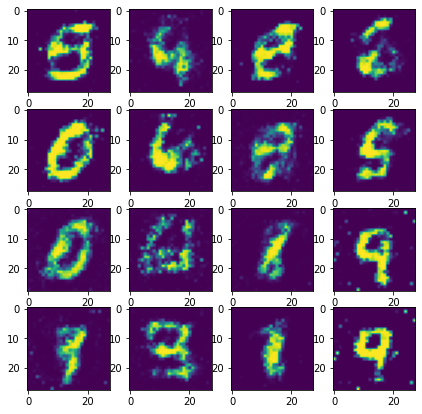

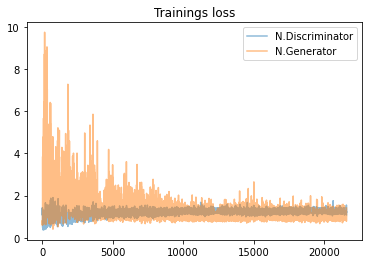

[24] -- discriminator_loss: 1.222002625465393  -- generator_loss: 1.4827803373336792
[24] -- discriminator_loss: 1.3042633533477783  -- generator_loss: 1.4444217681884766
[24] -- discriminator_loss: 1.264988660812378  -- generator_loss: 1.144275188446045
[24] -- discriminator_loss: 1.4523353576660156  -- generator_loss: 0.8167492151260376
[24] -- discriminator_loss: 1.3212717771530151  -- generator_loss: 0.8589801788330078
[24] -- discriminator_loss: 1.2700098752975464  -- generator_loss: 0.9423417448997498
[24] -- discriminator_loss: 1.3504796028137207  -- generator_loss: 0.9101951122283936
[24] -- discriminator_loss: 1.2345675230026245  -- generator_loss: 1.5793647766113281
[24] -- discriminator_loss: 1.22887122631073  -- generator_loss: 1.25884211063385
[24] -- discriminator_loss: 1.250769019126892  -- generator_loss: 1.081559419631958
[24] -- discriminator_loss: 1.2775284051895142  -- generator_loss: 0.9306434988975525
[24] -- discriminator_loss: 1.3009051084518433  -- generator_lo

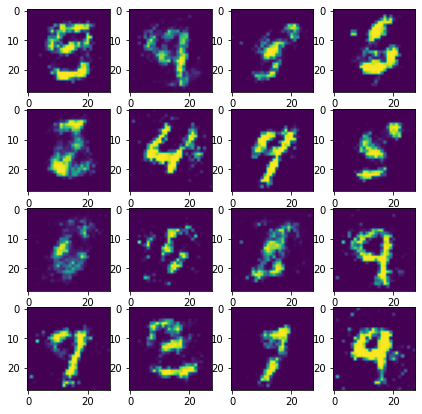

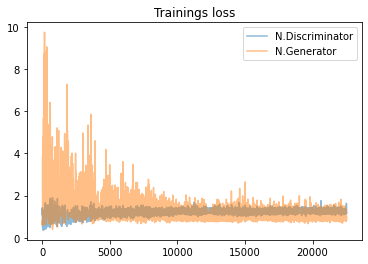

[25] -- discriminator_loss: 1.294884443283081  -- generator_loss: 0.9701979756355286
[25] -- discriminator_loss: 1.2661187648773193  -- generator_loss: 0.9135996103286743
[25] -- discriminator_loss: 1.2127145528793335  -- generator_loss: 1.1156483888626099
[25] -- discriminator_loss: 1.3044055700302124  -- generator_loss: 0.896165668964386
[25] -- discriminator_loss: 1.3445253372192383  -- generator_loss: 0.8764603734016418
[25] -- discriminator_loss: 1.2235654592514038  -- generator_loss: 0.9609231352806091
[25] -- discriminator_loss: 1.3066788911819458  -- generator_loss: 1.2952109575271606
[25] -- discriminator_loss: 1.345872402191162  -- generator_loss: 0.9867320656776428
[25] -- discriminator_loss: 1.2630553245544434  -- generator_loss: 0.9743713736534119
[25] -- discriminator_loss: 1.178868293762207  -- generator_loss: 1.1713155508041382
[25] -- discriminator_loss: 1.2416633367538452  -- generator_loss: 1.036759853363037
[25] -- discriminator_loss: 1.2836427688598633  -- generato

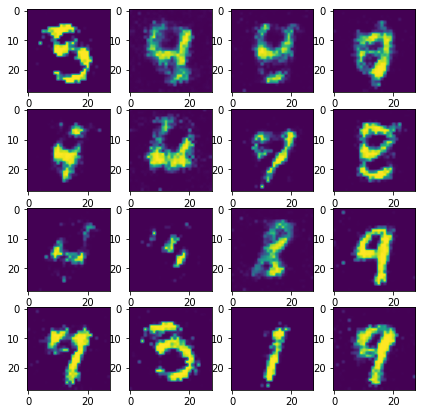

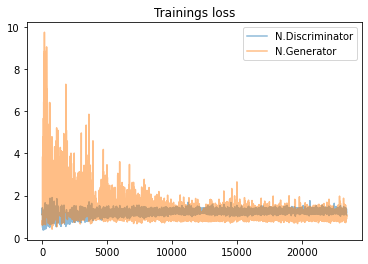

[26] -- discriminator_loss: 1.221534252166748  -- generator_loss: 1.1280474662780762
[26] -- discriminator_loss: 1.2505711317062378  -- generator_loss: 1.2645418643951416
[26] -- discriminator_loss: 1.1630027294158936  -- generator_loss: 0.9604941606521606
[26] -- discriminator_loss: 1.2496256828308105  -- generator_loss: 1.0145410299301147
[26] -- discriminator_loss: 1.3724522590637207  -- generator_loss: 0.8738052845001221
[26] -- discriminator_loss: 1.262047529220581  -- generator_loss: 0.8978114128112793
[26] -- discriminator_loss: 1.2294061183929443  -- generator_loss: 0.9002728462219238
[26] -- discriminator_loss: 1.2403345108032227  -- generator_loss: 1.0518217086791992
[26] -- discriminator_loss: 1.2174241542816162  -- generator_loss: 0.9368143081665039
[26] -- discriminator_loss: 1.3305473327636719  -- generator_loss: 1.0104719400405884
[26] -- discriminator_loss: 1.3133742809295654  -- generator_loss: 0.9130542278289795
[26] -- discriminator_loss: 1.2868664264678955  -- gener

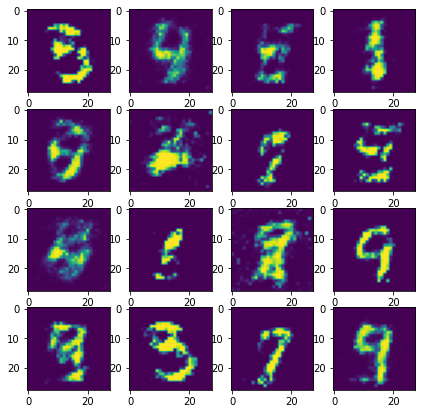

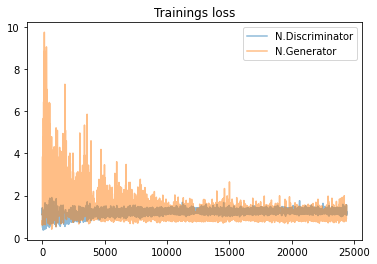

[27] -- discriminator_loss: 1.342358112335205  -- generator_loss: 0.8034752011299133
[27] -- discriminator_loss: 1.1963622570037842  -- generator_loss: 1.3999875783920288
[27] -- discriminator_loss: 1.2473621368408203  -- generator_loss: 0.9724388122558594
[27] -- discriminator_loss: 1.3051321506500244  -- generator_loss: 0.9533511400222778
[27] -- discriminator_loss: 1.298048734664917  -- generator_loss: 1.0271313190460205
[27] -- discriminator_loss: 1.221369981765747  -- generator_loss: 1.0804377794265747
[27] -- discriminator_loss: 1.3072118759155273  -- generator_loss: 0.9557543396949768
[27] -- discriminator_loss: 1.2371474504470825  -- generator_loss: 1.1051061153411865
[27] -- discriminator_loss: 1.2330982685089111  -- generator_loss: 0.8973400592803955
[27] -- discriminator_loss: 1.2247734069824219  -- generator_loss: 0.9285390377044678
[27] -- discriminator_loss: 1.1481387615203857  -- generator_loss: 1.283939242362976
[27] -- discriminator_loss: 1.270756721496582  -- generato

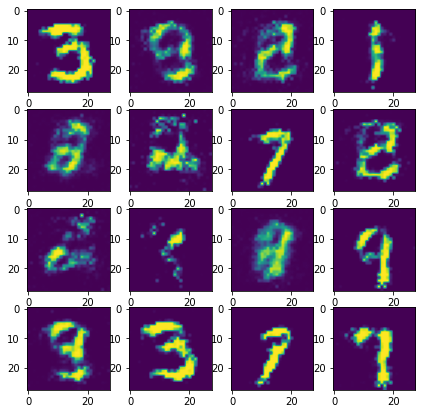

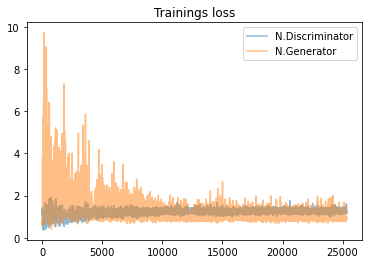

[28] -- discriminator_loss: 1.2807719707489014  -- generator_loss: 0.9130891561508179
[28] -- discriminator_loss: 1.2907090187072754  -- generator_loss: 1.1082804203033447
[28] -- discriminator_loss: 1.2059295177459717  -- generator_loss: 0.9682287573814392
[28] -- discriminator_loss: 1.2375752925872803  -- generator_loss: 1.0073635578155518
[28] -- discriminator_loss: 1.2365293502807617  -- generator_loss: 1.2636754512786865
[28] -- discriminator_loss: 1.2748063802719116  -- generator_loss: 0.8445231914520264
[28] -- discriminator_loss: 1.3276112079620361  -- generator_loss: 1.3286495208740234
[28] -- discriminator_loss: 1.2922217845916748  -- generator_loss: 1.038846492767334
[28] -- discriminator_loss: 1.30832839012146  -- generator_loss: 0.8376089930534363
[28] -- discriminator_loss: 1.286352276802063  -- generator_loss: 0.9285217523574829
[28] -- discriminator_loss: 1.2478795051574707  -- generator_loss: 0.8404781222343445
[28] -- discriminator_loss: 1.2477762699127197  -- generat

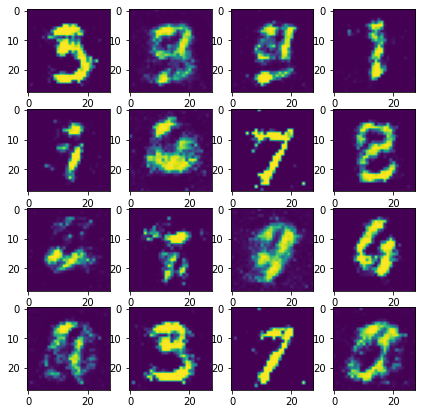

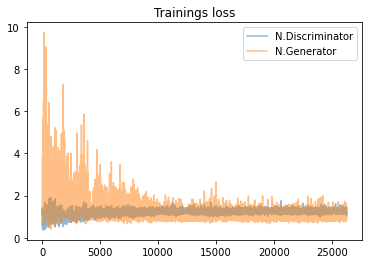

[29] -- discriminator_loss: 1.2527666091918945  -- generator_loss: 0.9904848337173462
[29] -- discriminator_loss: 1.2325921058654785  -- generator_loss: 0.9927655458450317
[29] -- discriminator_loss: 1.2083559036254883  -- generator_loss: 1.08612859249115
[29] -- discriminator_loss: 1.473066806793213  -- generator_loss: 0.9067200422286987
[29] -- discriminator_loss: 1.3066973686218262  -- generator_loss: 0.8794970512390137
[29] -- discriminator_loss: 1.1402040719985962  -- generator_loss: 1.0970613956451416
[29] -- discriminator_loss: 1.3001680374145508  -- generator_loss: 0.8387823700904846
[29] -- discriminator_loss: 1.3651182651519775  -- generator_loss: 0.916856050491333
[29] -- discriminator_loss: 1.3071246147155762  -- generator_loss: 1.1339070796966553
[29] -- discriminator_loss: 1.2593750953674316  -- generator_loss: 1.2297731637954712
[29] -- discriminator_loss: 1.3113884925842285  -- generator_loss: 0.8605931997299194
[29] -- discriminator_loss: 1.3210283517837524  -- generat

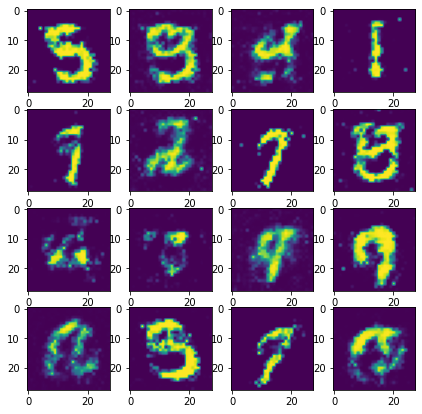

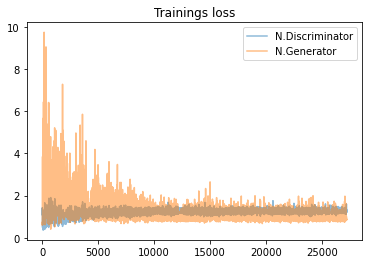

[30] -- discriminator_loss: 1.3153573274612427  -- generator_loss: 0.8608171939849854
[30] -- discriminator_loss: 1.2643623352050781  -- generator_loss: 0.8692693710327148
[30] -- discriminator_loss: 1.2455308437347412  -- generator_loss: 0.9791962504386902
[30] -- discriminator_loss: 1.2866771221160889  -- generator_loss: 0.9670172929763794
[30] -- discriminator_loss: 1.2782788276672363  -- generator_loss: 1.113574504852295
[30] -- discriminator_loss: 1.273557424545288  -- generator_loss: 0.7951433062553406
[30] -- discriminator_loss: 1.2860684394836426  -- generator_loss: 0.8804439902305603
[30] -- discriminator_loss: 1.2563471794128418  -- generator_loss: 1.1736993789672852
[30] -- discriminator_loss: 1.4860947132110596  -- generator_loss: 0.958105206489563
[30] -- discriminator_loss: 1.3126163482666016  -- generator_loss: 0.7871535420417786
[30] -- discriminator_loss: 1.2694315910339355  -- generator_loss: 0.9113866686820984
[30] -- discriminator_loss: 1.2570858001708984  -- genera

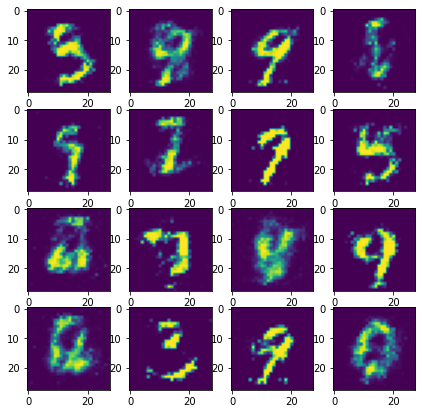

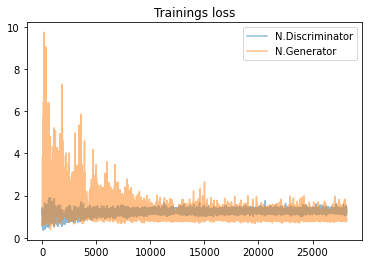

[31] -- discriminator_loss: 1.228684425354004  -- generator_loss: 1.0722419023513794
[31] -- discriminator_loss: 1.237197995185852  -- generator_loss: 1.0718293190002441
[31] -- discriminator_loss: 1.1744556427001953  -- generator_loss: 1.1340229511260986
[31] -- discriminator_loss: 1.3680883646011353  -- generator_loss: 0.8745394945144653
[31] -- discriminator_loss: 1.3540339469909668  -- generator_loss: 0.8465080857276917
[31] -- discriminator_loss: 1.2834091186523438  -- generator_loss: 0.9195181727409363
[31] -- discriminator_loss: 1.2816582918167114  -- generator_loss: 1.174647569656372
[31] -- discriminator_loss: 1.1560673713684082  -- generator_loss: 1.5082812309265137
[31] -- discriminator_loss: 1.309627652168274  -- generator_loss: 1.0218654870986938
[31] -- discriminator_loss: 1.2845494747161865  -- generator_loss: 1.1762300729751587
[31] -- discriminator_loss: 1.276334524154663  -- generator_loss: 1.0117061138153076
[31] -- discriminator_loss: 1.3548085689544678  -- generato

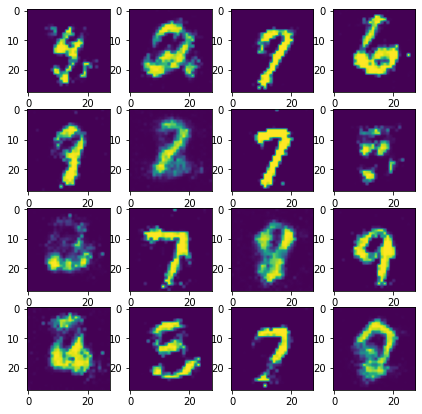

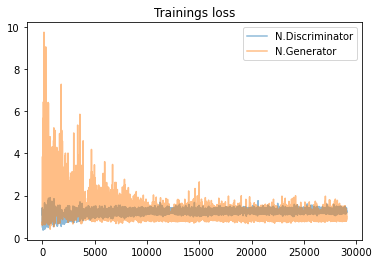

[32] -- discriminator_loss: 1.2567415237426758  -- generator_loss: 0.9156042337417603
[32] -- discriminator_loss: 1.1835520267486572  -- generator_loss: 0.9036946296691895
[32] -- discriminator_loss: 1.2184504270553589  -- generator_loss: 1.1510237455368042
[32] -- discriminator_loss: 1.355391025543213  -- generator_loss: 0.9585819244384766
[32] -- discriminator_loss: 1.2778699398040771  -- generator_loss: 1.1097337007522583
[32] -- discriminator_loss: 1.3817939758300781  -- generator_loss: 0.8570733666419983
[32] -- discriminator_loss: 1.3131067752838135  -- generator_loss: 0.8227136731147766
[32] -- discriminator_loss: 1.3043243885040283  -- generator_loss: 0.9867666959762573
[32] -- discriminator_loss: 1.2737977504730225  -- generator_loss: 1.0155596733093262
[32] -- discriminator_loss: 1.3075337409973145  -- generator_loss: 0.7751445770263672
[32] -- discriminator_loss: 1.2962698936462402  -- generator_loss: 0.9561313986778259
[32] -- discriminator_loss: 1.2682521343231201  -- gene

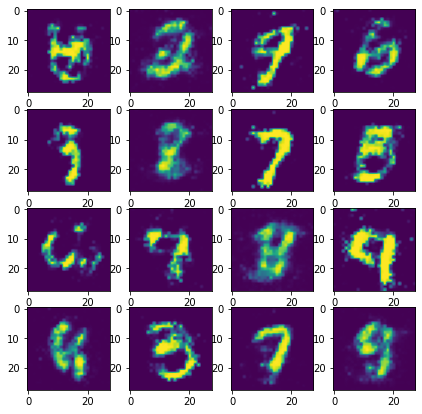

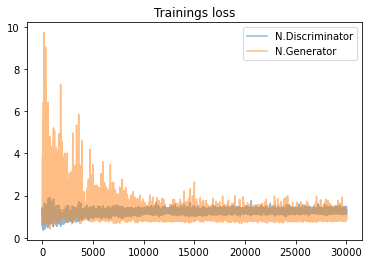

[33] -- discriminator_loss: 1.1905416250228882  -- generator_loss: 1.1449415683746338
[33] -- discriminator_loss: 1.1940556764602661  -- generator_loss: 1.1317336559295654
[33] -- discriminator_loss: 1.2323660850524902  -- generator_loss: 1.201053500175476
[33] -- discriminator_loss: 1.249677300453186  -- generator_loss: 0.8618143796920776
[33] -- discriminator_loss: 1.2724263668060303  -- generator_loss: 0.8874988555908203
[33] -- discriminator_loss: 1.2423484325408936  -- generator_loss: 1.0367666482925415
[33] -- discriminator_loss: 1.2336738109588623  -- generator_loss: 0.9261144399642944
[33] -- discriminator_loss: 1.2570613622665405  -- generator_loss: 0.8582674860954285
[33] -- discriminator_loss: 1.2806692123413086  -- generator_loss: 0.9006904363632202
[33] -- discriminator_loss: 1.2599382400512695  -- generator_loss: 0.9655251502990723
[33] -- discriminator_loss: 1.2911146879196167  -- generator_loss: 0.89858078956604
[33] -- discriminator_loss: 1.1170198917388916  -- generat

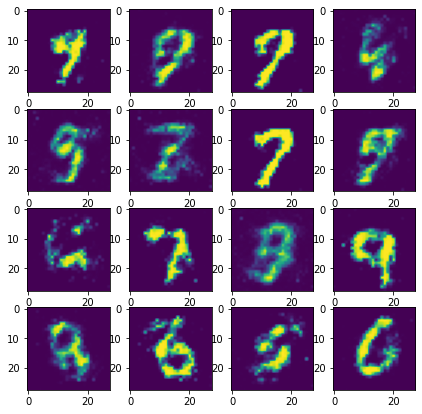

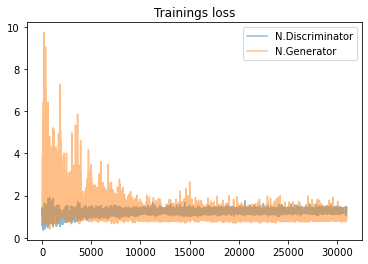

[34] -- discriminator_loss: 1.3693273067474365  -- generator_loss: 1.0143002271652222
[34] -- discriminator_loss: 1.419586420059204  -- generator_loss: 0.9028630256652832
[34] -- discriminator_loss: 1.335504412651062  -- generator_loss: 0.9509603977203369
[34] -- discriminator_loss: 1.3321021795272827  -- generator_loss: 0.9345182180404663
[34] -- discriminator_loss: 1.2755309343338013  -- generator_loss: 0.9836478233337402
[34] -- discriminator_loss: 1.2550264596939087  -- generator_loss: 1.0440834760665894
[34] -- discriminator_loss: 1.3639235496520996  -- generator_loss: 0.8706203103065491
[34] -- discriminator_loss: 1.1983648538589478  -- generator_loss: 1.2819560766220093
[34] -- discriminator_loss: 1.301628589630127  -- generator_loss: 0.8613068461418152
[34] -- discriminator_loss: 1.2435402870178223  -- generator_loss: 0.746921181678772
[34] -- discriminator_loss: 1.3458294868469238  -- generator_loss: 1.0440964698791504
[34] -- discriminator_loss: 1.2563872337341309  -- generat

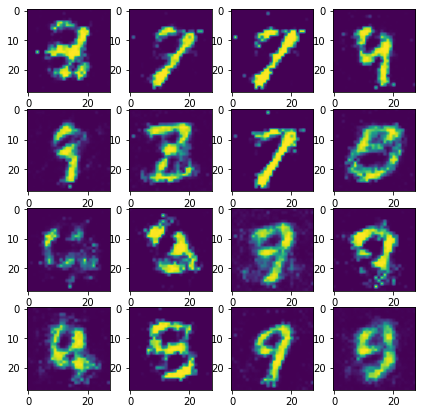

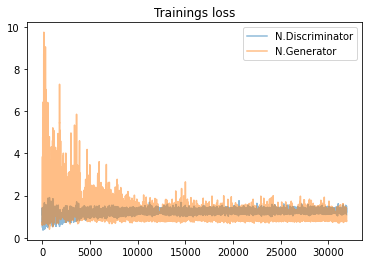

[35] -- discriminator_loss: 1.252042531967163  -- generator_loss: 1.115206003189087
[35] -- discriminator_loss: 1.3313971757888794  -- generator_loss: 1.2347161769866943
[35] -- discriminator_loss: 1.2197200059890747  -- generator_loss: 1.076114296913147
[35] -- discriminator_loss: 1.3719960451126099  -- generator_loss: 0.9899661540985107
[35] -- discriminator_loss: 1.2761911153793335  -- generator_loss: 0.9384415149688721
[35] -- discriminator_loss: 1.2954931259155273  -- generator_loss: 0.9593331217765808
[35] -- discriminator_loss: 1.2898061275482178  -- generator_loss: 0.8687604069709778
[35] -- discriminator_loss: 1.2600836753845215  -- generator_loss: 1.0107792615890503
[35] -- discriminator_loss: 1.3626165390014648  -- generator_loss: 1.0434534549713135
[35] -- discriminator_loss: 1.1869432926177979  -- generator_loss: 1.1805086135864258
[35] -- discriminator_loss: 1.1414896249771118  -- generator_loss: 1.1448761224746704
[35] -- discriminator_loss: 1.1383191347122192  -- genera

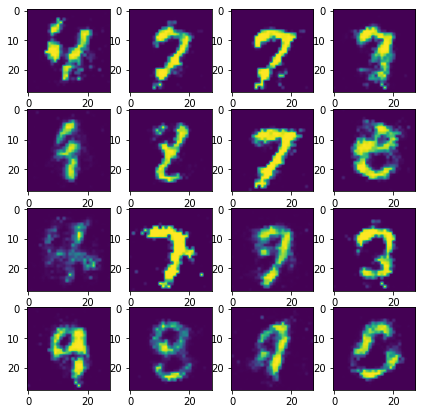

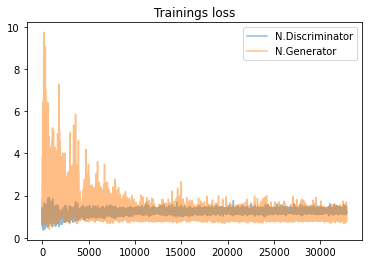

[36] -- discriminator_loss: 1.301171898841858  -- generator_loss: 0.8868083953857422
[36] -- discriminator_loss: 1.2831048965454102  -- generator_loss: 0.8891302347183228
[36] -- discriminator_loss: 1.2845118045806885  -- generator_loss: 0.8903961181640625
[36] -- discriminator_loss: 1.278777837753296  -- generator_loss: 0.9545413851737976
[36] -- discriminator_loss: 1.333864688873291  -- generator_loss: 0.9474698305130005
[36] -- discriminator_loss: 1.1686208248138428  -- generator_loss: 1.2351206541061401
[36] -- discriminator_loss: 1.3408048152923584  -- generator_loss: 0.9615212082862854
[36] -- discriminator_loss: 1.2395961284637451  -- generator_loss: 0.8774463534355164
[36] -- discriminator_loss: 1.267418622970581  -- generator_loss: 0.971095860004425
[36] -- discriminator_loss: 1.3067102432250977  -- generator_loss: 1.0336532592773438
[36] -- discriminator_loss: 1.371688723564148  -- generator_loss: 1.076446533203125
[36] -- discriminator_loss: 1.2747933864593506  -- generator_

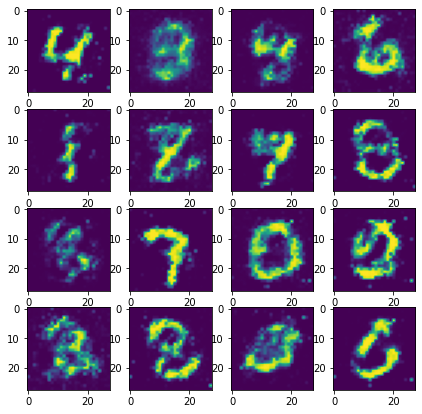

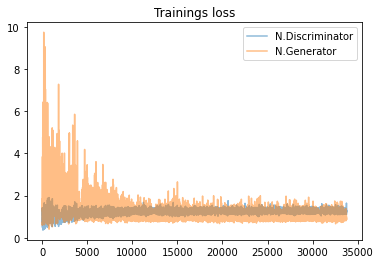

[37] -- discriminator_loss: 1.2524423599243164  -- generator_loss: 0.8309397101402283
[37] -- discriminator_loss: 1.3879659175872803  -- generator_loss: 0.8160098195075989
[37] -- discriminator_loss: 1.269841194152832  -- generator_loss: 1.1246323585510254
[37] -- discriminator_loss: 1.365666151046753  -- generator_loss: 0.9258280396461487
[37] -- discriminator_loss: 1.3937280178070068  -- generator_loss: 0.8437280058860779
[37] -- discriminator_loss: 1.2127659320831299  -- generator_loss: 1.2497228384017944
[37] -- discriminator_loss: 1.428091287612915  -- generator_loss: 1.0621744394302368
[37] -- discriminator_loss: 1.3268738985061646  -- generator_loss: 0.9971719980239868
[37] -- discriminator_loss: 1.3296618461608887  -- generator_loss: 0.8363712430000305
[37] -- discriminator_loss: 1.3009934425354004  -- generator_loss: 0.9045442342758179
[37] -- discriminator_loss: 1.2269614934921265  -- generator_loss: 0.9352575540542603
[37] -- discriminator_loss: 1.315213680267334  -- generat

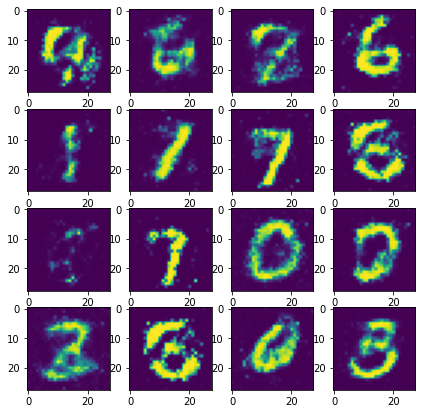

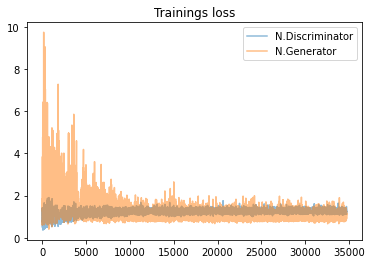

[38] -- discriminator_loss: 1.2068309783935547  -- generator_loss: 0.9187728762626648
[38] -- discriminator_loss: 1.3327490091323853  -- generator_loss: 0.9116058945655823
[38] -- discriminator_loss: 1.210058569908142  -- generator_loss: 0.9792154431343079
[38] -- discriminator_loss: 1.3138039112091064  -- generator_loss: 1.13956880569458
[38] -- discriminator_loss: 1.2890119552612305  -- generator_loss: 1.0431894063949585
[38] -- discriminator_loss: 1.3615962266921997  -- generator_loss: 0.7559632062911987
[38] -- discriminator_loss: 1.281259298324585  -- generator_loss: 0.8577917814254761
[38] -- discriminator_loss: 1.4162030220031738  -- generator_loss: 1.0272804498672485
[38] -- discriminator_loss: 1.2417445182800293  -- generator_loss: 1.1360691785812378
[38] -- discriminator_loss: 1.3269325494766235  -- generator_loss: 0.8345798254013062
[38] -- discriminator_loss: 1.2144877910614014  -- generator_loss: 0.9446078538894653
[38] -- discriminator_loss: 1.3204567432403564  -- generat

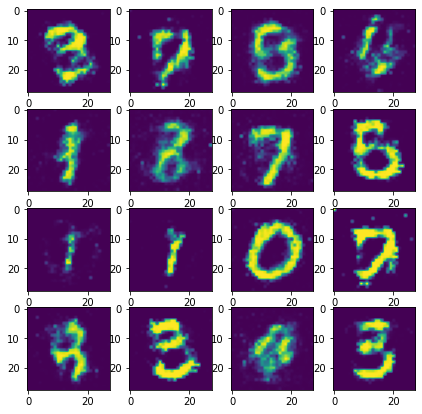

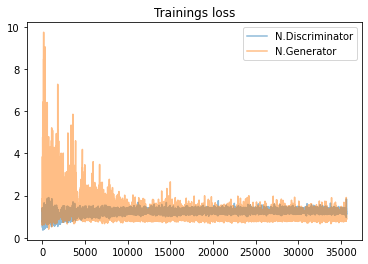

[39] -- discriminator_loss: 1.1934232711791992  -- generator_loss: 0.8819880485534668
[39] -- discriminator_loss: 1.2098405361175537  -- generator_loss: 0.9847593903541565
[39] -- discriminator_loss: 1.3735020160675049  -- generator_loss: 1.1518547534942627
[39] -- discriminator_loss: 1.2956575155258179  -- generator_loss: 0.9756794571876526
[39] -- discriminator_loss: 1.1929116249084473  -- generator_loss: 0.9389734268188477
[39] -- discriminator_loss: 1.299572467803955  -- generator_loss: 1.0088907480239868
[39] -- discriminator_loss: 1.3830268383026123  -- generator_loss: 0.8137714266777039
[39] -- discriminator_loss: 1.306591272354126  -- generator_loss: 0.9361668825149536
[39] -- discriminator_loss: 1.2999650239944458  -- generator_loss: 0.888296365737915
[39] -- discriminator_loss: 1.3257415294647217  -- generator_loss: 0.875056266784668
[39] -- discriminator_loss: 1.2605431079864502  -- generator_loss: 0.9544318914413452
[39] -- discriminator_loss: 1.230725646018982  -- generato

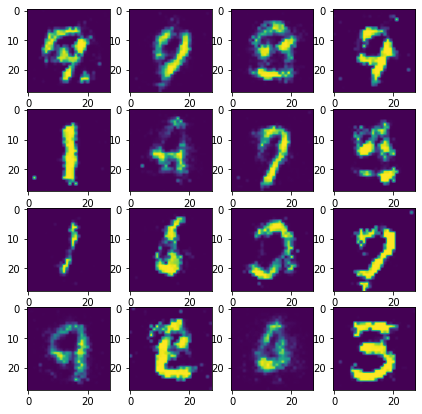

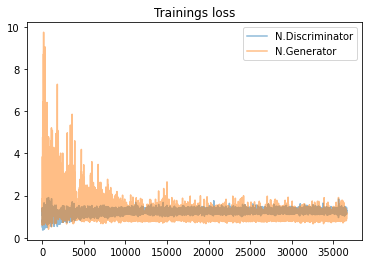

[40] -- discriminator_loss: 1.185508370399475  -- generator_loss: 1.2583606243133545
[40] -- discriminator_loss: 1.1456317901611328  -- generator_loss: 1.531571388244629
[40] -- discriminator_loss: 1.2535901069641113  -- generator_loss: 0.9998561143875122
[40] -- discriminator_loss: 1.195675015449524  -- generator_loss: 0.9739652872085571
[40] -- discriminator_loss: 1.2507315874099731  -- generator_loss: 1.0804502964019775
[40] -- discriminator_loss: 1.2139770984649658  -- generator_loss: 1.0399142503738403
[40] -- discriminator_loss: 1.2509689331054688  -- generator_loss: 0.9092678427696228
[40] -- discriminator_loss: 1.2276192903518677  -- generator_loss: 1.041243553161621
[40] -- discriminator_loss: 1.2599003314971924  -- generator_loss: 1.1262158155441284
[40] -- discriminator_loss: 1.3568320274353027  -- generator_loss: 1.091164231300354
[40] -- discriminator_loss: 1.287441611289978  -- generator_loss: 0.9882115721702576
[40] -- discriminator_loss: 1.243897795677185  -- generator_

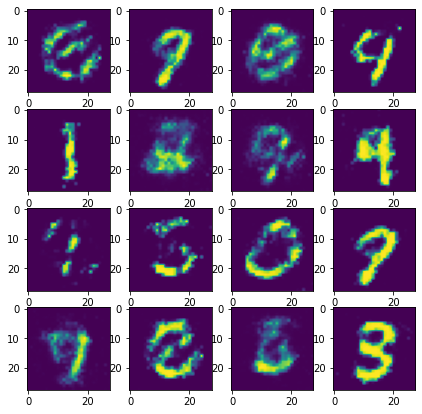

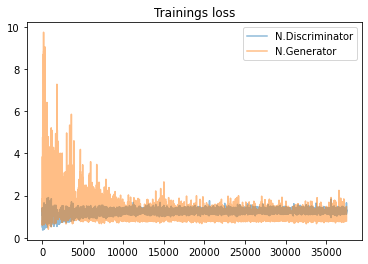

[41] -- discriminator_loss: 1.2888352870941162  -- generator_loss: 0.8327727317810059
[41] -- discriminator_loss: 1.3294589519500732  -- generator_loss: 0.8213270902633667
[41] -- discriminator_loss: 1.1944904327392578  -- generator_loss: 1.119614601135254
[41] -- discriminator_loss: 1.193255066871643  -- generator_loss: 0.9079546928405762
[41] -- discriminator_loss: 1.2966562509536743  -- generator_loss: 0.8435524702072144
[41] -- discriminator_loss: 1.2485804557800293  -- generator_loss: 1.148707389831543
[41] -- discriminator_loss: 1.3311448097229004  -- generator_loss: 1.0013785362243652
[41] -- discriminator_loss: 1.269080400466919  -- generator_loss: 1.0329889059066772
[41] -- discriminator_loss: 1.1913684606552124  -- generator_loss: 0.9058022499084473
[41] -- discriminator_loss: 1.2600533962249756  -- generator_loss: 0.9782389998435974
[41] -- discriminator_loss: 1.3415212631225586  -- generator_loss: 0.9142153263092041
[41] -- discriminator_loss: 1.2127900123596191  -- generat

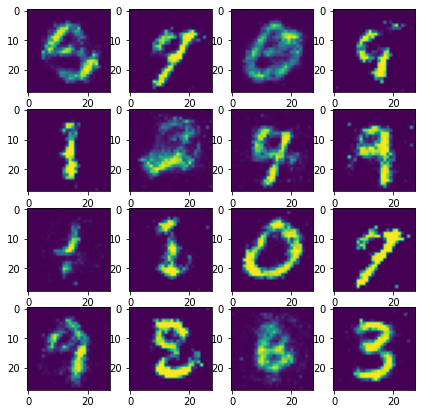

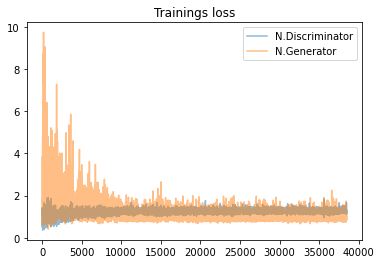

[42] -- discriminator_loss: 1.2794215679168701  -- generator_loss: 0.9610113501548767
[42] -- discriminator_loss: 1.2518043518066406  -- generator_loss: 0.932957649230957
[42] -- discriminator_loss: 1.2700268030166626  -- generator_loss: 1.052411437034607
[42] -- discriminator_loss: 1.360170841217041  -- generator_loss: 0.8449264764785767
[42] -- discriminator_loss: 1.330819010734558  -- generator_loss: 0.8813235759735107
[42] -- discriminator_loss: 1.3320581912994385  -- generator_loss: 0.9443932771682739
[42] -- discriminator_loss: 1.2756342887878418  -- generator_loss: 1.0422296524047852
[42] -- discriminator_loss: 1.226341724395752  -- generator_loss: 0.9582436084747314
[42] -- discriminator_loss: 1.2444984912872314  -- generator_loss: 1.0756080150604248
[42] -- discriminator_loss: 1.2641065120697021  -- generator_loss: 0.9732537269592285
[42] -- discriminator_loss: 1.4191830158233643  -- generator_loss: 0.8869885206222534
[42] -- discriminator_loss: 1.3270341157913208  -- generato

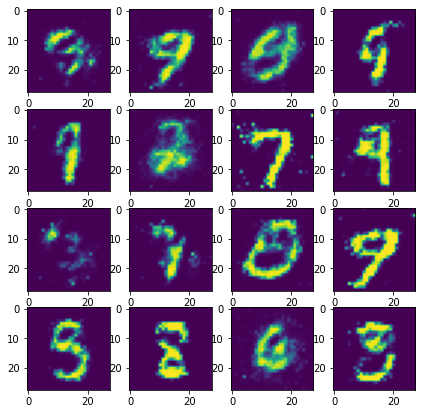

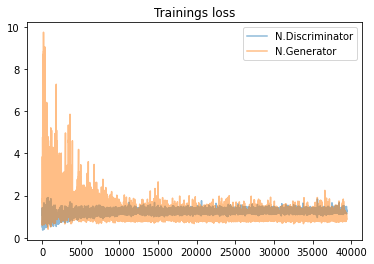

[43] -- discriminator_loss: 1.2992823123931885  -- generator_loss: 1.018157720565796
[43] -- discriminator_loss: 1.3478732109069824  -- generator_loss: 0.9059864282608032
[43] -- discriminator_loss: 1.2629547119140625  -- generator_loss: 0.919495701789856
[43] -- discriminator_loss: 1.3429009914398193  -- generator_loss: 0.9031047821044922
[43] -- discriminator_loss: 1.3720226287841797  -- generator_loss: 0.9691493511199951
[43] -- discriminator_loss: 1.2540650367736816  -- generator_loss: 0.9715504050254822
[43] -- discriminator_loss: 1.2852776050567627  -- generator_loss: 0.9439698457717896
[43] -- discriminator_loss: 1.2328579425811768  -- generator_loss: 1.2987263202667236
[43] -- discriminator_loss: 1.3415682315826416  -- generator_loss: 0.8074176907539368
[43] -- discriminator_loss: 1.2267532348632812  -- generator_loss: 0.8522325754165649
[43] -- discriminator_loss: 1.3057663440704346  -- generator_loss: 0.9152751564979553
[43] -- discriminator_loss: 1.217076063156128  -- genera

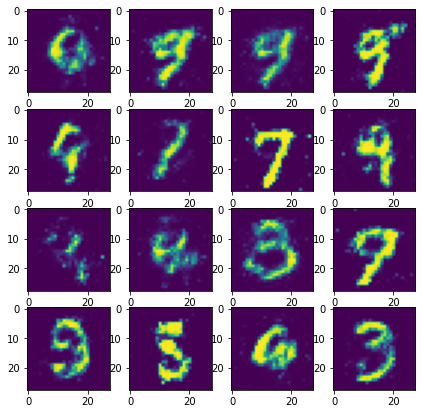

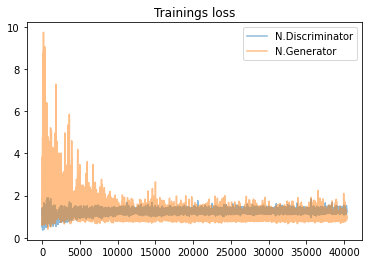

[44] -- discriminator_loss: 1.2690988779067993  -- generator_loss: 0.9019738435745239
[44] -- discriminator_loss: 1.290895938873291  -- generator_loss: 0.8964417576789856
[44] -- discriminator_loss: 1.1767501831054688  -- generator_loss: 1.0173143148422241
[44] -- discriminator_loss: 1.350592851638794  -- generator_loss: 0.9126510620117188
[44] -- discriminator_loss: 1.319948434829712  -- generator_loss: 0.8732301592826843
[44] -- discriminator_loss: 1.3471652269363403  -- generator_loss: 0.8844625949859619
[44] -- discriminator_loss: 1.2658312320709229  -- generator_loss: 0.9778717756271362
[44] -- discriminator_loss: 1.3327282667160034  -- generator_loss: 0.926149308681488
[44] -- discriminator_loss: 1.3527872562408447  -- generator_loss: 0.9306888580322266
[44] -- discriminator_loss: 1.151642084121704  -- generator_loss: 1.0177102088928223
[44] -- discriminator_loss: 1.2436567544937134  -- generator_loss: 1.1016970872879028
[44] -- discriminator_loss: 1.2838430404663086  -- generato

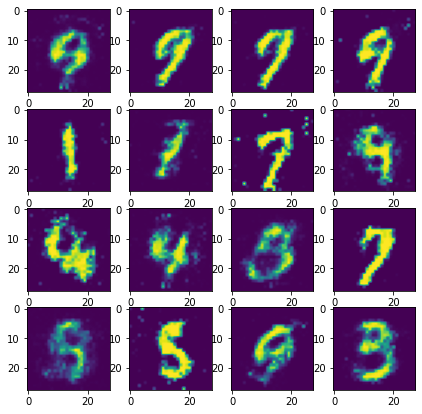

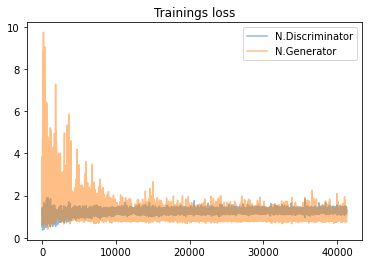

[45] -- discriminator_loss: 1.2820591926574707  -- generator_loss: 0.8240630626678467
[45] -- discriminator_loss: 1.3359863758087158  -- generator_loss: 0.8594133853912354
[45] -- discriminator_loss: 1.3256160020828247  -- generator_loss: 0.8913660645484924
[45] -- discriminator_loss: 1.3219419717788696  -- generator_loss: 1.0947320461273193
[45] -- discriminator_loss: 1.353618860244751  -- generator_loss: 0.8220651149749756
[45] -- discriminator_loss: 1.3111116886138916  -- generator_loss: 0.862874448299408
[45] -- discriminator_loss: 1.2567226886749268  -- generator_loss: 0.9342073202133179
[45] -- discriminator_loss: 1.160219430923462  -- generator_loss: 0.9553569555282593
[45] -- discriminator_loss: 1.2821497917175293  -- generator_loss: 0.9093705415725708
[45] -- discriminator_loss: 1.289771318435669  -- generator_loss: 0.9110003113746643
[45] -- discriminator_loss: 1.3440405130386353  -- generator_loss: 0.7706764936447144
[45] -- discriminator_loss: 1.2579731941223145  -- generat

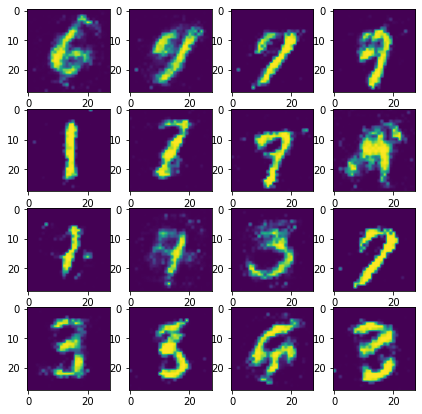

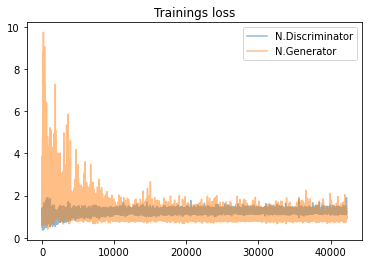

[46] -- discriminator_loss: 1.2564642429351807  -- generator_loss: 0.971835732460022
[46] -- discriminator_loss: 1.1722791194915771  -- generator_loss: 0.9345636963844299
[46] -- discriminator_loss: 1.3363484144210815  -- generator_loss: 1.3902016878128052
[46] -- discriminator_loss: 1.2965619564056396  -- generator_loss: 0.9256442785263062
[46] -- discriminator_loss: 1.3289599418640137  -- generator_loss: 0.8479899764060974
[46] -- discriminator_loss: 1.1974306106567383  -- generator_loss: 1.0617592334747314
[46] -- discriminator_loss: 1.3090059757232666  -- generator_loss: 0.8086589574813843
[46] -- discriminator_loss: 1.2869573831558228  -- generator_loss: 0.9162413477897644
[46] -- discriminator_loss: 1.2946887016296387  -- generator_loss: 0.9659997224807739
[46] -- discriminator_loss: 1.2234065532684326  -- generator_loss: 1.1887518167495728
[46] -- discriminator_loss: 1.324942946434021  -- generator_loss: 0.9938701391220093
[46] -- discriminator_loss: 1.2583575248718262  -- gener

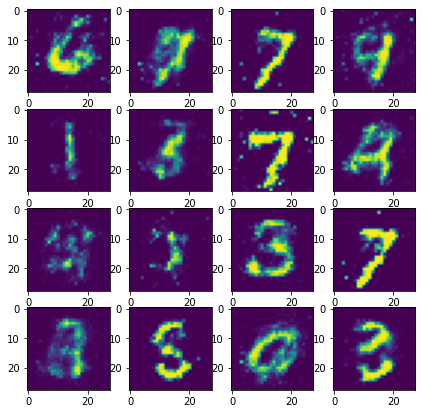

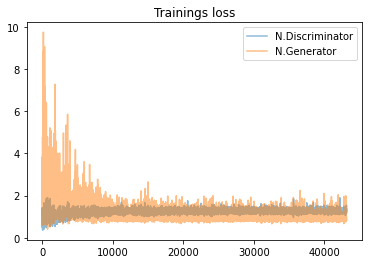

[47] -- discriminator_loss: 1.2440814971923828  -- generator_loss: 0.8948795199394226
[47] -- discriminator_loss: 1.2815742492675781  -- generator_loss: 0.9106742739677429
[47] -- discriminator_loss: 1.256503939628601  -- generator_loss: 1.0912939310073853
[47] -- discriminator_loss: 1.3469113111495972  -- generator_loss: 0.9230076670646667
[47] -- discriminator_loss: 1.3699827194213867  -- generator_loss: 1.0087209939956665
[47] -- discriminator_loss: 1.1949610710144043  -- generator_loss: 1.792005181312561
[47] -- discriminator_loss: 1.3594167232513428  -- generator_loss: 0.9825372695922852
[47] -- discriminator_loss: 1.258988380432129  -- generator_loss: 0.9766965508460999
[47] -- discriminator_loss: 1.27560555934906  -- generator_loss: 1.0500133037567139
[47] -- discriminator_loss: 1.3075461387634277  -- generator_loss: 0.7548101544380188
[47] -- discriminator_loss: 1.3388973474502563  -- generator_loss: 0.8315236568450928
[47] -- discriminator_loss: 1.2235875129699707  -- generato

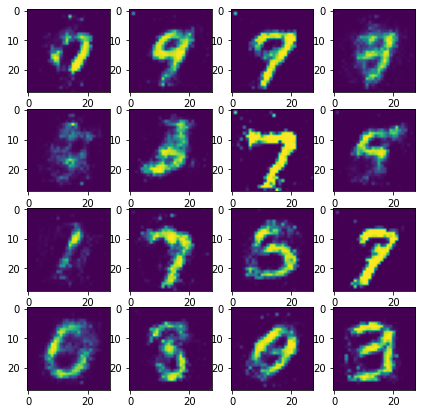

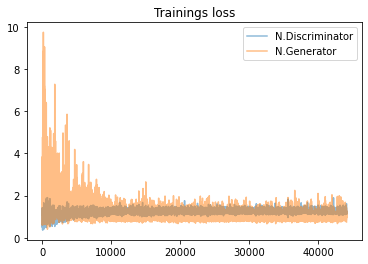

[48] -- discriminator_loss: 1.3388278484344482  -- generator_loss: 0.8032529354095459
[48] -- discriminator_loss: 1.4354716539382935  -- generator_loss: 0.8713164329528809
[48] -- discriminator_loss: 1.2845730781555176  -- generator_loss: 0.7603874206542969
[48] -- discriminator_loss: 1.3655210733413696  -- generator_loss: 0.9345808625221252
[48] -- discriminator_loss: 1.3058152198791504  -- generator_loss: 0.9196889400482178
[48] -- discriminator_loss: 1.2491919994354248  -- generator_loss: 1.0816251039505005
[48] -- discriminator_loss: 1.3609061241149902  -- generator_loss: 0.9706631898880005
[48] -- discriminator_loss: 1.234687089920044  -- generator_loss: 0.8956838250160217
[48] -- discriminator_loss: 1.164300560951233  -- generator_loss: 1.53084135055542
[48] -- discriminator_loss: 1.3374173641204834  -- generator_loss: 0.9822925329208374
[48] -- discriminator_loss: 1.3169130086898804  -- generator_loss: 0.836901843547821
[48] -- discriminator_loss: 1.2377232313156128  -- generato

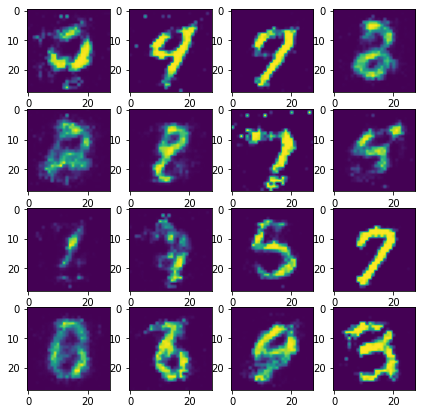

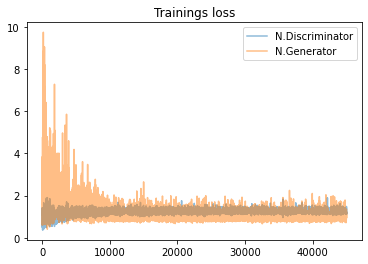

[49] -- discriminator_loss: 1.3885815143585205  -- generator_loss: 0.9747902154922485
[49] -- discriminator_loss: 1.286771297454834  -- generator_loss: 0.9981756806373596
[49] -- discriminator_loss: 1.2664848566055298  -- generator_loss: 0.9275172352790833
[49] -- discriminator_loss: 1.2581716775894165  -- generator_loss: 1.0097131729125977
[49] -- discriminator_loss: 1.29794442653656  -- generator_loss: 0.9635356664657593
[49] -- discriminator_loss: 1.2834399938583374  -- generator_loss: 0.9302699565887451
[49] -- discriminator_loss: 1.2535998821258545  -- generator_loss: 0.9820268154144287
[49] -- discriminator_loss: 1.226806879043579  -- generator_loss: 1.1546356678009033
[49] -- discriminator_loss: 1.357454538345337  -- generator_loss: 1.1897763013839722
[49] -- discriminator_loss: 1.2860915660858154  -- generator_loss: 0.8507466316223145
[49] -- discriminator_loss: 1.1765365600585938  -- generator_loss: 1.0029841661453247
[49] -- discriminator_loss: 1.2698394060134888  -- generato

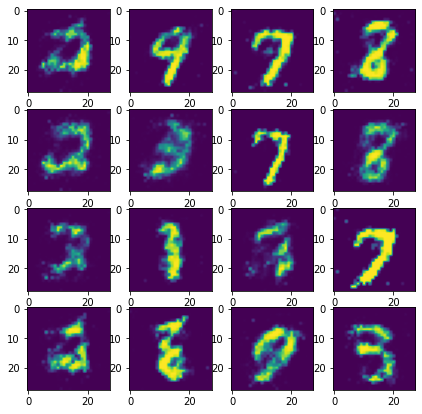

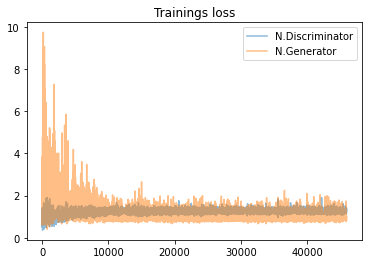

[50] -- discriminator_loss: 1.2962918281555176  -- generator_loss: 0.9234524965286255
[50] -- discriminator_loss: 1.3244829177856445  -- generator_loss: 0.8847377896308899
[50] -- discriminator_loss: 1.1712661981582642  -- generator_loss: 1.2735202312469482
[50] -- discriminator_loss: 1.3381636142730713  -- generator_loss: 0.8853393793106079
[50] -- discriminator_loss: 1.2591187953948975  -- generator_loss: 1.0943933725357056
[50] -- discriminator_loss: 1.4228689670562744  -- generator_loss: 1.1974527835845947
[50] -- discriminator_loss: 1.3257555961608887  -- generator_loss: 0.9528981447219849
[50] -- discriminator_loss: 1.1840099096298218  -- generator_loss: 1.1935185194015503
[50] -- discriminator_loss: 1.2909126281738281  -- generator_loss: 1.0430824756622314
[50] -- discriminator_loss: 1.2911278009414673  -- generator_loss: 0.8599731922149658
[50] -- discriminator_loss: 1.3827874660491943  -- generator_loss: 0.9249391555786133
[50] -- discriminator_loss: 1.2968385219573975  -- gen

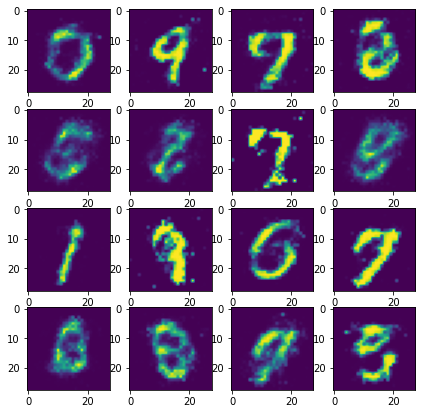

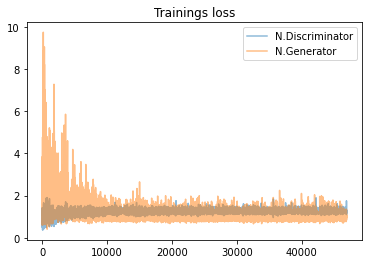

[51] -- discriminator_loss: 1.3548532724380493  -- generator_loss: 0.9804563522338867
[51] -- discriminator_loss: 1.3879141807556152  -- generator_loss: 1.0164281129837036
[51] -- discriminator_loss: 1.3048492670059204  -- generator_loss: 0.9507737159729004
[51] -- discriminator_loss: 1.3721644878387451  -- generator_loss: 0.9521642327308655
[51] -- discriminator_loss: 1.4092109203338623  -- generator_loss: 0.9092985391616821
[51] -- discriminator_loss: 1.300132393836975  -- generator_loss: 1.05802583694458
[51] -- discriminator_loss: 1.3065762519836426  -- generator_loss: 1.0267894268035889
[51] -- discriminator_loss: 1.210216999053955  -- generator_loss: 1.0278749465942383
[51] -- discriminator_loss: 1.2357542514801025  -- generator_loss: 1.0362029075622559
[51] -- discriminator_loss: 1.2252082824707031  -- generator_loss: 0.9035294651985168
[51] -- discriminator_loss: 1.3384743928909302  -- generator_loss: 0.9291053414344788
[51] -- discriminator_loss: 1.2197699546813965  -- generat

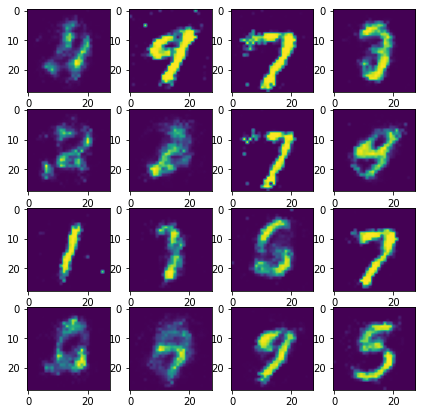

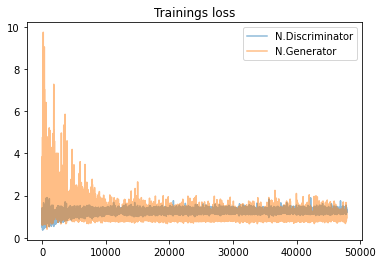

[52] -- discriminator_loss: 1.115718960762024  -- generator_loss: 1.2164161205291748
[52] -- discriminator_loss: 1.2355196475982666  -- generator_loss: 1.3879778385162354
[52] -- discriminator_loss: 1.2760953903198242  -- generator_loss: 0.9289352893829346
[52] -- discriminator_loss: 1.3997294902801514  -- generator_loss: 0.9103376269340515
[52] -- discriminator_loss: 1.2977004051208496  -- generator_loss: 0.9103587865829468
[52] -- discriminator_loss: 1.352175235748291  -- generator_loss: 1.1306655406951904
[52] -- discriminator_loss: 1.3555760383605957  -- generator_loss: 1.0169689655303955
[52] -- discriminator_loss: 1.2613475322723389  -- generator_loss: 0.9197078347206116
[52] -- discriminator_loss: 1.3879849910736084  -- generator_loss: 1.108830451965332
[52] -- discriminator_loss: 1.1819114685058594  -- generator_loss: 1.0145612955093384
[52] -- discriminator_loss: 1.327664852142334  -- generator_loss: 0.8029130101203918
[52] -- discriminator_loss: 1.2783277034759521  -- generat

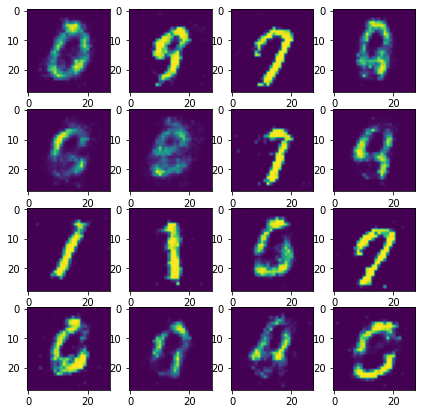

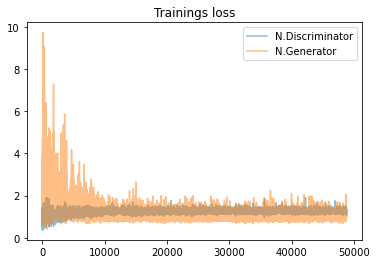

[53] -- discriminator_loss: 1.331313133239746  -- generator_loss: 1.028950810432434
[53] -- discriminator_loss: 1.3210850954055786  -- generator_loss: 0.9413611888885498
[53] -- discriminator_loss: 1.405447006225586  -- generator_loss: 0.9204002022743225
[53] -- discriminator_loss: 1.2148096561431885  -- generator_loss: 1.236337661743164
[53] -- discriminator_loss: 1.3147889375686646  -- generator_loss: 1.0778943300247192
[53] -- discriminator_loss: 1.3173542022705078  -- generator_loss: 0.7810283303260803
[53] -- discriminator_loss: 1.2298091650009155  -- generator_loss: 0.955758810043335
[53] -- discriminator_loss: 1.1931684017181396  -- generator_loss: 1.1276187896728516
[53] -- discriminator_loss: 1.2015042304992676  -- generator_loss: 1.0081908702850342
[53] -- discriminator_loss: 1.235788106918335  -- generator_loss: 1.1044012308120728
[53] -- discriminator_loss: 1.1905888319015503  -- generator_loss: 1.0765361785888672
[53] -- discriminator_loss: 1.373699426651001  -- generator_

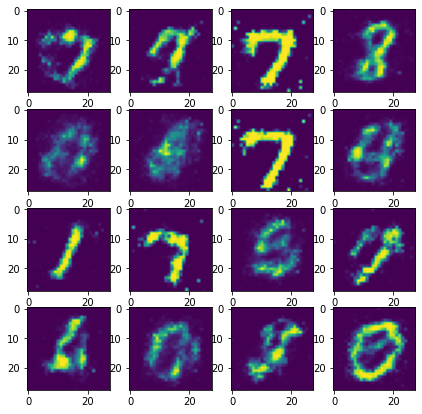

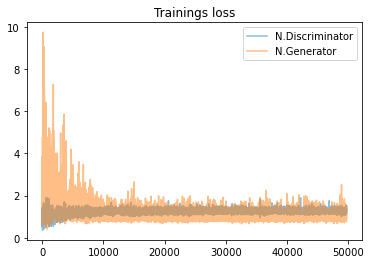

[54] -- discriminator_loss: 1.329988956451416  -- generator_loss: 0.8603883981704712
[54] -- discriminator_loss: 1.3365732431411743  -- generator_loss: 0.869956374168396
[54] -- discriminator_loss: 1.2544291019439697  -- generator_loss: 0.8710901141166687
[54] -- discriminator_loss: 1.342159390449524  -- generator_loss: 0.8976767063140869
[54] -- discriminator_loss: 1.259488821029663  -- generator_loss: 1.1170198917388916
[54] -- discriminator_loss: 1.2132878303527832  -- generator_loss: 1.189583420753479
[54] -- discriminator_loss: 1.2690019607543945  -- generator_loss: 0.8752737045288086
[54] -- discriminator_loss: 1.2562397718429565  -- generator_loss: 0.9388538599014282
[54] -- discriminator_loss: 1.260230302810669  -- generator_loss: 1.0006687641143799
[54] -- discriminator_loss: 1.1898281574249268  -- generator_loss: 1.1346288919448853
[54] -- discriminator_loss: 1.294513463973999  -- generator_loss: 0.8619599342346191
[54] -- discriminator_loss: 1.2736170291900635  -- generator_

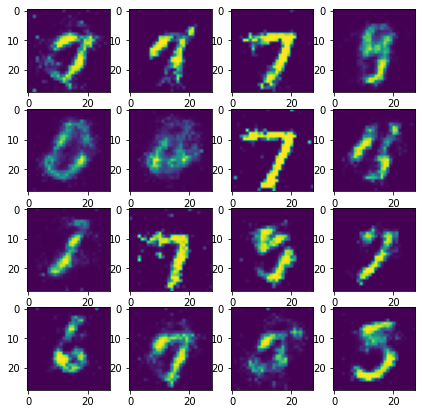

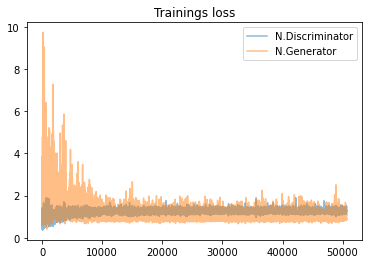

[55] -- discriminator_loss: 1.310879111289978  -- generator_loss: 0.8977155089378357
[55] -- discriminator_loss: 1.262702226638794  -- generator_loss: 0.8436493873596191
[55] -- discriminator_loss: 1.289194107055664  -- generator_loss: 0.9640360474586487
[55] -- discriminator_loss: 1.2423524856567383  -- generator_loss: 0.9012722373008728
[55] -- discriminator_loss: 1.3588006496429443  -- generator_loss: 1.0343765020370483
[55] -- discriminator_loss: 1.3200335502624512  -- generator_loss: 1.1763030290603638
[55] -- discriminator_loss: 1.3130056858062744  -- generator_loss: 0.9338000416755676
[55] -- discriminator_loss: 1.2631484270095825  -- generator_loss: 1.104764461517334
[55] -- discriminator_loss: 1.3396060466766357  -- generator_loss: 0.9083821773529053
[55] -- discriminator_loss: 1.2789523601531982  -- generator_loss: 0.9533055424690247
[55] -- discriminator_loss: 1.3631938695907593  -- generator_loss: 0.8900644183158875
[55] -- discriminator_loss: 1.223029613494873  -- generato

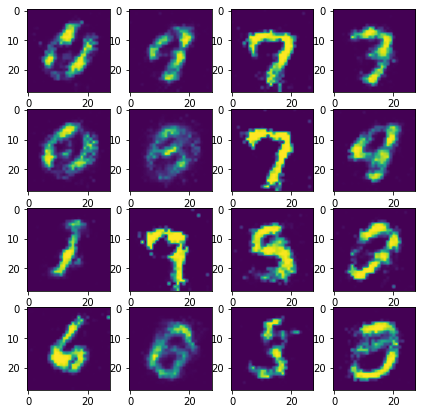

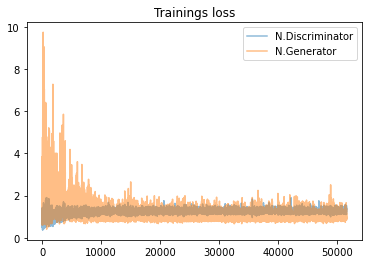

[56] -- discriminator_loss: 1.2760809659957886  -- generator_loss: 0.9168074727058411
[56] -- discriminator_loss: 1.1910152435302734  -- generator_loss: 0.9718018174171448
[56] -- discriminator_loss: 1.2295567989349365  -- generator_loss: 1.0013221502304077
[56] -- discriminator_loss: 1.2520149946212769  -- generator_loss: 1.595565915107727
[56] -- discriminator_loss: 1.3303358554840088  -- generator_loss: 1.0523427724838257
[56] -- discriminator_loss: 1.3124580383300781  -- generator_loss: 0.8236917853355408
[56] -- discriminator_loss: 1.2828748226165771  -- generator_loss: 0.9255428910255432
[56] -- discriminator_loss: 1.2283599376678467  -- generator_loss: 1.0784357786178589
[56] -- discriminator_loss: 1.3808338642120361  -- generator_loss: 1.0716450214385986
[56] -- discriminator_loss: 1.2470529079437256  -- generator_loss: 0.941504955291748
[56] -- discriminator_loss: 1.2868425846099854  -- generator_loss: 0.9106991291046143
[56] -- discriminator_loss: 1.2933745384216309  -- gener

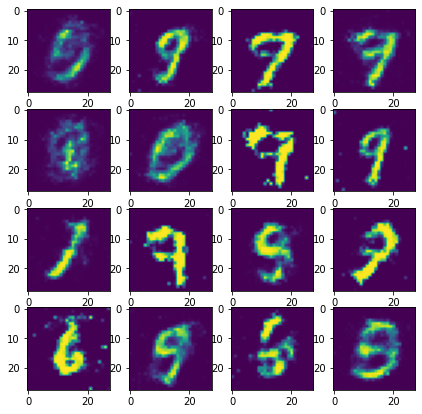

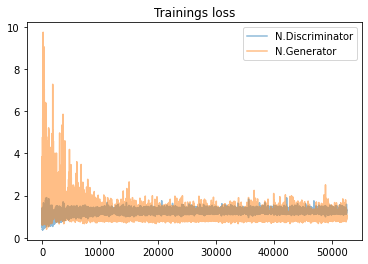

[57] -- discriminator_loss: 1.3793189525604248  -- generator_loss: 0.8286830186843872
[57] -- discriminator_loss: 1.3406219482421875  -- generator_loss: 0.824146032333374
[57] -- discriminator_loss: 1.2923634052276611  -- generator_loss: 0.8496596217155457
[57] -- discriminator_loss: 1.3606784343719482  -- generator_loss: 0.939113974571228
[57] -- discriminator_loss: 1.293789029121399  -- generator_loss: 0.9461200833320618
[57] -- discriminator_loss: 1.3264312744140625  -- generator_loss: 0.8792558312416077
[57] -- discriminator_loss: 1.3301358222961426  -- generator_loss: 0.9047734141349792
[57] -- discriminator_loss: 1.2473927736282349  -- generator_loss: 0.9310147762298584
[57] -- discriminator_loss: 1.1691672801971436  -- generator_loss: 1.0457470417022705
[57] -- discriminator_loss: 1.4657166004180908  -- generator_loss: 0.8422324657440186
[57] -- discriminator_loss: 1.294487714767456  -- generator_loss: 0.8482741117477417
[57] -- discriminator_loss: 1.2798434495925903  -- generat

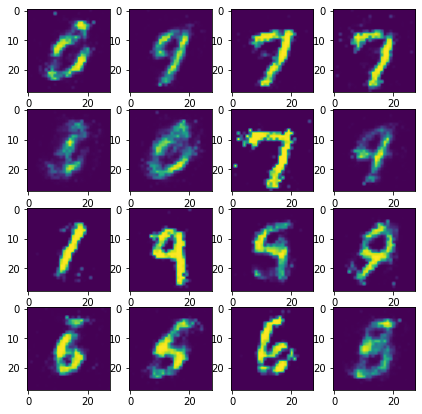

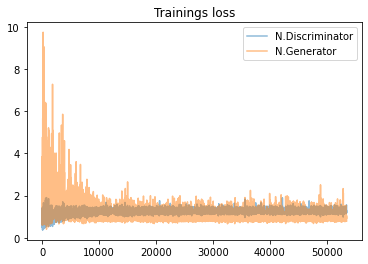

[58] -- discriminator_loss: 1.2115646600723267  -- generator_loss: 1.043031096458435
[58] -- discriminator_loss: 1.25295090675354  -- generator_loss: 0.8714025616645813
[58] -- discriminator_loss: 1.2930978536605835  -- generator_loss: 1.0574109554290771
[58] -- discriminator_loss: 1.3021390438079834  -- generator_loss: 0.9579712152481079
[58] -- discriminator_loss: 1.3725074529647827  -- generator_loss: 0.8409256339073181
[58] -- discriminator_loss: 1.3686769008636475  -- generator_loss: 0.8237523436546326
[58] -- discriminator_loss: 1.2460923194885254  -- generator_loss: 0.9698879718780518
[58] -- discriminator_loss: 1.0898874998092651  -- generator_loss: 1.4544835090637207
[58] -- discriminator_loss: 1.2363905906677246  -- generator_loss: 1.0581070184707642
[58] -- discriminator_loss: 1.3362315893173218  -- generator_loss: 0.9054009914398193
[58] -- discriminator_loss: 1.3615586757659912  -- generator_loss: 0.9369586110115051
[58] -- discriminator_loss: 1.3206918239593506  -- genera

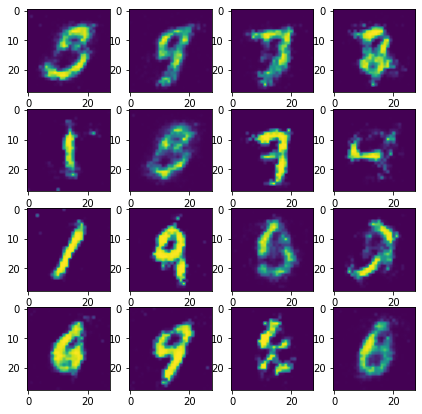

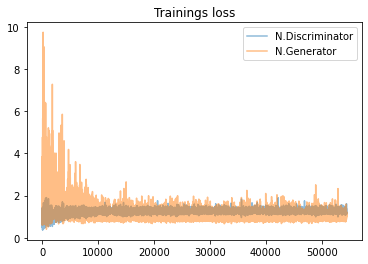

[59] -- discriminator_loss: 1.2730427980422974  -- generator_loss: 1.0386221408843994
[59] -- discriminator_loss: 1.26179039478302  -- generator_loss: 1.0108509063720703
[59] -- discriminator_loss: 1.246530294418335  -- generator_loss: 0.9231421947479248
[59] -- discriminator_loss: 1.417959213256836  -- generator_loss: 0.9638787508010864
[59] -- discriminator_loss: 1.2430815696716309  -- generator_loss: 1.0051181316375732
[59] -- discriminator_loss: 1.356366753578186  -- generator_loss: 0.8890430927276611
[59] -- discriminator_loss: 1.2247974872589111  -- generator_loss: 1.0278512239456177
[59] -- discriminator_loss: 1.2279242277145386  -- generator_loss: 1.1154242753982544
[59] -- discriminator_loss: 1.291426658630371  -- generator_loss: 1.0427716970443726
[59] -- discriminator_loss: 1.3180665969848633  -- generator_loss: 1.0741615295410156
[59] -- discriminator_loss: 1.3338499069213867  -- generator_loss: 0.9088134765625
[59] -- discriminator_loss: 1.3474081754684448  -- generator_lo

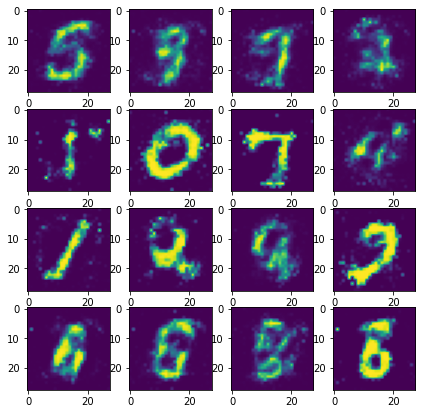

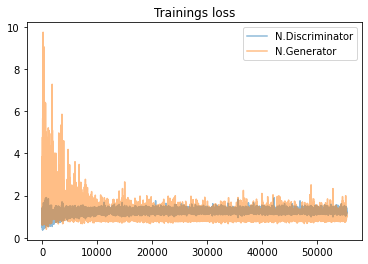

[60] -- discriminator_loss: 1.2712284326553345  -- generator_loss: 0.9431684017181396
[60] -- discriminator_loss: 1.2882511615753174  -- generator_loss: 1.01265549659729
[60] -- discriminator_loss: 1.217597484588623  -- generator_loss: 0.93593829870224
[60] -- discriminator_loss: 1.4036192893981934  -- generator_loss: 1.0378981828689575
[60] -- discriminator_loss: 1.3664109706878662  -- generator_loss: 1.0034942626953125
[60] -- discriminator_loss: 1.3260234594345093  -- generator_loss: 0.8990453481674194
[60] -- discriminator_loss: 1.3382422924041748  -- generator_loss: 0.8209179639816284
[60] -- discriminator_loss: 1.2616736888885498  -- generator_loss: 0.9079974889755249
[60] -- discriminator_loss: 1.2581943273544312  -- generator_loss: 1.179423213005066
[60] -- discriminator_loss: 1.3066837787628174  -- generator_loss: 0.9019145965576172
[60] -- discriminator_loss: 1.4206302165985107  -- generator_loss: 0.960598886013031
[60] -- discriminator_loss: 1.2216206789016724  -- generator_

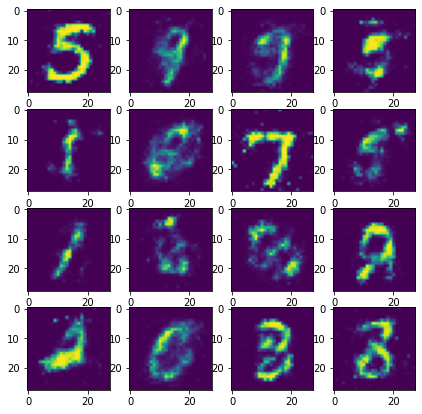

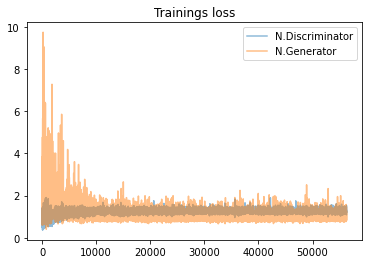

[61] -- discriminator_loss: 1.2925301790237427  -- generator_loss: 0.8656603693962097
[61] -- discriminator_loss: 1.2534968852996826  -- generator_loss: 0.8944897651672363
[61] -- discriminator_loss: 1.1975181102752686  -- generator_loss: 1.0756279230117798
[61] -- discriminator_loss: 1.3190350532531738  -- generator_loss: 0.8866187334060669
[61] -- discriminator_loss: 1.2500402927398682  -- generator_loss: 1.1216400861740112
[61] -- discriminator_loss: 1.3890851736068726  -- generator_loss: 0.8216160535812378
[61] -- discriminator_loss: 1.291121006011963  -- generator_loss: 0.8006235957145691
[61] -- discriminator_loss: 1.1909072399139404  -- generator_loss: 1.028464674949646
[61] -- discriminator_loss: 1.284314751625061  -- generator_loss: 1.528311014175415
[61] -- discriminator_loss: 1.30280339717865  -- generator_loss: 0.9011065363883972
[61] -- discriminator_loss: 1.395561933517456  -- generator_loss: 0.8911880850791931
[61] -- discriminator_loss: 1.2401472330093384  -- generator_

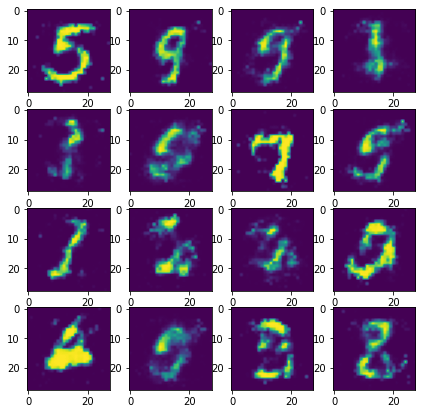

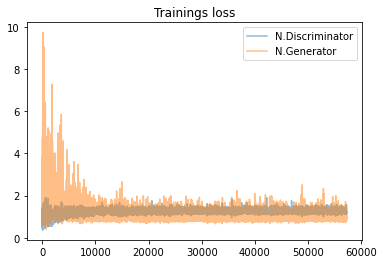

[62] -- discriminator_loss: 1.365325689315796  -- generator_loss: 0.9331424236297607
[62] -- discriminator_loss: 1.2710212469100952  -- generator_loss: 0.9011396765708923
[62] -- discriminator_loss: 1.253049373626709  -- generator_loss: 0.9381624460220337
[62] -- discriminator_loss: 1.2057313919067383  -- generator_loss: 0.9517427682876587
[62] -- discriminator_loss: 1.2959493398666382  -- generator_loss: 0.8864694833755493
[62] -- discriminator_loss: 1.3261795043945312  -- generator_loss: 0.8875824213027954
[62] -- discriminator_loss: 1.2860947847366333  -- generator_loss: 0.9807876348495483
[62] -- discriminator_loss: 1.221533179283142  -- generator_loss: 1.2055727243423462
[62] -- discriminator_loss: 1.3311336040496826  -- generator_loss: 1.0540944337844849
[62] -- discriminator_loss: 1.2901211977005005  -- generator_loss: 1.0212677717208862
[62] -- discriminator_loss: 1.3025354146957397  -- generator_loss: 0.8702845573425293
[62] -- discriminator_loss: 1.176831603050232  -- generat

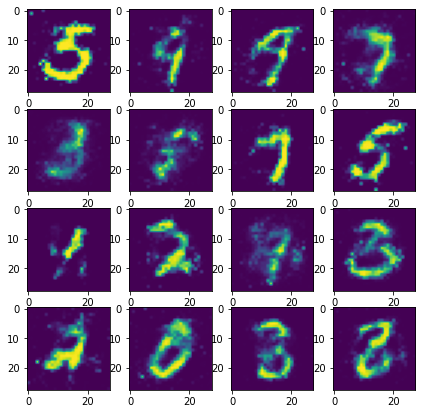

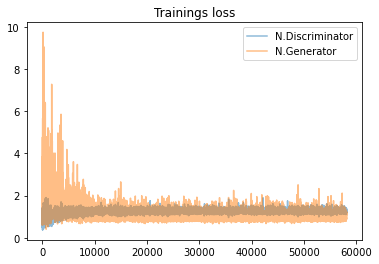

[63] -- discriminator_loss: 1.2951749563217163  -- generator_loss: 0.832321047782898
[63] -- discriminator_loss: 1.2692680358886719  -- generator_loss: 0.8308401703834534
[63] -- discriminator_loss: 1.226326823234558  -- generator_loss: 1.0129166841506958
[63] -- discriminator_loss: 1.3489799499511719  -- generator_loss: 0.9317175149917603
[63] -- discriminator_loss: 1.3165444135665894  -- generator_loss: 0.8286667466163635
[63] -- discriminator_loss: 1.2823454141616821  -- generator_loss: 0.9530166983604431
[63] -- discriminator_loss: 1.3444468975067139  -- generator_loss: 1.0335381031036377
[63] -- discriminator_loss: 1.2511913776397705  -- generator_loss: 1.102826476097107
[63] -- discriminator_loss: 1.3873615264892578  -- generator_loss: 1.021483302116394
[63] -- discriminator_loss: 1.3428764343261719  -- generator_loss: 0.8758234977722168
[63] -- discriminator_loss: 1.244140625  -- generator_loss: 0.9881258010864258
[63] -- discriminator_loss: 1.2710037231445312  -- generator_loss

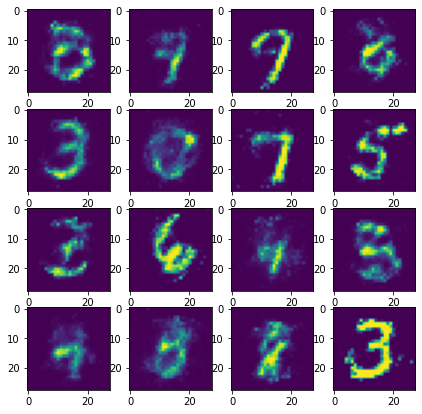

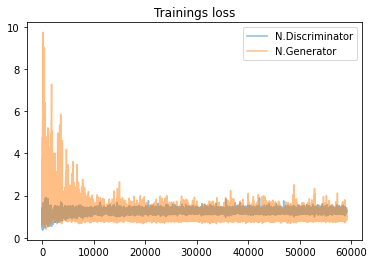

[64] -- discriminator_loss: 1.2772417068481445  -- generator_loss: 0.8366453647613525
[64] -- discriminator_loss: 1.2359309196472168  -- generator_loss: 0.8990471363067627
[64] -- discriminator_loss: 1.2138699293136597  -- generator_loss: 1.092071771621704
[64] -- discriminator_loss: 1.2666882276535034  -- generator_loss: 0.9667813181877136
[64] -- discriminator_loss: 1.2690775394439697  -- generator_loss: 1.2870298624038696
[64] -- discriminator_loss: 1.2950668334960938  -- generator_loss: 0.918792724609375
[64] -- discriminator_loss: 1.158178687095642  -- generator_loss: 0.958123505115509
[64] -- discriminator_loss: 1.1669427156448364  -- generator_loss: 0.9688305258750916
[64] -- discriminator_loss: 1.3608908653259277  -- generator_loss: 1.0037810802459717
[64] -- discriminator_loss: 1.3223094940185547  -- generator_loss: 0.9995176196098328
[64] -- discriminator_loss: 1.200845718383789  -- generator_loss: 1.0058045387268066
[64] -- discriminator_loss: 1.3028481006622314  -- generato

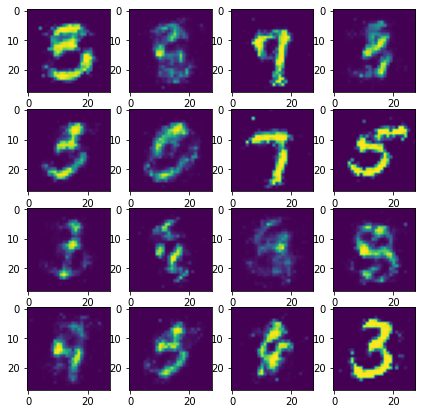

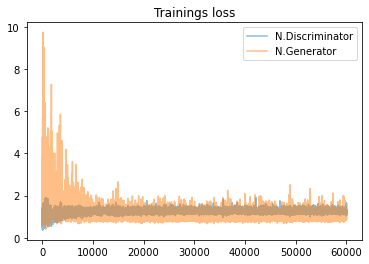

[65] -- discriminator_loss: 1.2259081602096558  -- generator_loss: 0.9063832759857178
[65] -- discriminator_loss: 1.2676715850830078  -- generator_loss: 0.8137456774711609
[65] -- discriminator_loss: 1.2626746892929077  -- generator_loss: 0.995180606842041
[65] -- discriminator_loss: 1.264826774597168  -- generator_loss: 1.0322438478469849
[65] -- discriminator_loss: 1.2382851839065552  -- generator_loss: 0.9362706542015076
[65] -- discriminator_loss: 1.251359462738037  -- generator_loss: 0.8741841912269592
[65] -- discriminator_loss: 1.3038345575332642  -- generator_loss: 1.113610863685608
[65] -- discriminator_loss: 1.3104721307754517  -- generator_loss: 1.0788160562515259
[65] -- discriminator_loss: 1.268268346786499  -- generator_loss: 0.9542111754417419
[65] -- discriminator_loss: 1.3287444114685059  -- generator_loss: 0.8482952117919922
[65] -- discriminator_loss: 1.2853580713272095  -- generator_loss: 1.023475170135498
[65] -- discriminator_loss: 1.1923856735229492  -- generator

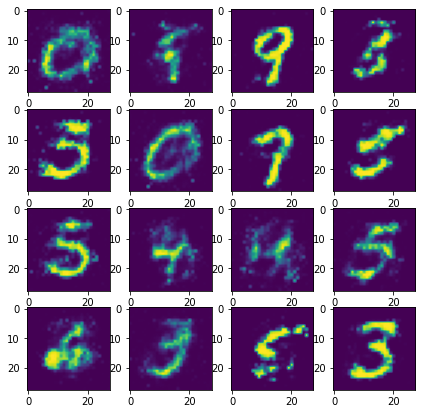

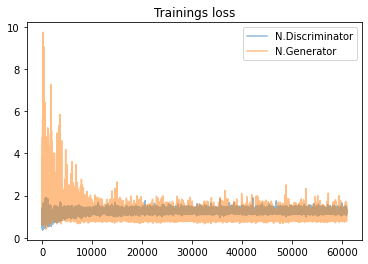

[66] -- discriminator_loss: 1.304577112197876  -- generator_loss: 0.9881253242492676
[66] -- discriminator_loss: 1.3700928688049316  -- generator_loss: 0.9462375640869141
[66] -- discriminator_loss: 1.3278841972351074  -- generator_loss: 0.9738976359367371
[66] -- discriminator_loss: 1.3380801677703857  -- generator_loss: 0.8885314464569092
[66] -- discriminator_loss: 1.2531073093414307  -- generator_loss: 1.1475707292556763
[66] -- discriminator_loss: 1.2171354293823242  -- generator_loss: 0.8874694108963013
[66] -- discriminator_loss: 1.2959647178649902  -- generator_loss: 1.0228219032287598
[66] -- discriminator_loss: 1.2567076683044434  -- generator_loss: 1.1544052362442017
[66] -- discriminator_loss: 1.1947686672210693  -- generator_loss: 0.9203923940658569
[66] -- discriminator_loss: 1.319057822227478  -- generator_loss: 1.0657875537872314
[66] -- discriminator_loss: 1.3093749284744263  -- generator_loss: 0.8652552366256714
[66] -- discriminator_loss: 1.2984914779663086  -- gener

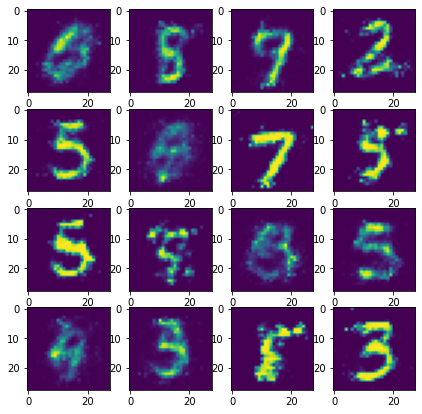

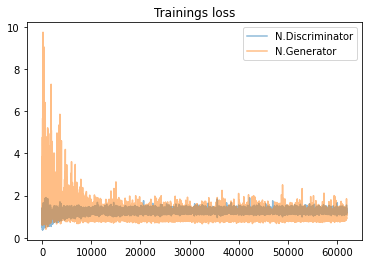

[67] -- discriminator_loss: 1.353859305381775  -- generator_loss: 1.2035220861434937
[67] -- discriminator_loss: 1.265415906906128  -- generator_loss: 0.8196227550506592
[67] -- discriminator_loss: 1.3104392290115356  -- generator_loss: 1.0272512435913086
[67] -- discriminator_loss: 1.2916717529296875  -- generator_loss: 1.1182072162628174
[67] -- discriminator_loss: 1.2028576135635376  -- generator_loss: 1.173214077949524
[67] -- discriminator_loss: 1.212868332862854  -- generator_loss: 0.959568202495575
[67] -- discriminator_loss: 1.2708561420440674  -- generator_loss: 0.9988112449645996
[67] -- discriminator_loss: 1.2466485500335693  -- generator_loss: 1.1009225845336914
[67] -- discriminator_loss: 1.3797012567520142  -- generator_loss: 0.9024572968482971
[67] -- discriminator_loss: 1.2765636444091797  -- generator_loss: 1.015573501586914
[67] -- discriminator_loss: 1.2700186967849731  -- generator_loss: 0.8696461319923401
[67] -- discriminator_loss: 1.2727242708206177  -- generator

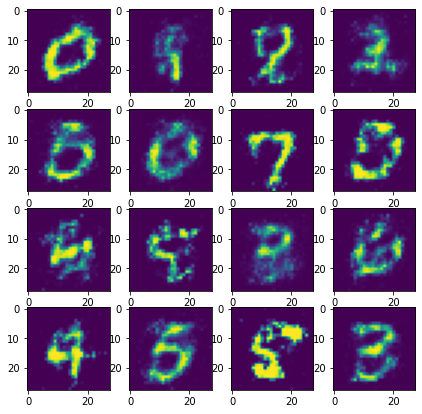

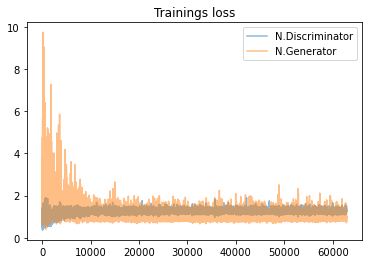

[68] -- discriminator_loss: 1.363016128540039  -- generator_loss: 1.0281317234039307
[68] -- discriminator_loss: 1.3050551414489746  -- generator_loss: 0.9848099946975708
[68] -- discriminator_loss: 1.1527647972106934  -- generator_loss: 1.199418544769287
[68] -- discriminator_loss: 1.2546358108520508  -- generator_loss: 1.1107393503189087
[68] -- discriminator_loss: 1.317157506942749  -- generator_loss: 0.8702489733695984
[68] -- discriminator_loss: 1.2894624471664429  -- generator_loss: 0.9078472852706909
[68] -- discriminator_loss: 1.2429206371307373  -- generator_loss: 0.9946734309196472
[68] -- discriminator_loss: 1.1928950548171997  -- generator_loss: 1.1897635459899902
[68] -- discriminator_loss: 1.18632972240448  -- generator_loss: 1.4872058629989624
[68] -- discriminator_loss: 1.441145896911621  -- generator_loss: 0.8634021878242493
[68] -- discriminator_loss: 1.3564791679382324  -- generator_loss: 0.7782449126243591
[68] -- discriminator_loss: 1.330631136894226  -- generator_

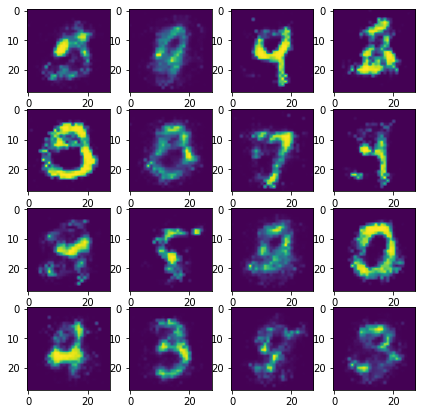

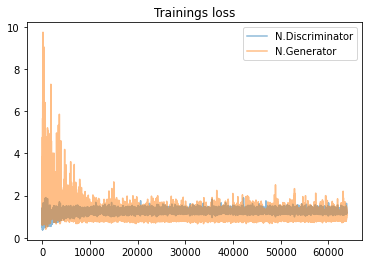

[69] -- discriminator_loss: 1.4148545265197754  -- generator_loss: 1.2420777082443237
[69] -- discriminator_loss: 1.138689637184143  -- generator_loss: 0.9369311928749084
[69] -- discriminator_loss: 1.249707818031311  -- generator_loss: 0.9859042763710022
[69] -- discriminator_loss: 1.2539958953857422  -- generator_loss: 1.151092529296875
[69] -- discriminator_loss: 1.2722923755645752  -- generator_loss: 0.8144358992576599
[69] -- discriminator_loss: 1.3142132759094238  -- generator_loss: 0.8884677886962891
[69] -- discriminator_loss: 1.256317377090454  -- generator_loss: 1.0197025537490845
[69] -- discriminator_loss: 1.3598146438598633  -- generator_loss: 1.1101298332214355
[69] -- discriminator_loss: 1.2401807308197021  -- generator_loss: 1.064281940460205
[69] -- discriminator_loss: 1.2941029071807861  -- generator_loss: 1.209402084350586
[69] -- discriminator_loss: 1.3818905353546143  -- generator_loss: 0.9280563592910767
[69] -- discriminator_loss: 1.2613768577575684  -- generator

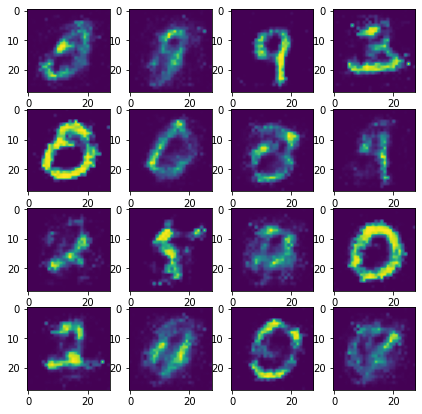

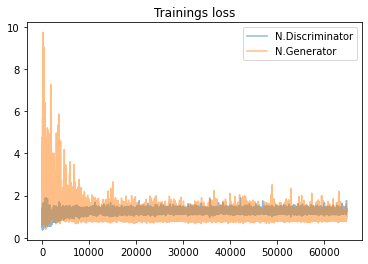

[70] -- discriminator_loss: 1.3015780448913574  -- generator_loss: 0.8508951663970947
[70] -- discriminator_loss: 1.2890068292617798  -- generator_loss: 0.8409740924835205
[70] -- discriminator_loss: 1.323950171470642  -- generator_loss: 0.8865081071853638
[70] -- discriminator_loss: 1.3072129487991333  -- generator_loss: 0.9167337417602539
[70] -- discriminator_loss: 1.4224488735198975  -- generator_loss: 0.8547799587249756
[70] -- discriminator_loss: 1.3443119525909424  -- generator_loss: 0.9210919141769409
[70] -- discriminator_loss: 1.2685843706130981  -- generator_loss: 0.9446843862533569
[70] -- discriminator_loss: 1.138561487197876  -- generator_loss: 1.0304858684539795
[70] -- discriminator_loss: 1.3627890348434448  -- generator_loss: 0.8845639228820801
[70] -- discriminator_loss: 1.371762752532959  -- generator_loss: 0.8973433971405029
[70] -- discriminator_loss: 1.2625222206115723  -- generator_loss: 0.9223949909210205
[70] -- discriminator_loss: 1.277933120727539  -- generat

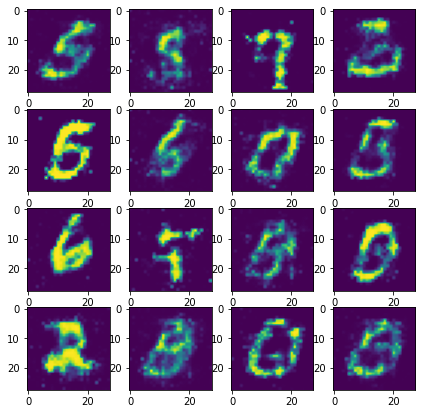

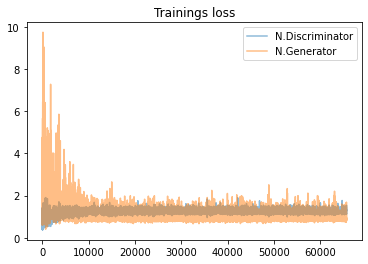

[71] -- discriminator_loss: 1.3280941247940063  -- generator_loss: 0.7752767205238342
[71] -- discriminator_loss: 1.3458307981491089  -- generator_loss: 0.7734800577163696
[71] -- discriminator_loss: 1.2218029499053955  -- generator_loss: 1.0122334957122803
[71] -- discriminator_loss: 1.2458702325820923  -- generator_loss: 1.3395960330963135
[71] -- discriminator_loss: 1.4102694988250732  -- generator_loss: 1.0096372365951538
[71] -- discriminator_loss: 1.2316442728042603  -- generator_loss: 1.5640326738357544
[71] -- discriminator_loss: 1.3624228239059448  -- generator_loss: 0.8788870573043823
[71] -- discriminator_loss: 1.264620304107666  -- generator_loss: 0.8995652794837952
[71] -- discriminator_loss: 1.315567135810852  -- generator_loss: 1.2656023502349854
[71] -- discriminator_loss: 1.3012018203735352  -- generator_loss: 1.0152528285980225
[71] -- discriminator_loss: 1.17238187789917  -- generator_loss: 1.3006432056427002
[71] -- discriminator_loss: 1.2859694957733154  -- generat

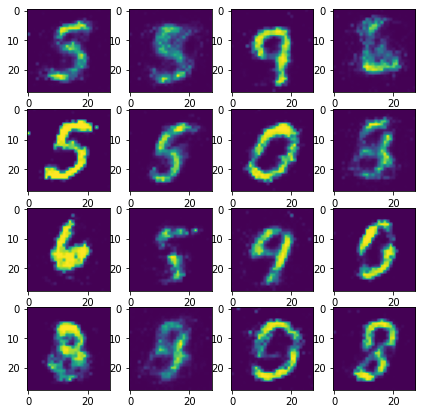

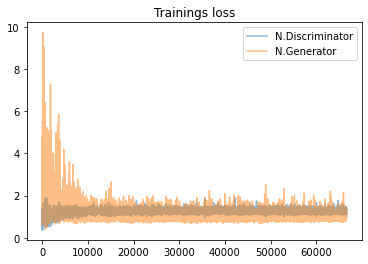

[72] -- discriminator_loss: 1.2591190338134766  -- generator_loss: 0.9004311561584473
[72] -- discriminator_loss: 1.2521507740020752  -- generator_loss: 0.8844587802886963
[72] -- discriminator_loss: 1.2933266162872314  -- generator_loss: 0.9518141746520996
[72] -- discriminator_loss: 1.320983648300171  -- generator_loss: 1.13593327999115
[72] -- discriminator_loss: 1.1710518598556519  -- generator_loss: 1.0745317935943604
[72] -- discriminator_loss: 1.2517374753952026  -- generator_loss: 0.9490249156951904
[72] -- discriminator_loss: 1.3407161235809326  -- generator_loss: 0.9733029007911682
[72] -- discriminator_loss: 1.238163709640503  -- generator_loss: 0.9342222809791565
[72] -- discriminator_loss: 1.2846722602844238  -- generator_loss: 0.9033624529838562
[72] -- discriminator_loss: 1.2460139989852905  -- generator_loss: 0.9027857780456543
[72] -- discriminator_loss: 1.3449440002441406  -- generator_loss: 0.8881382942199707
[72] -- discriminator_loss: 1.2196781635284424  -- generat

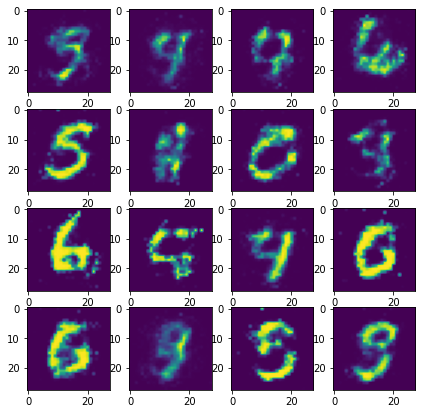

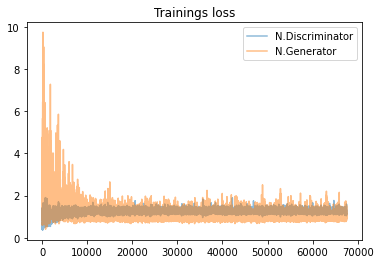

[73] -- discriminator_loss: 1.3132613897323608  -- generator_loss: 1.006101369857788
[73] -- discriminator_loss: 1.3551170825958252  -- generator_loss: 1.116135597229004
[73] -- discriminator_loss: 1.2591307163238525  -- generator_loss: 0.8443407416343689
[73] -- discriminator_loss: 1.2484891414642334  -- generator_loss: 0.9863959550857544
[73] -- discriminator_loss: 1.097564458847046  -- generator_loss: 1.0978803634643555
[73] -- discriminator_loss: 1.3322155475616455  -- generator_loss: 0.8934202194213867
[73] -- discriminator_loss: 1.258773922920227  -- generator_loss: 1.0458728075027466
[73] -- discriminator_loss: 1.2399684190750122  -- generator_loss: 1.1924147605895996
[73] -- discriminator_loss: 1.3156917095184326  -- generator_loss: 0.871126115322113
[73] -- discriminator_loss: 1.1885651350021362  -- generator_loss: 1.039852499961853
[73] -- discriminator_loss: 1.337158441543579  -- generator_loss: 0.9945576190948486
[73] -- discriminator_loss: 1.254866123199463  -- generator_l

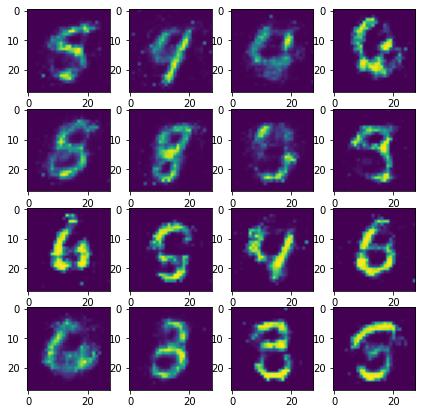

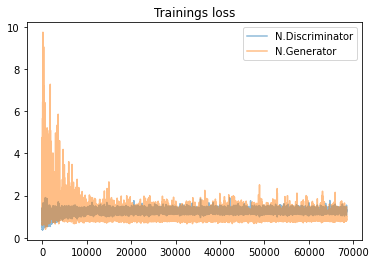

[74] -- discriminator_loss: 1.3382600545883179  -- generator_loss: 0.8534469604492188
[74] -- discriminator_loss: 1.3488506078720093  -- generator_loss: 0.8838542699813843
[74] -- discriminator_loss: 1.222137212753296  -- generator_loss: 0.8952143788337708
[74] -- discriminator_loss: 1.2773725986480713  -- generator_loss: 1.0626184940338135
[74] -- discriminator_loss: 1.326728343963623  -- generator_loss: 0.8630533814430237
[74] -- discriminator_loss: 1.316843032836914  -- generator_loss: 0.8610380291938782
[74] -- discriminator_loss: 1.3355095386505127  -- generator_loss: 0.878949761390686
[74] -- discriminator_loss: 1.2555084228515625  -- generator_loss: 1.105209469795227
[74] -- discriminator_loss: 1.308100938796997  -- generator_loss: 1.054558515548706
[74] -- discriminator_loss: 1.2392871379852295  -- generator_loss: 0.9082967638969421
[74] -- discriminator_loss: 1.4001801013946533  -- generator_loss: 0.8559719920158386
[74] -- discriminator_loss: 1.2475025653839111  -- generator_

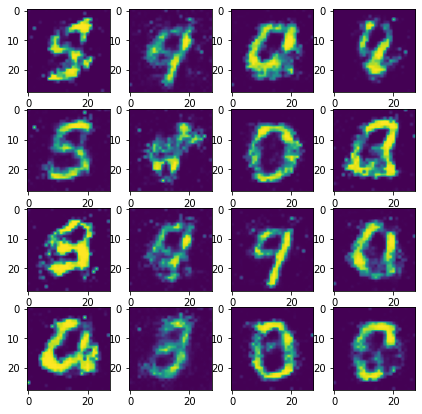

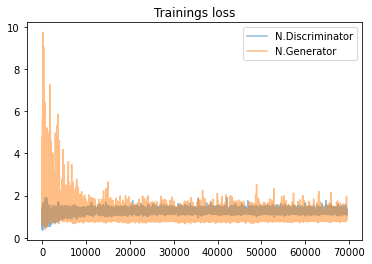

[75] -- discriminator_loss: 1.3440334796905518  -- generator_loss: 0.8428452014923096
[75] -- discriminator_loss: 1.3672080039978027  -- generator_loss: 0.914585292339325
[75] -- discriminator_loss: 1.152649998664856  -- generator_loss: 0.886959433555603
[75] -- discriminator_loss: 1.3061891794204712  -- generator_loss: 1.1683075428009033
[75] -- discriminator_loss: 1.3131921291351318  -- generator_loss: 1.4054579734802246
[75] -- discriminator_loss: 1.351445198059082  -- generator_loss: 0.846416711807251
[75] -- discriminator_loss: 1.2950811386108398  -- generator_loss: 0.8385685086250305
[75] -- discriminator_loss: 1.278278112411499  -- generator_loss: 0.9874869585037231
[75] -- discriminator_loss: 1.30301034450531  -- generator_loss: 1.252938985824585
[75] -- discriminator_loss: 1.3555442094802856  -- generator_loss: 1.5141106843948364
[75] -- discriminator_loss: 1.4608712196350098  -- generator_loss: 0.999146044254303
[75] -- discriminator_loss: 1.2981338500976562  -- generator_los

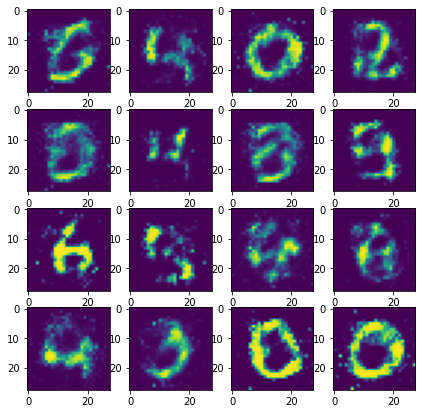

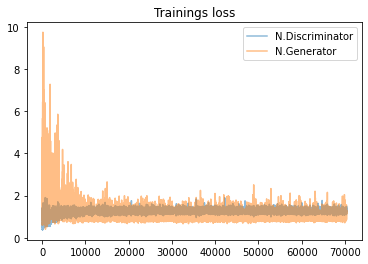

[76] -- discriminator_loss: 1.3222638368606567  -- generator_loss: 1.0802216529846191
[76] -- discriminator_loss: 1.2780418395996094  -- generator_loss: 0.903857409954071
[76] -- discriminator_loss: 1.2015008926391602  -- generator_loss: 0.9752742648124695
[76] -- discriminator_loss: 1.3371230363845825  -- generator_loss: 1.1162534952163696
[76] -- discriminator_loss: 1.2040555477142334  -- generator_loss: 1.0478520393371582
[76] -- discriminator_loss: 1.3100860118865967  -- generator_loss: 1.1056597232818604
[76] -- discriminator_loss: 1.292646884918213  -- generator_loss: 1.008725643157959
[76] -- discriminator_loss: 1.2096104621887207  -- generator_loss: 1.1855465173721313
[76] -- discriminator_loss: 1.1851201057434082  -- generator_loss: 1.0966484546661377
[76] -- discriminator_loss: 1.3091151714324951  -- generator_loss: 0.900518536567688
[76] -- discriminator_loss: 1.3448944091796875  -- generator_loss: 0.9559690952301025
[76] -- discriminator_loss: 1.287379264831543  -- generato

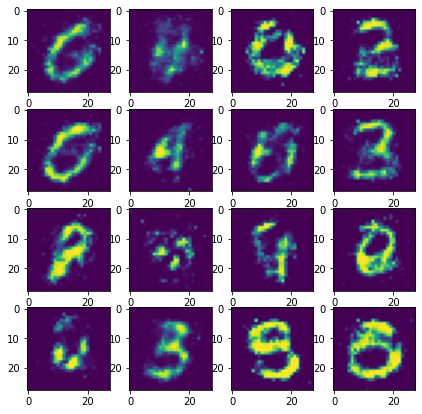

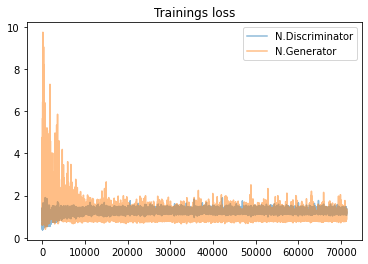

[77] -- discriminator_loss: 1.227407693862915  -- generator_loss: 0.9944964051246643
[77] -- discriminator_loss: 1.174166202545166  -- generator_loss: 1.0958480834960938
[77] -- discriminator_loss: 1.2091448307037354  -- generator_loss: 1.1402186155319214
[77] -- discriminator_loss: 1.4354760646820068  -- generator_loss: 1.0022172927856445
[77] -- discriminator_loss: 1.3186159133911133  -- generator_loss: 0.9793701171875
[77] -- discriminator_loss: 1.2532620429992676  -- generator_loss: 0.9207146763801575
[77] -- discriminator_loss: 1.2467308044433594  -- generator_loss: 0.9519544839859009
[77] -- discriminator_loss: 1.3468129634857178  -- generator_loss: 1.0790576934814453
[77] -- discriminator_loss: 1.2916369438171387  -- generator_loss: 1.0074412822723389
[77] -- discriminator_loss: 1.2635793685913086  -- generator_loss: 0.8350602388381958
[77] -- discriminator_loss: 1.2393141984939575  -- generator_loss: 0.9111018776893616
[77] -- discriminator_loss: 1.2336400747299194  -- generato

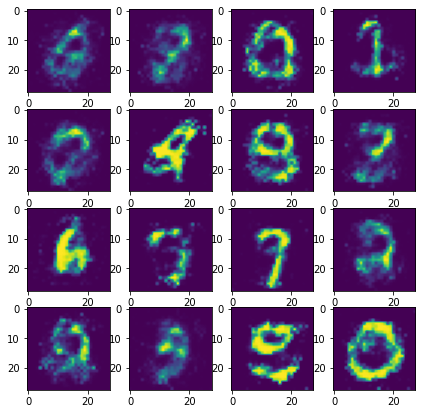

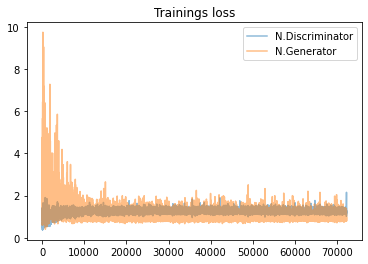

[78] -- discriminator_loss: 1.2367994785308838  -- generator_loss: 0.9348537921905518
[78] -- discriminator_loss: 1.1770141124725342  -- generator_loss: 0.9119923710823059
[78] -- discriminator_loss: 1.087278127670288  -- generator_loss: 1.586896300315857
[78] -- discriminator_loss: 1.345456838607788  -- generator_loss: 0.8239949941635132
[78] -- discriminator_loss: 1.2725639343261719  -- generator_loss: 0.7935646176338196
[78] -- discriminator_loss: 1.2586456537246704  -- generator_loss: 1.134350299835205
[78] -- discriminator_loss: 1.2030407190322876  -- generator_loss: 1.0696073770523071
[78] -- discriminator_loss: 1.2492470741271973  -- generator_loss: 0.8813058137893677
[78] -- discriminator_loss: 1.2639914751052856  -- generator_loss: 1.0126969814300537
[78] -- discriminator_loss: 1.2062162160873413  -- generator_loss: 1.1737319231033325
[78] -- discriminator_loss: 1.2565107345581055  -- generator_loss: 1.087438941001892
[78] -- discriminator_loss: 1.2204350233078003  -- generato

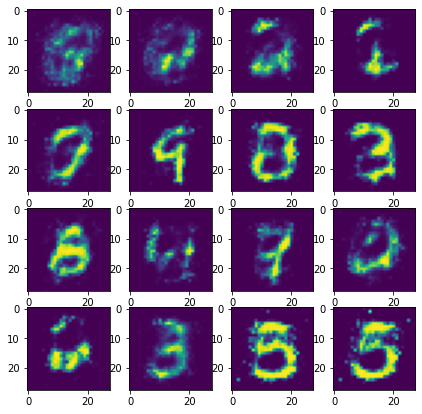

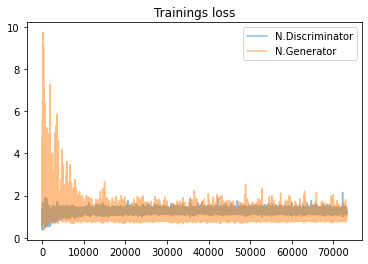

[79] -- discriminator_loss: 1.240182876586914  -- generator_loss: 0.9701986908912659
[79] -- discriminator_loss: 1.2178385257720947  -- generator_loss: 1.071536898612976
[79] -- discriminator_loss: 1.292702078819275  -- generator_loss: 0.9326022267341614
[79] -- discriminator_loss: 1.3741976022720337  -- generator_loss: 0.9692245721817017
[79] -- discriminator_loss: 1.3088747262954712  -- generator_loss: 0.9690036177635193
[79] -- discriminator_loss: 1.2725622653961182  -- generator_loss: 0.9547352194786072
[79] -- discriminator_loss: 1.3814029693603516  -- generator_loss: 1.2147148847579956
[79] -- discriminator_loss: 1.226562738418579  -- generator_loss: 1.0159915685653687
[79] -- discriminator_loss: 1.1866869926452637  -- generator_loss: 0.9724411964416504
[79] -- discriminator_loss: 1.2324464321136475  -- generator_loss: 0.9385020732879639
[79] -- discriminator_loss: 1.2765129804611206  -- generator_loss: 0.9872948527336121
[79] -- discriminator_loss: 1.2772555351257324  -- generat

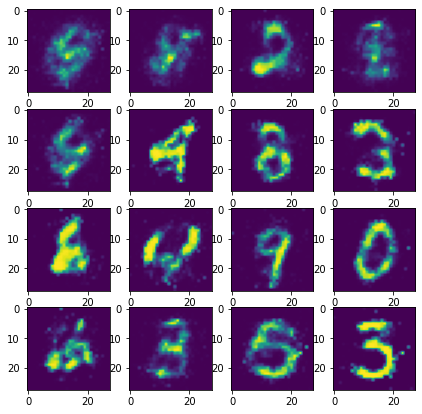

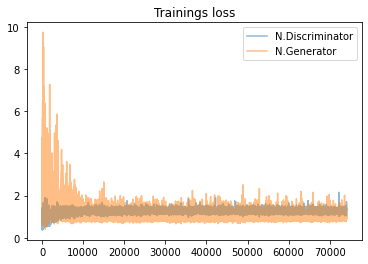

[80] -- discriminator_loss: 1.3000030517578125  -- generator_loss: 0.9386407136917114
[80] -- discriminator_loss: 1.2164616584777832  -- generator_loss: 1.4637246131896973
[80] -- discriminator_loss: 1.3017274141311646  -- generator_loss: 0.8705981969833374
[80] -- discriminator_loss: 1.3780298233032227  -- generator_loss: 0.8242822885513306
[80] -- discriminator_loss: 1.2684571743011475  -- generator_loss: 0.9758588075637817
[80] -- discriminator_loss: 1.267085075378418  -- generator_loss: 0.976614236831665
[80] -- discriminator_loss: 1.2744677066802979  -- generator_loss: 0.9194543361663818
[80] -- discriminator_loss: 1.296941876411438  -- generator_loss: 0.9287354946136475
[80] -- discriminator_loss: 1.121739387512207  -- generator_loss: 1.0231884717941284
[80] -- discriminator_loss: 1.324110984802246  -- generator_loss: 1.0790560245513916
[80] -- discriminator_loss: 1.2160816192626953  -- generator_loss: 0.9752655029296875
[80] -- discriminator_loss: 1.1292017698287964  -- generato

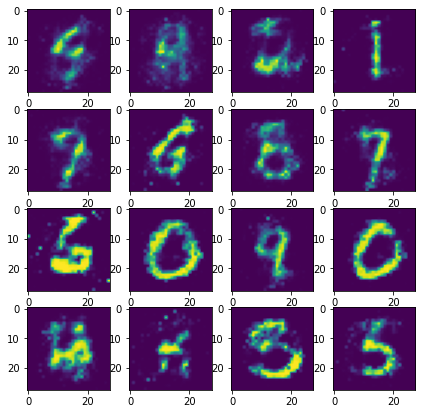

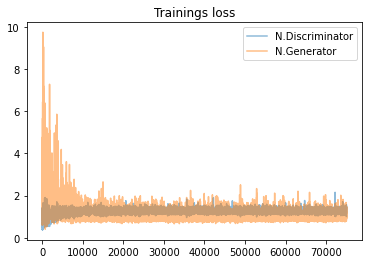

[81] -- discriminator_loss: 1.3451602458953857  -- generator_loss: 1.2867445945739746
[81] -- discriminator_loss: 1.2313259840011597  -- generator_loss: 1.061380386352539
[81] -- discriminator_loss: 1.2537263631820679  -- generator_loss: 1.0998566150665283
[81] -- discriminator_loss: 1.2898790836334229  -- generator_loss: 1.1375706195831299
[81] -- discriminator_loss: 1.258469820022583  -- generator_loss: 0.9366939067840576
[81] -- discriminator_loss: 1.3626298904418945  -- generator_loss: 1.0376801490783691
[81] -- discriminator_loss: 1.2220345735549927  -- generator_loss: 1.03285551071167
[81] -- discriminator_loss: 1.076364278793335  -- generator_loss: 1.202670931816101
[81] -- discriminator_loss: 1.2472201585769653  -- generator_loss: 1.0225163698196411
[81] -- discriminator_loss: 1.3419685363769531  -- generator_loss: 1.0203237533569336
[81] -- discriminator_loss: 1.385610818862915  -- generator_loss: 0.887265145778656
[81] -- discriminator_loss: 1.1870059967041016  -- generator_l

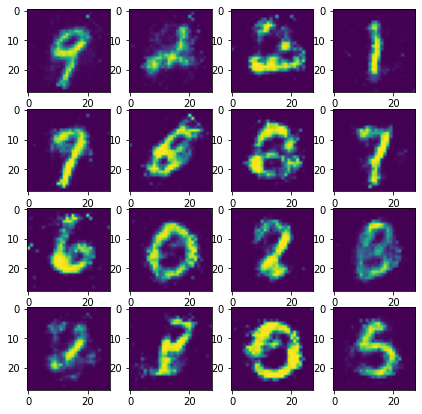

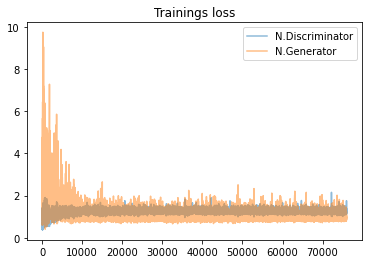

[82] -- discriminator_loss: 1.2656826972961426  -- generator_loss: 0.9211972951889038
[82] -- discriminator_loss: 1.236391305923462  -- generator_loss: 0.8562324643135071
[82] -- discriminator_loss: 1.1603419780731201  -- generator_loss: 0.9960769414901733
[82] -- discriminator_loss: 1.517159342765808  -- generator_loss: 1.0721815824508667
[82] -- discriminator_loss: 1.348818302154541  -- generator_loss: 0.8899396657943726
[82] -- discriminator_loss: 1.3016619682312012  -- generator_loss: 0.940374493598938
[82] -- discriminator_loss: 1.3494148254394531  -- generator_loss: 0.7869834303855896
[82] -- discriminator_loss: 1.229182481765747  -- generator_loss: 0.9959725737571716
[82] -- discriminator_loss: 1.1874995231628418  -- generator_loss: 1.0392342805862427
[82] -- discriminator_loss: 1.250227689743042  -- generator_loss: 0.9363869428634644
[82] -- discriminator_loss: 1.2930667400360107  -- generator_loss: 0.8631846308708191
[82] -- discriminator_loss: 1.2343108654022217  -- generator

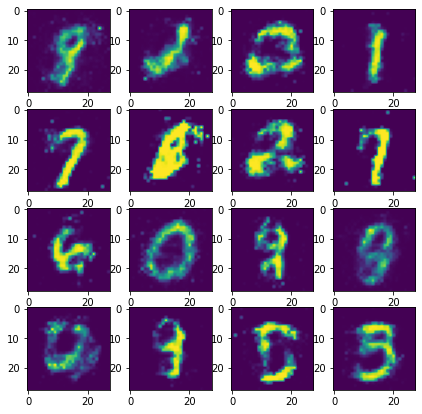

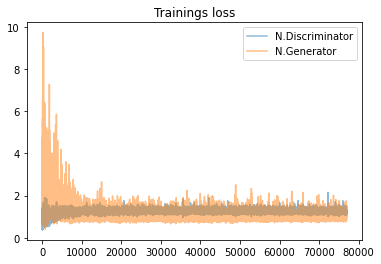

[83] -- discriminator_loss: 1.3800164461135864  -- generator_loss: 1.051064372062683
[83] -- discriminator_loss: 1.2979798316955566  -- generator_loss: 0.8369871377944946
[83] -- discriminator_loss: 1.3456534147262573  -- generator_loss: 0.8807088136672974
[83] -- discriminator_loss: 1.3480861186981201  -- generator_loss: 1.0337622165679932
[83] -- discriminator_loss: 1.2504521608352661  -- generator_loss: 1.1765636205673218
[83] -- discriminator_loss: 1.2436797618865967  -- generator_loss: 0.9634554386138916
[83] -- discriminator_loss: 1.2757360935211182  -- generator_loss: 0.9687002897262573
[83] -- discriminator_loss: 1.2820557355880737  -- generator_loss: 1.0806902647018433
[83] -- discriminator_loss: 1.2015533447265625  -- generator_loss: 1.2585294246673584
[83] -- discriminator_loss: 1.3144683837890625  -- generator_loss: 0.8975967168807983
[83] -- discriminator_loss: 1.3467028141021729  -- generator_loss: 0.8918769359588623
[83] -- discriminator_loss: 1.2290219068527222  -- gene

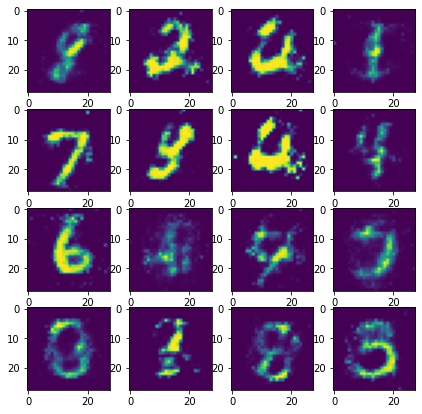

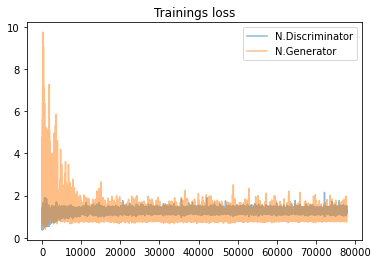

[84] -- discriminator_loss: 1.272053837776184  -- generator_loss: 0.8770902156829834
[84] -- discriminator_loss: 1.3055202960968018  -- generator_loss: 0.8800906538963318
[84] -- discriminator_loss: 1.349271297454834  -- generator_loss: 0.8896588087081909
[84] -- discriminator_loss: 1.355373501777649  -- generator_loss: 0.914231538772583
[84] -- discriminator_loss: 1.4068691730499268  -- generator_loss: 0.9809056520462036
[84] -- discriminator_loss: 1.2953331470489502  -- generator_loss: 0.9956771731376648
[84] -- discriminator_loss: 1.3496310710906982  -- generator_loss: 0.9805006980895996
[84] -- discriminator_loss: 1.279080867767334  -- generator_loss: 0.9245649576187134
[84] -- discriminator_loss: 1.1946548223495483  -- generator_loss: 1.003050446510315
[84] -- discriminator_loss: 1.262840747833252  -- generator_loss: 1.0799471139907837
[84] -- discriminator_loss: 1.221060037612915  -- generator_loss: 1.2068297863006592
[84] -- discriminator_loss: 1.1437561511993408  -- generator_l

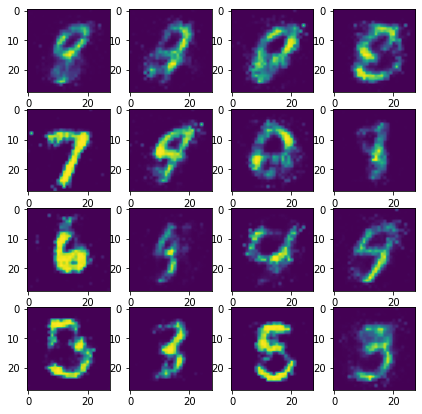

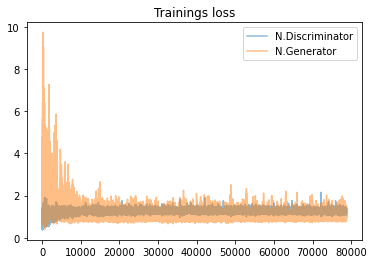

[85] -- discriminator_loss: 1.2733721733093262  -- generator_loss: 0.9346872568130493
[85] -- discriminator_loss: 1.2734668254852295  -- generator_loss: 1.0106278657913208
[85] -- discriminator_loss: 1.1473666429519653  -- generator_loss: 1.0338729619979858
[85] -- discriminator_loss: 1.3426613807678223  -- generator_loss: 1.02395761013031
[85] -- discriminator_loss: 1.387786865234375  -- generator_loss: 1.0496954917907715
[85] -- discriminator_loss: 1.2622554302215576  -- generator_loss: 1.0188992023468018
[85] -- discriminator_loss: 1.233503818511963  -- generator_loss: 0.9060633182525635
[85] -- discriminator_loss: 1.2354987859725952  -- generator_loss: 1.1661566495895386
[85] -- discriminator_loss: 1.2289177179336548  -- generator_loss: 1.0130854845046997
[85] -- discriminator_loss: 1.2348945140838623  -- generator_loss: 0.9819462299346924
[85] -- discriminator_loss: 1.297386884689331  -- generator_loss: 0.9256852865219116
[85] -- discriminator_loss: 1.2595863342285156  -- generato

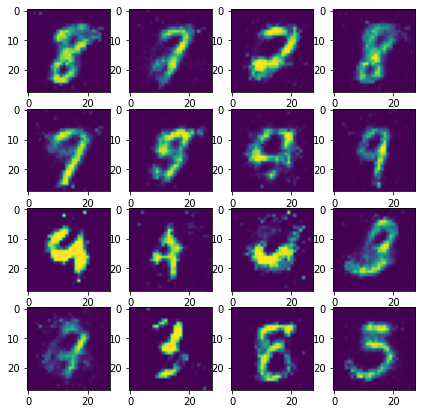

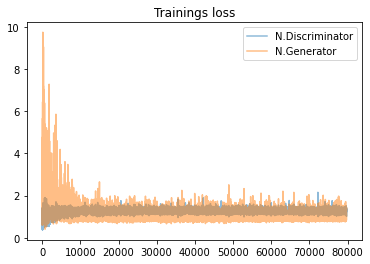

[86] -- discriminator_loss: 1.2220497131347656  -- generator_loss: 1.3141132593154907
[86] -- discriminator_loss: 1.2760149240493774  -- generator_loss: 1.1581625938415527
[86] -- discriminator_loss: 1.2846002578735352  -- generator_loss: 1.0725951194763184
[86] -- discriminator_loss: 1.4197529554367065  -- generator_loss: 0.9436606168746948
[86] -- discriminator_loss: 1.2894338369369507  -- generator_loss: 1.0711616277694702
[86] -- discriminator_loss: 1.2856056690216064  -- generator_loss: 0.9537503719329834
[86] -- discriminator_loss: 1.3516805171966553  -- generator_loss: 1.0195869207382202
[86] -- discriminator_loss: 1.2367234230041504  -- generator_loss: 1.0874041318893433
[86] -- discriminator_loss: 1.2959673404693604  -- generator_loss: 0.8731905221939087
[86] -- discriminator_loss: 1.2393519878387451  -- generator_loss: 1.1486430168151855
[86] -- discriminator_loss: 1.2926334142684937  -- generator_loss: 1.1361546516418457
[86] -- discriminator_loss: 1.2535998821258545  -- gen

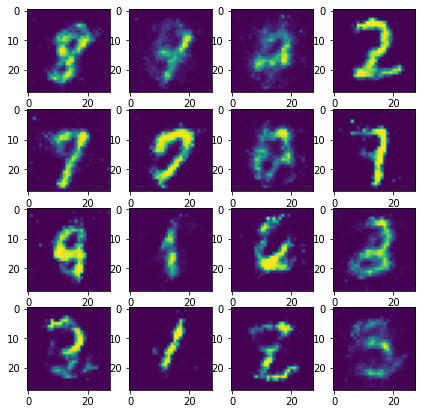

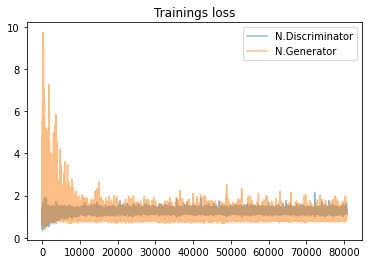

[87] -- discriminator_loss: 1.2845242023468018  -- generator_loss: 0.8245301842689514
[87] -- discriminator_loss: 1.3178627490997314  -- generator_loss: 0.8522942066192627
[87] -- discriminator_loss: 1.2661126852035522  -- generator_loss: 0.9961550235748291
[87] -- discriminator_loss: 1.278092622756958  -- generator_loss: 1.1626381874084473
[87] -- discriminator_loss: 1.3384342193603516  -- generator_loss: 0.9021826386451721
[87] -- discriminator_loss: 1.214461326599121  -- generator_loss: 0.9008461833000183
[87] -- discriminator_loss: 1.2212599515914917  -- generator_loss: 1.1239497661590576
[87] -- discriminator_loss: 1.2341582775115967  -- generator_loss: 1.1790449619293213
[87] -- discriminator_loss: 1.2849345207214355  -- generator_loss: 0.9314102530479431
[87] -- discriminator_loss: 1.2209925651550293  -- generator_loss: 0.9120808839797974
[87] -- discriminator_loss: 1.3189425468444824  -- generator_loss: 0.8389261364936829
[87] -- discriminator_loss: 1.210936427116394  -- genera

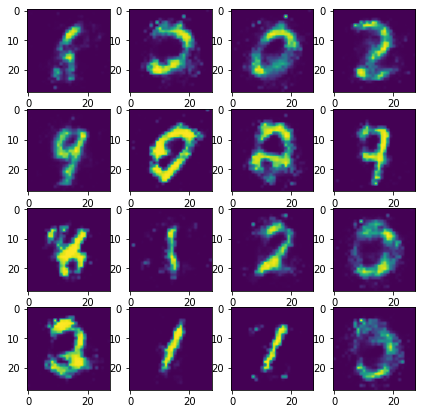

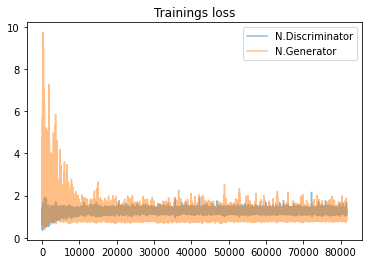

[88] -- discriminator_loss: 1.2514894008636475  -- generator_loss: 1.317361831665039
[88] -- discriminator_loss: 1.208349347114563  -- generator_loss: 1.2141773700714111
[88] -- discriminator_loss: 1.2575671672821045  -- generator_loss: 0.9809701442718506
[88] -- discriminator_loss: 1.36176598072052  -- generator_loss: 0.9264901876449585
[88] -- discriminator_loss: 1.29342520236969  -- generator_loss: 1.14206862449646
[88] -- discriminator_loss: 1.372124433517456  -- generator_loss: 0.9609041213989258
[88] -- discriminator_loss: 1.316738486289978  -- generator_loss: 1.0539253950119019
[88] -- discriminator_loss: 1.2554676532745361  -- generator_loss: 1.2222106456756592
[88] -- discriminator_loss: 1.27609121799469  -- generator_loss: 1.0417218208312988
[88] -- discriminator_loss: 1.3624248504638672  -- generator_loss: 0.786019504070282
[88] -- discriminator_loss: 1.2743804454803467  -- generator_loss: 0.8816235065460205
[88] -- discriminator_loss: 1.2109142541885376  -- generator_loss: 

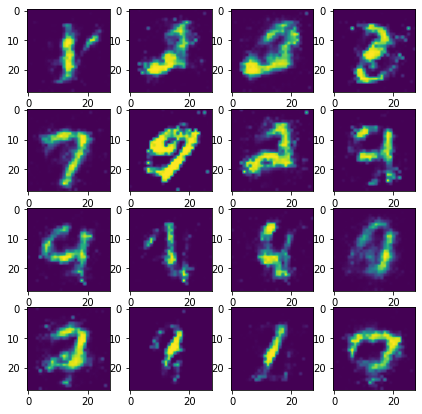

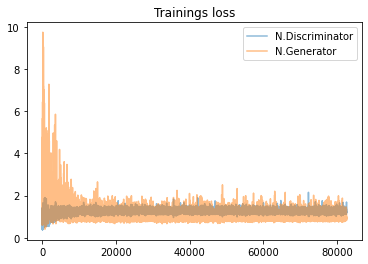

[89] -- discriminator_loss: 1.2324796915054321  -- generator_loss: 0.9303498268127441
[89] -- discriminator_loss: 1.2027113437652588  -- generator_loss: 0.9586142897605896
[89] -- discriminator_loss: 1.1716991662979126  -- generator_loss: 1.073620080947876
[89] -- discriminator_loss: 1.3288755416870117  -- generator_loss: 0.9721320271492004
[89] -- discriminator_loss: 1.30210280418396  -- generator_loss: 0.9543958306312561
[89] -- discriminator_loss: 1.2302708625793457  -- generator_loss: 1.2955981492996216
[89] -- discriminator_loss: 1.3012105226516724  -- generator_loss: 0.9561803936958313
[89] -- discriminator_loss: 1.2458715438842773  -- generator_loss: 1.0029093027114868
[89] -- discriminator_loss: 1.1820794343948364  -- generator_loss: 1.1291818618774414
[89] -- discriminator_loss: 1.3302385807037354  -- generator_loss: 0.9278439879417419
[89] -- discriminator_loss: 1.3117954730987549  -- generator_loss: 0.8367255330085754
[89] -- discriminator_loss: 1.2418172359466553  -- genera

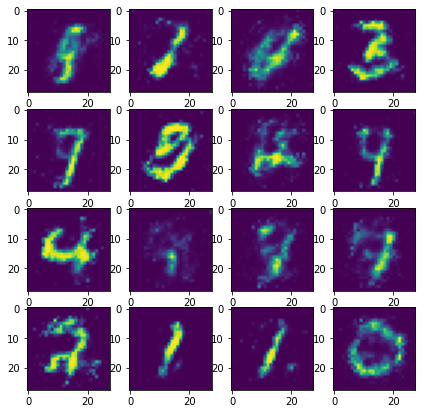

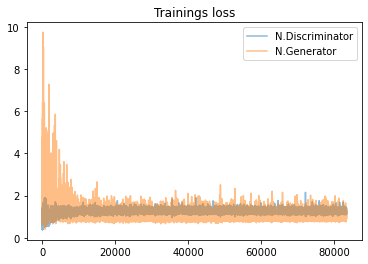

[90] -- discriminator_loss: 1.3166968822479248  -- generator_loss: 1.0712993144989014
[90] -- discriminator_loss: 1.363412618637085  -- generator_loss: 0.9023329019546509
[90] -- discriminator_loss: 1.2660531997680664  -- generator_loss: 0.9104759097099304
[90] -- discriminator_loss: 1.330115795135498  -- generator_loss: 0.9346242547035217
[90] -- discriminator_loss: 1.2607918977737427  -- generator_loss: 0.9635701775550842
[90] -- discriminator_loss: 1.2540693283081055  -- generator_loss: 0.9184986352920532
[90] -- discriminator_loss: 1.2627239227294922  -- generator_loss: 0.9762395620346069
[90] -- discriminator_loss: 1.1886441707611084  -- generator_loss: 1.2285981178283691
[90] -- discriminator_loss: 1.2881319522857666  -- generator_loss: 1.0138897895812988
[90] -- discriminator_loss: 1.288710355758667  -- generator_loss: 1.0104796886444092
[90] -- discriminator_loss: 1.308506727218628  -- generator_loss: 0.923332929611206
[90] -- discriminator_loss: 1.2967779636383057  -- generato

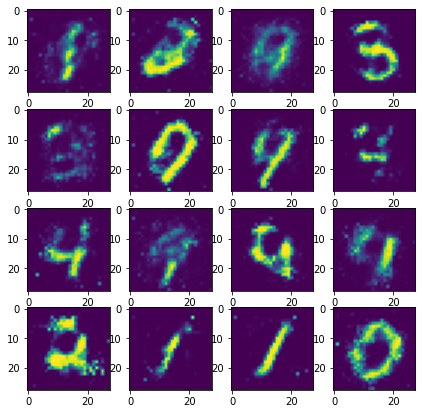

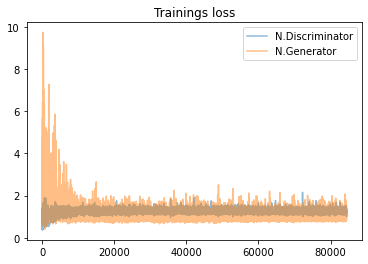

[91] -- discriminator_loss: 1.2550818920135498  -- generator_loss: 1.3234251737594604
[91] -- discriminator_loss: 1.1635935306549072  -- generator_loss: 1.4241896867752075
[91] -- discriminator_loss: 1.3417569398880005  -- generator_loss: 1.1182936429977417
[91] -- discriminator_loss: 1.331150770187378  -- generator_loss: 0.9051362872123718
[91] -- discriminator_loss: 1.2883055210113525  -- generator_loss: 0.8972924947738647
[91] -- discriminator_loss: 1.281782865524292  -- generator_loss: 1.0004782676696777
[91] -- discriminator_loss: 1.2440342903137207  -- generator_loss: 0.8708130121231079
[91] -- discriminator_loss: 1.1903433799743652  -- generator_loss: 0.9217804670333862
[91] -- discriminator_loss: 1.270430326461792  -- generator_loss: 1.154281735420227
[91] -- discriminator_loss: 1.1567652225494385  -- generator_loss: 1.0908598899841309
[91] -- discriminator_loss: 1.2429473400115967  -- generator_loss: 1.193031907081604
[91] -- discriminator_loss: 1.2458901405334473  -- generato

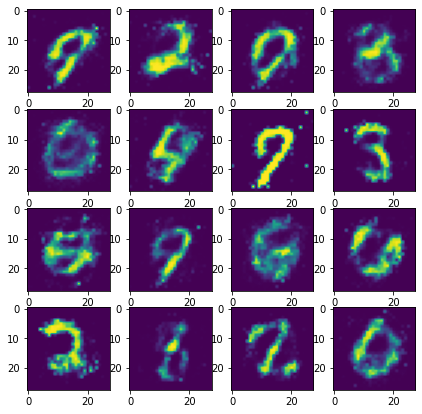

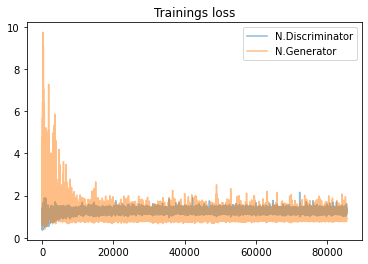

[92] -- discriminator_loss: 1.2947744131088257  -- generator_loss: 0.7948474884033203
[92] -- discriminator_loss: 1.1916062831878662  -- generator_loss: 0.7499092221260071
[92] -- discriminator_loss: 1.2380712032318115  -- generator_loss: 1.0462595224380493
[92] -- discriminator_loss: 1.2813433408737183  -- generator_loss: 1.0395159721374512
[92] -- discriminator_loss: 1.2856812477111816  -- generator_loss: 0.9803174734115601
[92] -- discriminator_loss: 1.182100772857666  -- generator_loss: 0.9881697297096252
[92] -- discriminator_loss: 1.3427202701568604  -- generator_loss: 0.8457657098770142
[92] -- discriminator_loss: 1.243607997894287  -- generator_loss: 0.9483085870742798
[92] -- discriminator_loss: 1.1556105613708496  -- generator_loss: 1.3175244331359863
[92] -- discriminator_loss: 1.324695110321045  -- generator_loss: 1.0959073305130005
[92] -- discriminator_loss: 1.2708020210266113  -- generator_loss: 0.8858482837677002
[92] -- discriminator_loss: 1.2696471214294434  -- genera

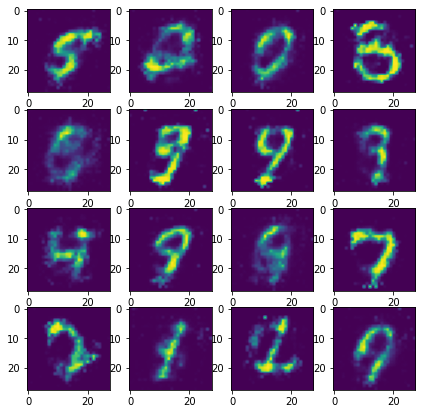

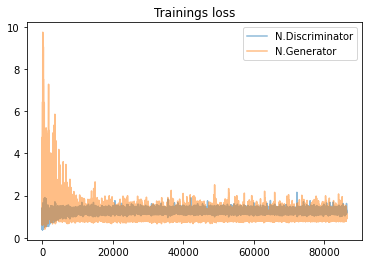

[93] -- discriminator_loss: 1.3227298259735107  -- generator_loss: 0.9068748950958252
[93] -- discriminator_loss: 1.2048976421356201  -- generator_loss: 1.095314383506775
[93] -- discriminator_loss: 1.2834283113479614  -- generator_loss: 1.0169942378997803
[93] -- discriminator_loss: 1.3784747123718262  -- generator_loss: 0.9309687614440918
[93] -- discriminator_loss: 1.2650048732757568  -- generator_loss: 1.000575304031372
[93] -- discriminator_loss: 1.3226604461669922  -- generator_loss: 0.9491398334503174
[93] -- discriminator_loss: 1.2771904468536377  -- generator_loss: 1.1067419052124023
[93] -- discriminator_loss: 1.2444990873336792  -- generator_loss: 0.9561470150947571
[93] -- discriminator_loss: 1.3303098678588867  -- generator_loss: 0.9323002696037292
[93] -- discriminator_loss: 1.1816999912261963  -- generator_loss: 1.5967072248458862
[93] -- discriminator_loss: 1.309079647064209  -- generator_loss: 0.9539635181427002
[93] -- discriminator_loss: 1.224128246307373  -- generat

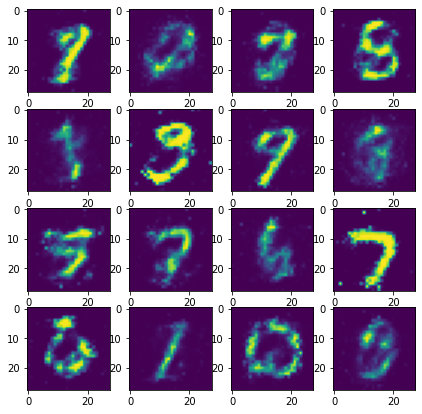

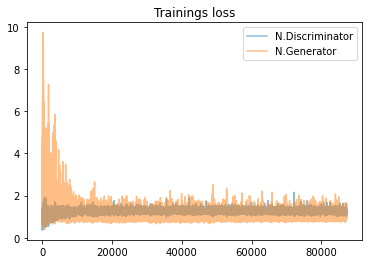

[94] -- discriminator_loss: 1.2917734384536743  -- generator_loss: 0.9200732707977295
[94] -- discriminator_loss: 1.206731915473938  -- generator_loss: 1.0572113990783691
[94] -- discriminator_loss: 1.2680256366729736  -- generator_loss: 0.8380584716796875
[94] -- discriminator_loss: 1.3710949420928955  -- generator_loss: 0.9091935157775879
[94] -- discriminator_loss: 1.3112120628356934  -- generator_loss: 1.0764455795288086
[94] -- discriminator_loss: 1.3144032955169678  -- generator_loss: 1.0482178926467896
[94] -- discriminator_loss: 1.2974724769592285  -- generator_loss: 0.8683187961578369
[94] -- discriminator_loss: 1.271437644958496  -- generator_loss: 0.9698436260223389
[94] -- discriminator_loss: 1.3297326564788818  -- generator_loss: 1.1439213752746582
[94] -- discriminator_loss: 1.2913252115249634  -- generator_loss: 0.8630268573760986
[94] -- discriminator_loss: 1.2435334920883179  -- generator_loss: 0.8902202248573303
[94] -- discriminator_loss: 1.2323123216629028  -- gener

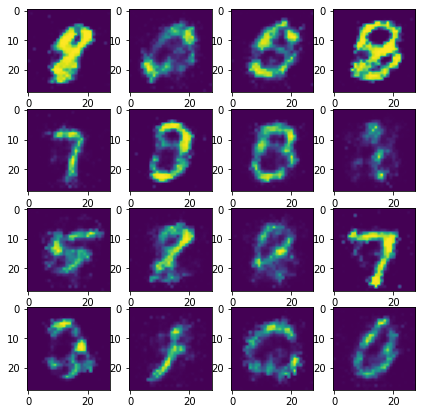

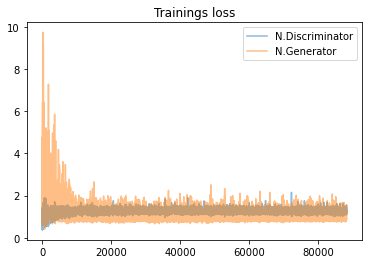

[95] -- discriminator_loss: 1.3025015592575073  -- generator_loss: 0.9938095211982727
[95] -- discriminator_loss: 1.246634602546692  -- generator_loss: 1.0356297492980957
[95] -- discriminator_loss: 1.2126755714416504  -- generator_loss: 1.154457926750183
[95] -- discriminator_loss: 1.356752872467041  -- generator_loss: 0.971991777420044
[95] -- discriminator_loss: 1.3196288347244263  -- generator_loss: 0.9038469791412354
[95] -- discriminator_loss: 1.2808458805084229  -- generator_loss: 0.8833523988723755
[95] -- discriminator_loss: 1.179626703262329  -- generator_loss: 0.8550969362258911
[95] -- discriminator_loss: 1.2312768697738647  -- generator_loss: 1.2067515850067139
[95] -- discriminator_loss: 1.345106601715088  -- generator_loss: 1.0650193691253662
[95] -- discriminator_loss: 1.289729356765747  -- generator_loss: 0.9703869819641113
[95] -- discriminator_loss: 1.3307490348815918  -- generator_loss: 1.0248063802719116
[95] -- discriminator_loss: 1.2537769079208374  -- generator_

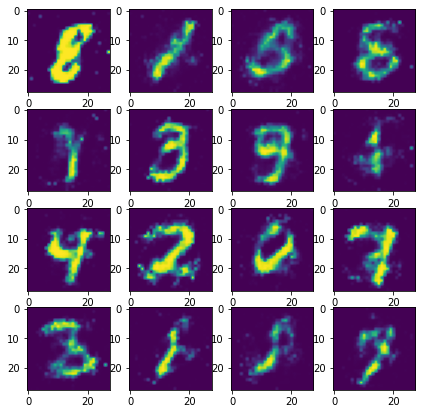

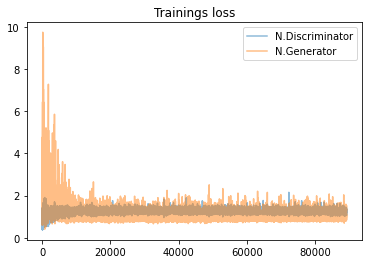

[96] -- discriminator_loss: 1.2213127613067627  -- generator_loss: 1.2478446960449219
[96] -- discriminator_loss: 1.250688910484314  -- generator_loss: 1.1446794271469116
[96] -- discriminator_loss: 1.286553144454956  -- generator_loss: 1.217375636100769
[96] -- discriminator_loss: 1.3824076652526855  -- generator_loss: 0.9840152263641357
[96] -- discriminator_loss: 1.22299325466156  -- generator_loss: 1.0670762062072754
[96] -- discriminator_loss: 1.392207145690918  -- generator_loss: 0.9702978134155273
[96] -- discriminator_loss: 1.3001384735107422  -- generator_loss: 0.8932011723518372
[96] -- discriminator_loss: 1.1691207885742188  -- generator_loss: 1.10056471824646
[96] -- discriminator_loss: 1.2387789487838745  -- generator_loss: 1.0308961868286133
[96] -- discriminator_loss: 1.2357707023620605  -- generator_loss: 1.0095635652542114
[96] -- discriminator_loss: 1.4498910903930664  -- generator_loss: 0.948371171951294
[96] -- discriminator_loss: 1.3258522748947144  -- generator_lo

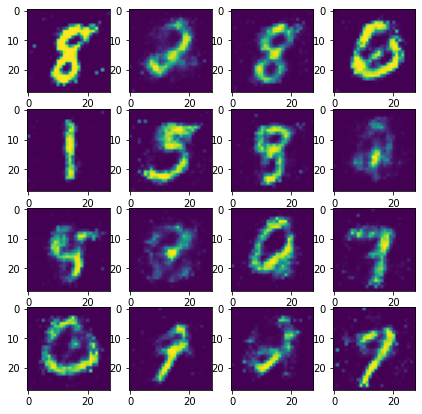

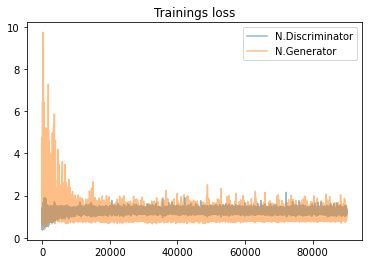

[97] -- discriminator_loss: 1.3489362001419067  -- generator_loss: 0.8732047080993652
[97] -- discriminator_loss: 1.2054789066314697  -- generator_loss: 0.7985037565231323
[97] -- discriminator_loss: 1.3888933658599854  -- generator_loss: 1.0060375928878784
[97] -- discriminator_loss: 1.350710153579712  -- generator_loss: 1.0224652290344238
[97] -- discriminator_loss: 1.2415454387664795  -- generator_loss: 1.1085742712020874
[97] -- discriminator_loss: 1.2617822885513306  -- generator_loss: 0.8787930011749268
[97] -- discriminator_loss: 1.241312026977539  -- generator_loss: 0.9551381468772888
[97] -- discriminator_loss: 1.2088899612426758  -- generator_loss: 1.0004222393035889
[97] -- discriminator_loss: 1.2531120777130127  -- generator_loss: 1.060417652130127
[97] -- discriminator_loss: 1.331164836883545  -- generator_loss: 0.9049250483512878
[97] -- discriminator_loss: 1.299177885055542  -- generator_loss: 0.8397518396377563
[97] -- discriminator_loss: 1.2532520294189453  -- generato

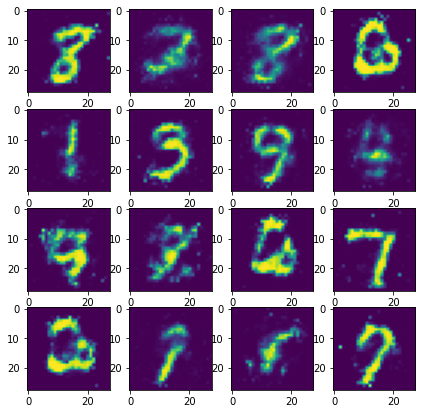

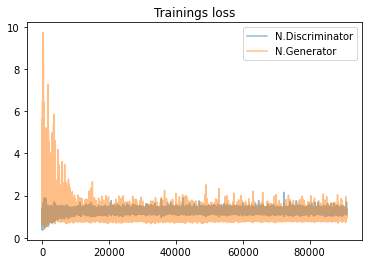

[98] -- discriminator_loss: 1.2911944389343262  -- generator_loss: 1.4725334644317627
[98] -- discriminator_loss: 1.3058425188064575  -- generator_loss: 1.1797107458114624
[98] -- discriminator_loss: 1.2957756519317627  -- generator_loss: 0.954689621925354
[98] -- discriminator_loss: 1.3933361768722534  -- generator_loss: 0.8822954893112183
[98] -- discriminator_loss: 1.2615163326263428  -- generator_loss: 1.0156549215316772
[98] -- discriminator_loss: 1.3453989028930664  -- generator_loss: 0.9060717821121216
[98] -- discriminator_loss: 1.2547882795333862  -- generator_loss: 1.4855769872665405
[98] -- discriminator_loss: 1.3637572526931763  -- generator_loss: 1.140389323234558
[98] -- discriminator_loss: 1.3251373767852783  -- generator_loss: 0.8810364007949829
[98] -- discriminator_loss: 1.2221471071243286  -- generator_loss: 1.2541502714157104
[98] -- discriminator_loss: 1.2762744426727295  -- generator_loss: 0.9820587038993835
[98] -- discriminator_loss: 1.2873358726501465  -- gener

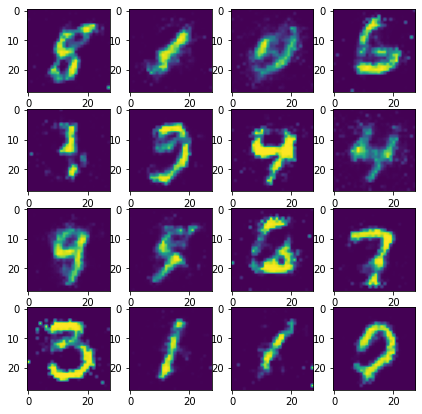

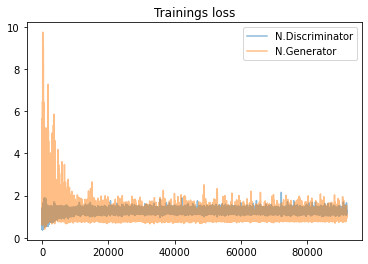

[99] -- discriminator_loss: 1.3810911178588867  -- generator_loss: 0.9504950642585754
[99] -- discriminator_loss: 1.360117793083191  -- generator_loss: 0.9986796379089355
[99] -- discriminator_loss: 1.3550090789794922  -- generator_loss: 1.0419161319732666
[99] -- discriminator_loss: 1.324280858039856  -- generator_loss: 0.913554847240448
[99] -- discriminator_loss: 1.384655475616455  -- generator_loss: 0.867312490940094
[99] -- discriminator_loss: 1.2644176483154297  -- generator_loss: 1.1216769218444824
[99] -- discriminator_loss: 1.301931619644165  -- generator_loss: 1.1263582706451416
[99] -- discriminator_loss: 1.2798454761505127  -- generator_loss: 1.0900864601135254
[99] -- discriminator_loss: 1.2628278732299805  -- generator_loss: 0.9809509515762329
[99] -- discriminator_loss: 1.2798770666122437  -- generator_loss: 0.9795792698860168
[99] -- discriminator_loss: 1.2555606365203857  -- generator_loss: 0.9495370388031006
[99] -- discriminator_loss: 1.3212432861328125  -- generator

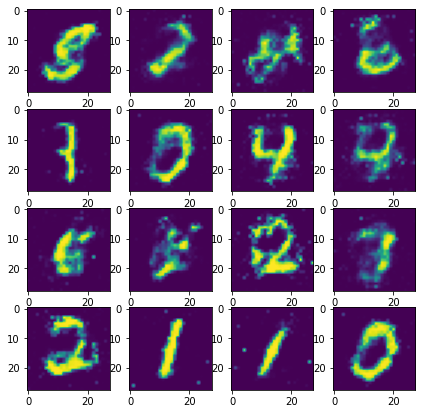

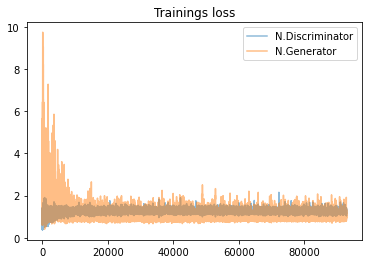

In [16]:
import pickle as pkl

max_epochs = 100

samples = list()
losses =  list()
d_loss_arr = list()
g_loss_arr = list()

Z = torch.from_numpy(np.random.uniform(-1, 1, size=(16, 100))).float()

D.train()
G.train()
                           
for epoch in range(1, max_epochs):
    for index, (img, l) in enumerate(train):
        img = img * 2 - 1 
        
        d_optimizer.zero_grad()
        
        fake_images = G(torch.from_numpy(np.random.uniform(-1, 1, size=(img.size(0), 100))).float())

        d_loss = (real_loss(D(img))) + fake_loss(D(fake_images))
        d_loss.backward()
        d_optimizer.step()
        
        g_optimizer.zero_grad()

        fake_images = G(torch.from_numpy(np.random.uniform(-1, 1, size=(img.size(0), 100))).float())

        g_loss = real_loss(D(fake_images)) 
        
       
        g_loss.backward()
        g_optimizer.step()
        
        d_loss_arr.append(d_loss.item())
        g_loss_arr.append(g_loss.item())
        
      
        if index % 10 == 0 or index == 1:
            print(f'[{epoch}] -- discriminator_loss: {d_loss.item()}  -- generator_loss: {g_loss.item()}')
        

    losses.append((d_loss.item(), g_loss.item()))

    G.eval() 
    samples.append(G(Z))
    G.train()
    
    show_training_sample(samples)
    show_training_loss(d_loss_arr, g_loss_arr)